# Reinforcement Q-learning simple NN as function approximation

- Portfolio grid of size 10 (0 to 1)
- 2 hidden neural layers 
- Training

In [7]:
# Initialization
import numpy as np
import pandas as pd
import random
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
data = pd.read_csv('data.csv') #Three stocks (R,X_s,X_b,s_nom,s_pe,s_spr) 

In [8]:
data = pd.read_excel('sim_data_BVAR.xlsx') #Three stocks (R,X_s,X_b) Without predictors

# Initialization of the Tensorflow placeholders and the network

In [9]:
num_lags = 10
num_stocks=3
num_inputvar = (num_lags+1)*num_stocks
num_actions=10
hidden1 = 20
hidden2 = 45
hidden3 = 20

#Initialize Neural Network and set-up the placeholders
tf.reset_default_graph()
NN_input = tf.placeholder(shape=[1,num_inputvar],dtype=tf.float32)
# w1 = tf.Variable(tf.random_uniform([num_inputvar,hidden1],0,1))
# w2 = tf.Variable(tf.random_uniform([hidden1,hidden2],0,1))
# w3 = tf.Variable(tf.random_uniform([hidden2,hidden3],0,1))
# w4 = tf.Variable(tf.random_uniform([hidden3,num_actions],0,1))
# b1 = tf.Variable(np.zeros((1,hidden1)), dtype=tf.float32)
# b2 = tf.Variable(np.zeros((1,hidden2)), dtype=tf.float32)
# b3 = tf.Variable(np.zeros((1,hidden3)), dtype=tf.float32)
# b4 = tf.Variable(np.zeros((1,num_actions)), dtype=tf.float32)

w1 = tf.Variable(tf.random_uniform([num_inputvar,hidden1],0,0.01))
b1 = tf.Variable(np.ones((1,hidden1)), dtype=tf.float32) 
w2 = tf.Variable(tf.random_uniform([hidden1,num_actions],0,0.01))
b2 = tf.Variable(np.ones((1,num_actions)), dtype=tf.float32) 
# h1 = tf.add(tf.matmul(NN_input,w1),b1)
# # h_drop1 = tf.nn.dropout(h1,0.5)
# a1 = tf.nn.softmax(h1)

# h2 = tf.add(tf.matmul(a1,w2),b2)
# # h_drop2 = tf.nn.dropout(h2,0.3)
# a2 = tf.nn.softmax(h2)

# h3 = tf.add(tf.matmul(a2,w3),b3)
# # h_drop3 = tf.nn.dropout(h3,0.1)
# a3 = tf.nn.softmax(h3)

# ol = tf.add(tf.matmul(a3,w4),b4)
# output = tf.nn.softmax(ol)

outputh1 = tf.matmul(NN_input,w1)
# outputh1 = tf.nn.softmax(h1)
h2 = tf.matmul(outputh1,w2)
output = tf.nn.softmax(h2)
A_Max = tf.argmax(output,1)

Q_Next = tf.placeholder(shape=[1,num_actions],dtype=tf.float32)
loss = tf.reduce_sum(tf.square(Q_Next - output))



learning_rate = tf.placeholder(tf.float32, shape=[])
trainer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate)
optmzr = trainer.minimize(loss)


# A_Max = tf.argmax(output,1)
# Calculate loss for the NN from the Q values
# Q_Next = tf.placeholder(shape=[1,num_actions],dtype=tf.float32)
# diff = tf.subtract(Q_Next,output)
# loss = tf.reduce_sum(tf.multiply(diff,diff))

# cross_entropy = tf.reduce_mean(-tf.reduce_sum(a4 * tf.log(Q_Next), reduction_indices=[1]))
# optmzr = tf.train.GradientDescentOptimizer(learning_rate = learning_rate).minimize(loss)
A = np.linspace(0,1,num_actions) # portfolio weights of stocks (1-weight) is the weight in the bonds

# Training of the NN function approximation

1993-10-01 00:00:00


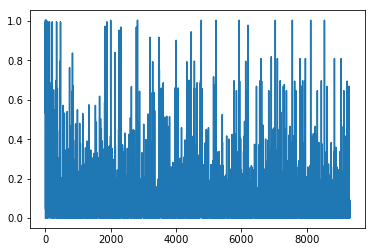

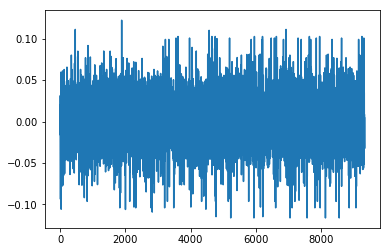

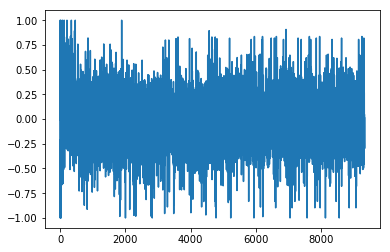

466
0.767468393589
[ 1.          1.          0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.66666667  0.44444444  0.44444444  1.          1.          1.
  1.          0.11111111  1.          0.77777778  0.66666667  0.44444444
  0.22222222  0.22222222  0.33333333  0.44444444  0.22222222  0.22222222
  1.          0.88888889  0.66666667  1.          0.88888889  0.77777778
  0.33333333  1.          0.22222222  0.44444444  1.          0.22222222
  1.          0.11111111  1.          1.          1.          1.
  0.44444444  0.44444444  0.44444444  0.77777778  0.88888889  0.66666667
  0.44444444  1.          0.22222222  1.          0.44444444  1.
  0.22222222  0.44444444  0.66666667  1.        ]
Writing away results
1993-11-01 00:00:00


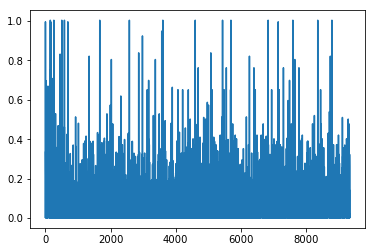

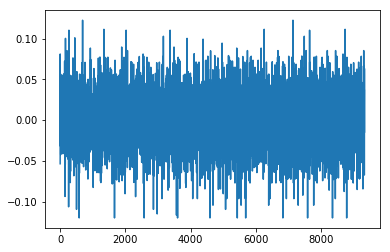

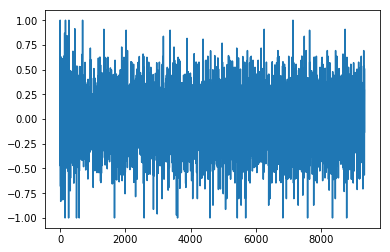

467
0.719972145949
[ 0.66666667  0.66666667  0.          0.          0.          0.
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.33333333  0.66666667  0.66666667  0.66666667  0.33333333
  0.44444444  0.11111111  0.88888889  0.44444444  0.66666667  0.
  0.88888889  1.          0.          0.66666667  0.          0.66666667
  0.44444444  0.          0.66666667  0.          0.44444444  0.
  0.66666667  0.22222222  0.66666667  0.66666667  0.66666667  0.66666667
  0.          0.66666667  0.          0.66666667  0.55555556  0.33333333
  0.44444444  0.66666667  0.          0.33333333  0.44444444  0.66666667
  0.66666667  0.22222222  0.          0.66666667  0.        ]
Writing away results
1993-12-01 00:00:00


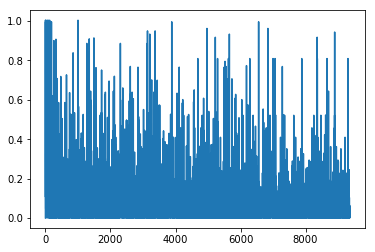

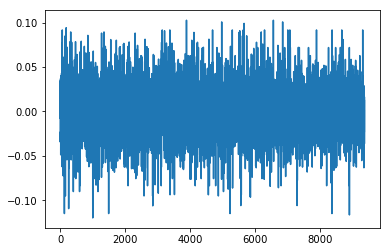

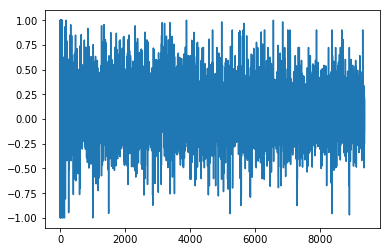

468
0.83569352974
[ 0.          0.          0.          0.          0.          0.11111111
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.22222222
  0.44444444  0.11111111  1.          0.          0.44444444  0.11111111
  0.          0.          0.44444444  0.33333333  0.          0.          0.
  0.          0.33333333  0.          0.          0.          0.11111111
  0.          0.          0.          0.          0.          0.          0.
  0.44444444  0.          0.          0.          0.          0.          0.
  0.11111111  0.          0.77777778  0.33333333  0.          0.
  0.77777778]
Writing away results
1994-01-01 00:00:00


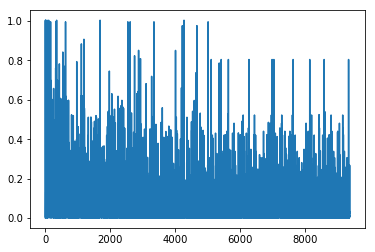

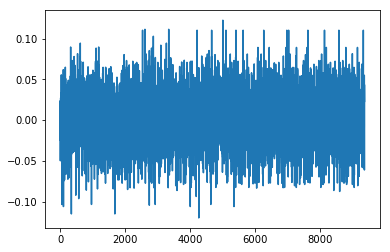

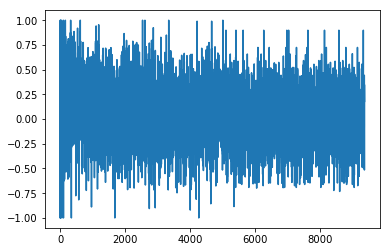

469
0.779834169659
[ 0.66666667  0.88888889  0.66666667  0.66666667  0.77777778  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.88888889  0.88888889  0.11111111  0.33333333
  0.44444444  0.55555556  0.11111111  0.66666667  1.          0.88888889
  0.77777778  0.          0.22222222  0.88888889  0.88888889  0.77777778
  0.66666667  0.66666667  0.88888889  0.66666667  0.66666667  0.77777778
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.77777778
  0.88888889  0.77777778  0.33333333  0.77777778  0.66666667  0.55555556
  0.66666667  0.88888889  0.88888889  0.77777778  0.55555556  0.66666667
  0.88888889  0.66666667  0.77777778  0.66666667  0.88888889]
Writing away results
1994-02-01 00:00:00


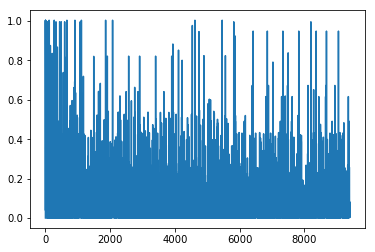

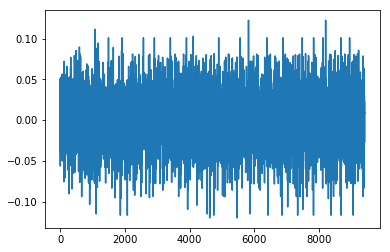

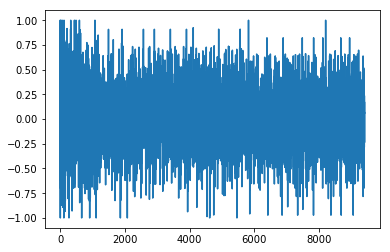

470
0.657921532771
[ 1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.55555556
  1.          0.88888889  0.55555556  0.55555556  0.44444444  0.22222222
  0.77777778  0.55555556  0.          0.55555556  1.          1.          0.
  0.55555556  1.          0.11111111  0.88888889  1.          1.          1.
  1.          0.22222222  1.          1.          1.          1.          1.
  1.          1.          1.          0.55555556  1.          1.
  0.88888889  0.55555556  1.          0.11111111  0.11111111  0.55555556
  1.          0.11111111  1.          1.          1.          0.11111111
  0.11111111]
Writing away results
1994-03-01 00:00:00


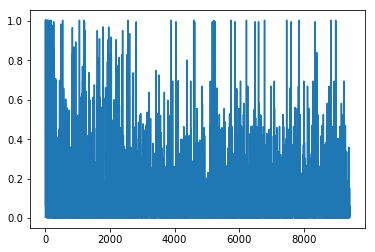

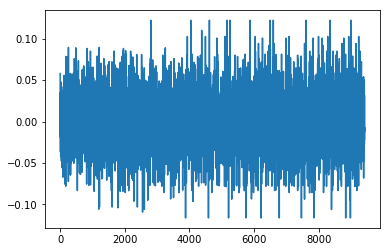

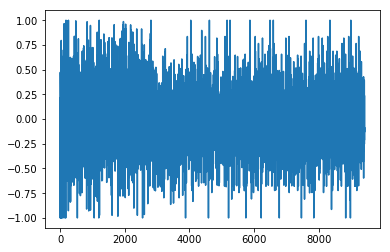

471
0.819558283953
[ 1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.77777778  0.77777778
  0.88888889  0.          0.33333333  0.66666667  0.44444444  0.66666667
  1.          0.66666667  0.22222222  1.          0.77777778  0.44444444
  0.33333333  1.          0.77777778  1.          1.          0.11111111
  1.          1.          1.          0.11111111  1.          1.          1.
  1.          1.          1.          0.77777778  0.66666667  1.          1.
  0.77777778  1.          0.88888889  1.          1.          1.
  0.77777778  1.          1.          1.          0.66666667  0.77777778
  0.          0.33333333]
Writing away results
1994-04-01 00:00:00


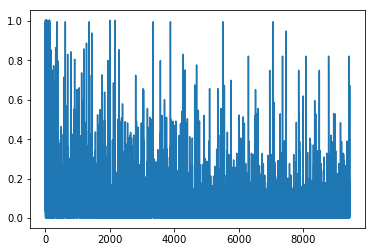

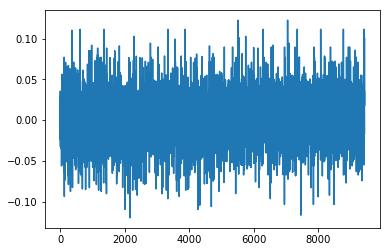

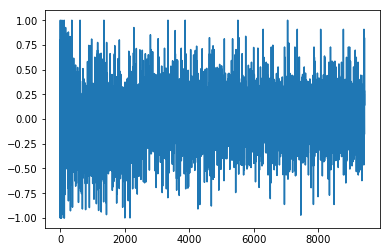

472
0.898693773255
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.44444444  0.44444444  0.88888889  0.88888889  0.66666667
  0.66666667  0.88888889  0.55555556  0.          0.88888889  1.
  0.88888889  0.66666667  0.77777778  0.88888889  0.11111111  1.
  0.77777778  0.44444444  0.88888889  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.44444444  0.88888889  0.77777778  0.88888889  0.66666667  0.
  0.44444444  0.88888889  0.88888889  0.88888889  0.44444444  0.77777778
  0.88888889  0.88888889  0.66666667  0.77777778  0.88888889  0.88888889
  0.33333333  0.66666667  0.44444444  0.55555556  0.        ]
Writing away results
1994-05-01 00:00:00


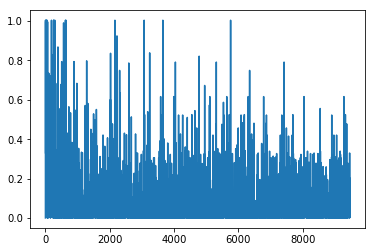

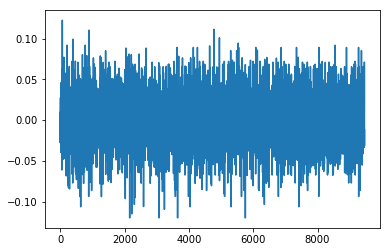

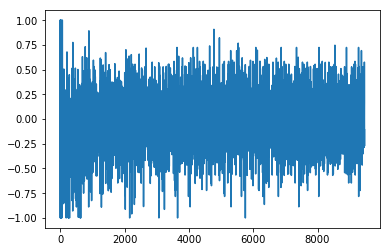

473
0.852991827242
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.11111111  0.22222222  0.22222222  0.66666667  0.88888889  0.66666667
  0.22222222  1.          0.66666667  0.66666667  0.11111111  1.
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.22222222  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778]
Writing away results
1994-06-01 00:00:00


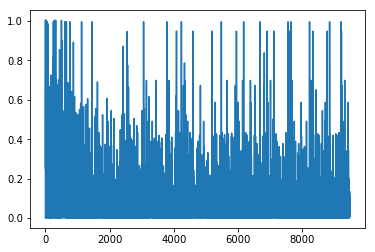

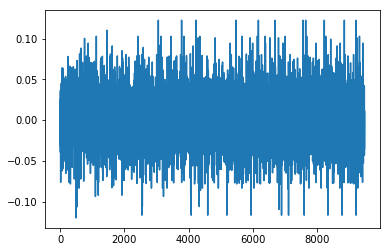

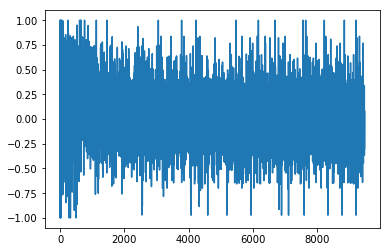

474
1.01259040758
[ 1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.33333333  0.44444444  0.          0.11111111
  0.55555556  1.          0.77777778  0.11111111  0.55555556  0.
  0.22222222  1.          1.          0.11111111  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          0.
  0.11111111  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.77777778  0.55555556  0.55555556  0.        ]
Writing away results
1994-07-01 00:00:00


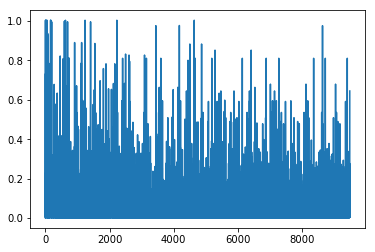

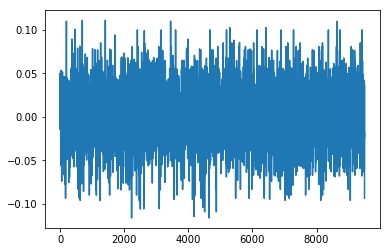

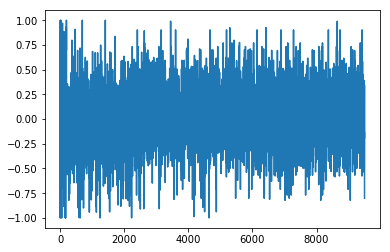

475
0.965251897047
[ 0.55555556  0.88888889  0.77777778  0.77777778  0.88888889  0.88888889
  0.55555556  0.66666667  0.66666667  0.11111111  0.33333333  0.44444444
  1.          0.88888889  0.33333333  0.88888889  0.22222222  0.77777778
  0.55555556  0.88888889  0.66666667  0.11111111  0.88888889  0.88888889
  0.55555556  0.88888889  0.11111111  0.77777778  0.          0.88888889
  0.55555556  0.77777778  0.55555556  0.88888889  0.55555556  0.88888889
  0.55555556  0.77777778  0.22222222  0.88888889  0.88888889  0.77777778
  0.77777778  0.          0.88888889  0.33333333  0.          0.55555556
  0.11111111  0.11111111  0.88888889  0.55555556  0.88888889  0.66666667
  0.11111111  0.33333333  1.          0.22222222  1.        ]
Writing away results
1994-08-01 00:00:00


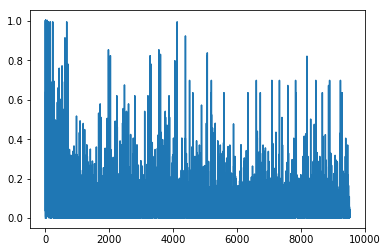

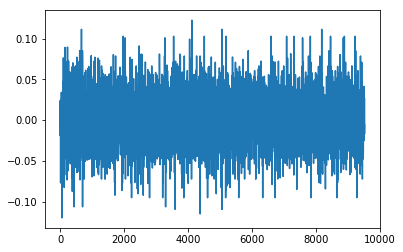

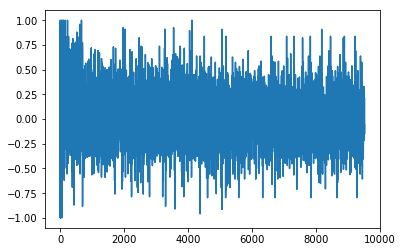

476
0.979191244762
[ 0.33333333  0.33333333  0.33333333  0.33333333  0.88888889  0.11111111
  0.11111111  0.66666667  1.          1.          0.44444444  0.55555556
  0.88888889  0.55555556  0.33333333  0.22222222  0.22222222  0.33333333
  0.77777778  0.          0.33333333  0.77777778  0.88888889  0.33333333
  0.33333333  0.88888889  1.          0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.11111111  1.          0.33333333  1.
  0.33333333  0.55555556  0.33333333  0.33333333  1.          0.33333333
  0.33333333  0.77777778  0.11111111  0.33333333  0.33333333  1.          1.
  0.33333333  0.33333333  0.33333333  0.22222222  0.33333333  0.55555556
  0.44444444  0.55555556  0.44444444  0.55555556]
Writing away results
1994-09-01 00:00:00


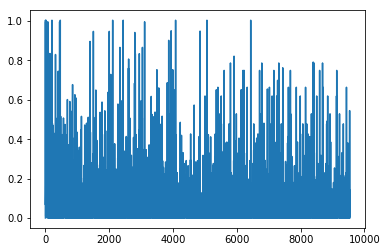

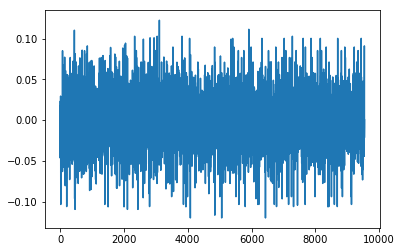

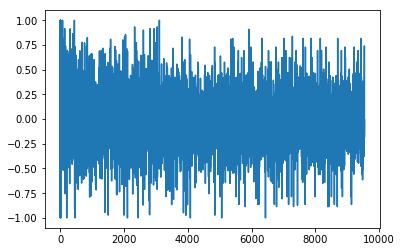

477
0.846591344052
[ 0.          0.77777778  0.          0.44444444  0.22222222  0.33333333
  0.44444444  0.          0.88888889  0.66666667  0.11111111  0.55555556
  0.22222222  0.44444444  0.66666667  1.          0.88888889  0.
  0.22222222  0.77777778  0.          0.          0.33333333  0.
  0.22222222  0.88888889  0.88888889  0.          0.22222222  0.          0.
  0.          0.44444444  0.77777778  0.88888889  0.          0.11111111
  0.44444444  0.          0.22222222  0.88888889  0.11111111  0.
  0.88888889  0.11111111  0.55555556  0.77777778  0.          0.
  0.11111111  0.          0.22222222  0.          0.66666667  0.55555556
  0.22222222  0.44444444  0.66666667  1.        ]
Writing away results
1994-10-01 00:00:00


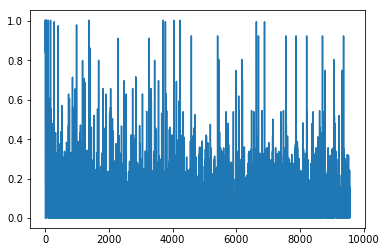

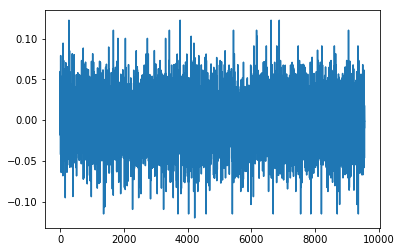

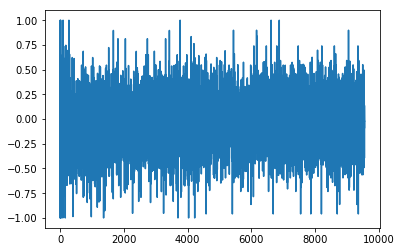

478
0.852394601588
[ 0.11111111  0.11111111  0.11111111  0.88888889  0.88888889  0.55555556
  0.11111111  0.22222222  1.          0.77777778  0.88888889  0.66666667
  0.88888889  0.55555556  0.66666667  0.22222222  0.88888889  1.          0.
  0.88888889  0.88888889  0.88888889  0.88888889  0.          0.11111111
  0.22222222  0.88888889  0.          0.11111111  0.11111111  0.88888889
  0.11111111  0.88888889  0.22222222  0.          1.          0.22222222
  0.88888889  0.88888889  0.11111111  0.          0.11111111  0.66666667
  0.44444444  0.88888889  0.11111111  0.88888889  0.88888889  0.22222222
  0.11111111  0.22222222  0.11111111  0.33333333  1.          0.77777778
  0.33333333  0.77777778  1.          0.33333333]
Writing away results
1994-11-01 00:00:00


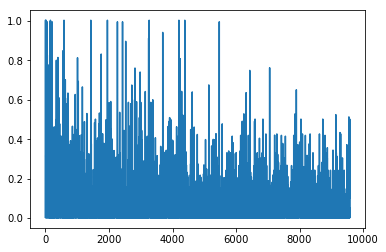

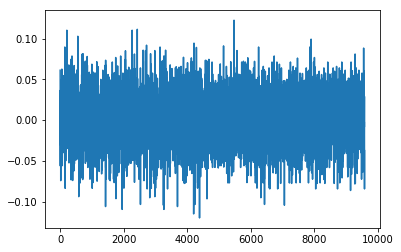

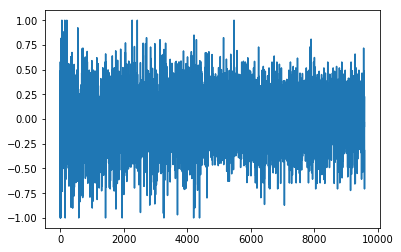

479
0.953658212058
[ 0.55555556  0.55555556  0.55555556  0.22222222  0.77777778  0.66666667
  0.88888889  0.77777778  0.11111111  0.11111111  0.44444444  0.22222222
  0.11111111  0.11111111  0.33333333  0.55555556  0.11111111  0.55555556
  0.55555556  1.          0.22222222  0.22222222  0.55555556  0.22222222
  0.33333333  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.22222222  0.55555556  0.66666667  0.55555556  0.11111111  0.22222222
  0.66666667  0.55555556  0.22222222  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.22222222  0.55555556
  0.55555556  0.22222222  0.22222222  0.88888889  0.          0.88888889
  0.          0.88888889  0.11111111  0.88888889  0.11111111]
Writing away results
1994-12-01 00:00:00


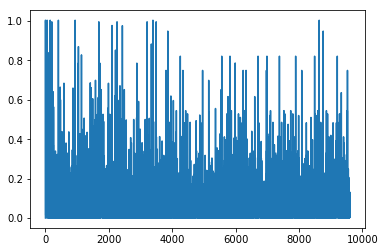

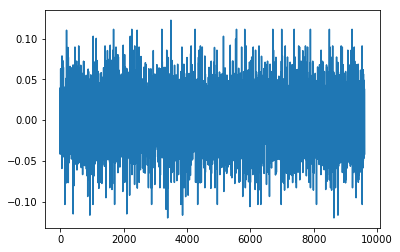

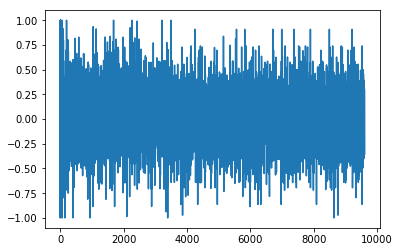

480
0.986692609451
[ 0.88888889  0.88888889  0.77777778  0.77777778  0.77777778  0.22222222
  0.66666667  0.          0.77777778  0.22222222  0.77777778  0.
  0.55555556  0.88888889  0.77777778  0.22222222  0.          0.88888889
  0.22222222  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.33333333  0.77777778  0.77777778
  0.88888889  0.88888889  0.88888889  0.88888889  0.22222222  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.77777778
  0.88888889  0.77777778  0.          0.          0.          0.66666667
  0.          0.66666667  0.66666667  0.66666667  0.22222222]
Writing away results
1995-01-01 00:00:00


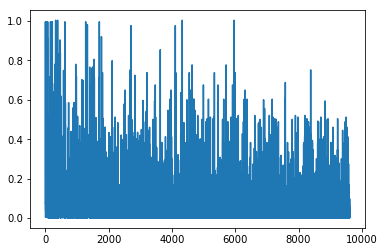

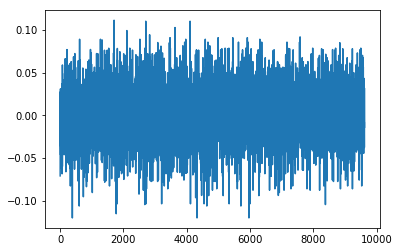

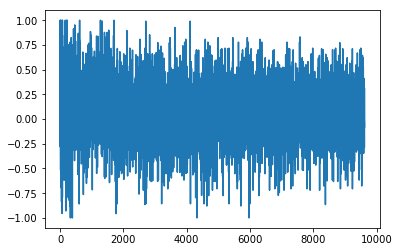

481
0.916185522891
[ 0.55555556  0.77777778  0.44444444  0.88888889  0.55555556  0.11111111
  0.44444444  0.66666667  0.66666667  0.77777778  0.          0.11111111
  0.55555556  0.77777778  0.44444444  0.88888889  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.77777778
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  1.          0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.44444444
  0.55555556  0.55555556  0.77777778  0.55555556  0.55555556  0.55555556
  0.77777778  0.          0.          0.44444444  0.          0.          0.
  0.44444444  0.11111111  0.          0.        ]
Writing away results
1995-02-01 00:00:00


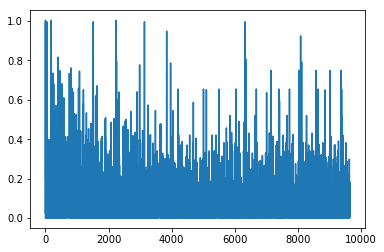

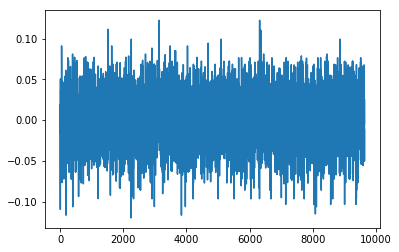

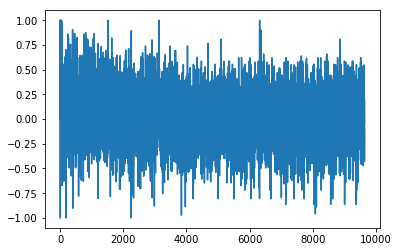

482
1.0787256332
[ 0.33333333  0.77777778  0.88888889  0.11111111  0.          0.55555556
  0.77777778  0.33333333  0.88888889  0.55555556  0.11111111  0.77777778
  0.88888889  0.55555556  0.66666667  0.88888889  0.88888889  0.
  0.88888889  0.77777778  0.          0.          0.88888889  0.77777778
  0.88888889  0.77777778  0.88888889  0.77777778  0.88888889  0.88888889
  0.88888889  0.44444444  0.77777778  0.88888889  0.88888889  0.
  0.88888889  0.88888889  0.          0.          0.66666667  0.77777778
  0.77777778  0.88888889  0.          0.88888889  0.77777778  0.66666667
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.33333333  0.55555556  0.33333333  0.55555556]
Writing away results
1995-03-01 00:00:00


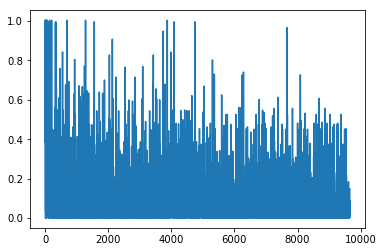

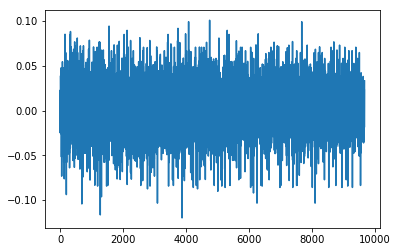

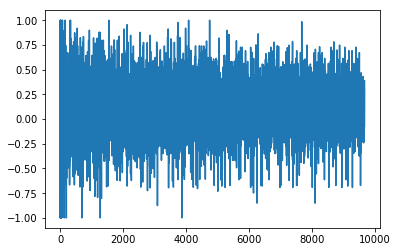

483
1.0405286863
[ 0.44444444  0.88888889  0.          0.55555556  0.66666667  0.44444444
  0.22222222  0.44444444  0.11111111  0.22222222  0.44444444  0.44444444
  0.22222222  0.88888889  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.22222222  0.44444444  0.44444444  0.44444444  0.44444444  0.88888889
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.22222222
  0.22222222  0.11111111  0.66666667  0.11111111  0.22222222  0.11111111
  0.11111111  0.11111111  0.22222222  0.66666667  0.11111111]
Writing away results
1995-04-01 00:00:00


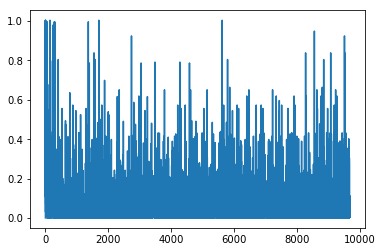

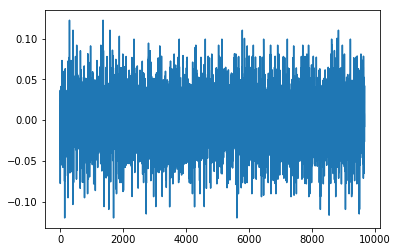

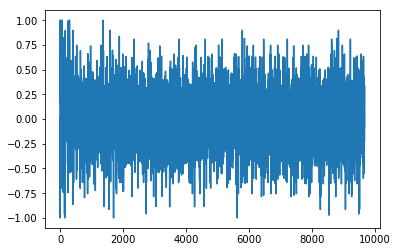

484
0.904676873169
[ 0.77777778  0.33333333  0.44444444  0.22222222  0.22222222  0.11111111
  0.44444444  0.22222222  0.55555556  0.44444444  0.          0.88888889
  0.44444444  0.          0.33333333  0.55555556  0.44444444  0.77777778
  0.55555556  0.44444444  0.44444444  0.77777778  0.77777778  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.33333333  0.88888889
  0.44444444  0.77777778  0.77777778  0.44444444  0.44444444  0.77777778
  0.33333333  0.44444444  0.44444444  0.77777778  0.77777778  0.44444444
  0.44444444  0.77777778  0.77777778  0.55555556  0.88888889  0.22222222
  0.88888889  0.22222222  0.22222222  0.11111111  0.11111111  0.22222222
  0.11111111  0.22222222  0.22222222  0.22222222  0.11111111]
Writing away results
1995-05-01 00:00:00


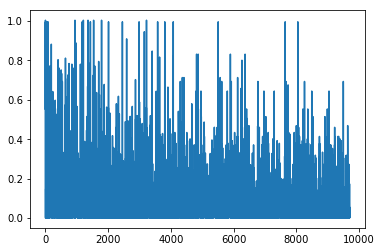

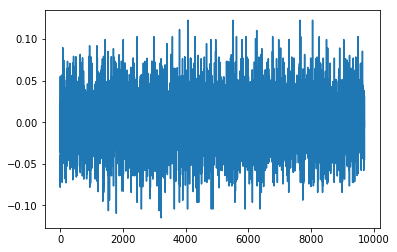

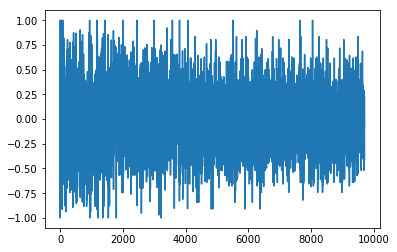

485
0.939333726447
[ 0.77777778  0.          0.88888889  0.66666667  0.11111111  0.
  0.55555556  0.66666667  0.33333333  0.55555556  0.88888889  0.33333333
  0.66666667  0.33333333  0.33333333  0.33333333  0.66666667  0.66666667
  0.77777778  0.55555556  0.66666667  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.66666667  0.66666667  0.22222222  0.33333333
  0.33333333  0.66666667  1.          1.          0.66666667  0.11111111
  0.44444444  0.55555556  0.66666667  0.33333333  0.33333333  0.22222222
  0.66666667  0.66666667  0.77777778  0.88888889  0.          1.          0.
  0.11111111  0.44444444  1.          0.44444444  0.88888889  0.          1.
  0.66666667  1.          0.        ]
Writing away results
1995-06-01 00:00:00


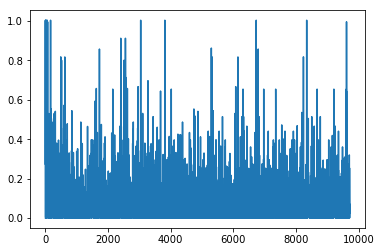

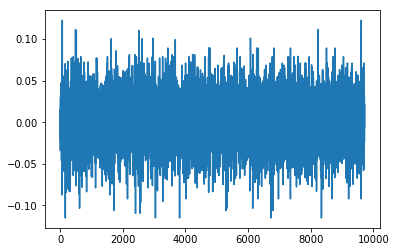

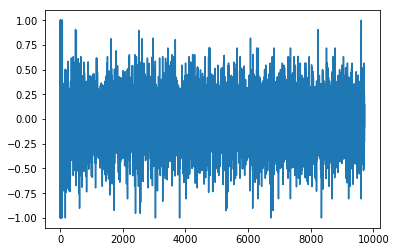

486
0.924638175959
[ 0.77777778  0.77777778  0.44444444  0.          0.55555556  0.33333333
  0.33333333  0.22222222  0.66666667  1.          0.88888889  0.66666667
  0.88888889  0.66666667  0.66666667  1.          0.66666667  0.55555556
  0.22222222  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.88888889  0.66666667  0.88888889  1.          0.66666667  0.66666667
  1.          0.88888889  0.33333333  0.22222222  0.88888889  0.77777778
  0.33333333  0.66666667  0.66666667  0.88888889  0.44444444  0.66666667
  0.66666667  0.55555556  0.77777778  0.33333333  0.77777778  0.11111111
  0.77777778  0.33333333  0.77777778  0.66666667  0.11111111  0.77777778
  0.66666667  1.          0.11111111  0.77777778  0.44444444]
Writing away results
1995-07-01 00:00:00


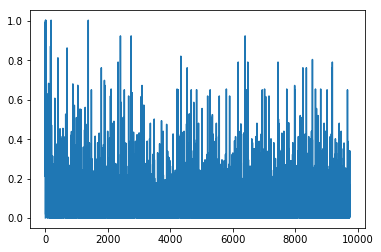

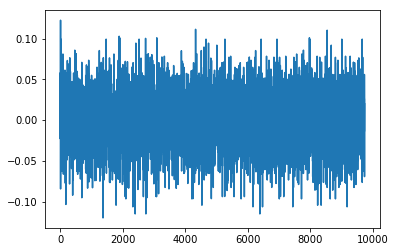

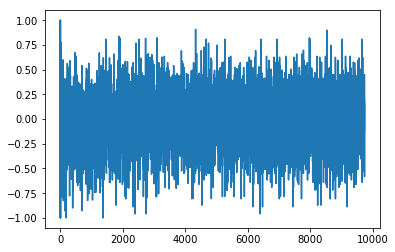

487
0.966398781392
[ 1.          0.44444444  0.55555556  0.11111111  0.77777778  0.88888889
  0.11111111  0.44444444  0.88888889  0.          0.77777778  0.66666667
  0.11111111  0.11111111  0.44444444  0.11111111  0.66666667  0.22222222
  0.66666667  0.11111111  0.11111111  0.66666667  0.11111111  0.11111111
  0.11111111  0.22222222  0.88888889  0.11111111  0.66666667  0.66666667
  0.11111111  0.77777778  0.44444444  0.66666667  0.11111111  0.11111111
  0.44444444  0.11111111  0.11111111  0.88888889  0.44444444  0.66666667
  0.22222222  0.88888889  1.          0.55555556  0.77777778  1.          1.
  0.88888889  1.          0.88888889  0.88888889  1.          0.55555556
  0.88888889  0.77777778  0.77777778  0.88888889]
Writing away results
1995-08-01 00:00:00


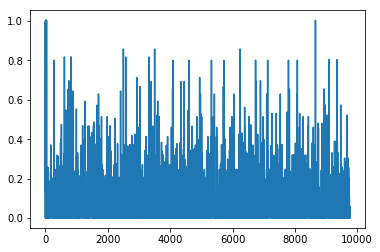

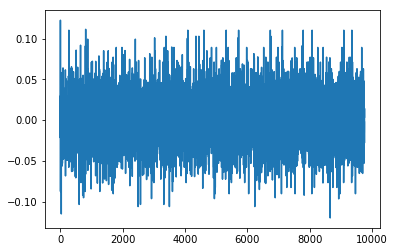

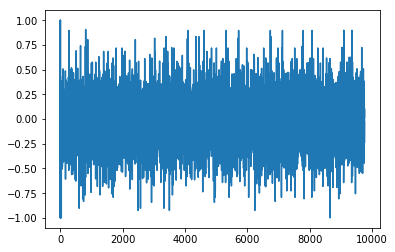

488
0.980164666378
[ 0.55555556  0.55555556  0.77777778  1.          0.44444444  0.77777778
  0.66666667  1.          0.77777778  0.22222222  0.          0.77777778
  0.77777778  0.55555556  0.77777778  0.77777778  0.          0.55555556
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778
  0.77777778  0.44444444  0.          0.22222222  0.66666667  0.77777778
  0.77777778  0.22222222  0.77777778  0.66666667  1.          0.22222222
  0.77777778  0.66666667  1.          0.66666667  0.77777778  0.          1.
  0.33333333  0.88888889  0.11111111  1.          0.11111111  0.33333333
  0.          1.          0.44444444  0.88888889  0.66666667  0.33333333
  0.11111111  0.22222222  0.44444444  0.33333333]
Writing away results
1995-09-01 00:00:00


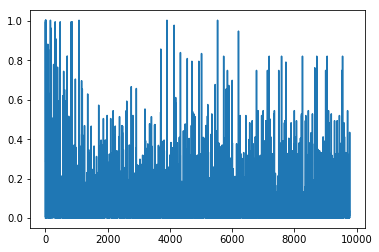

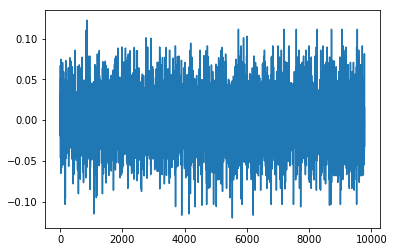

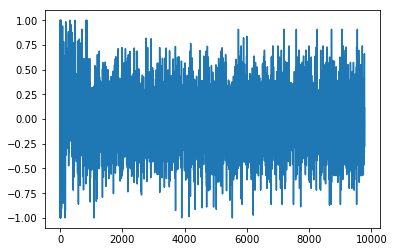

489
1.01625638489
[ 0.55555556  1.          0.77777778  0.          0.88888889  0.44444444
  0.66666667  0.77777778  0.88888889  0.88888889  0.11111111  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.          0.88888889  0.88888889  0.88888889  0.88888889  0.77777778
  0.88888889  0.88888889  1.          0.88888889  0.88888889  0.88888889
  0.88888889  0.77777778  0.88888889  0.88888889  1.          0.77777778
  0.77777778  0.22222222  0.22222222  0.77777778  0.22222222  0.77777778
  0.22222222  0.66666667  0.77777778  0.33333333  0.55555556  0.
  0.77777778  0.22222222  0.22222222  0.77777778  0.77777778]
Writing away results
1995-10-01 00:00:00


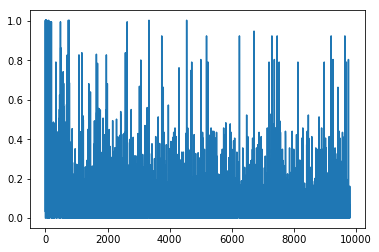

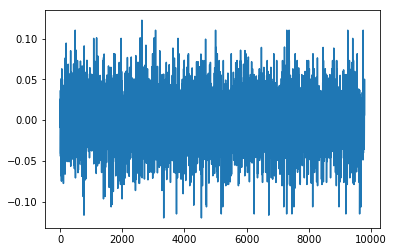

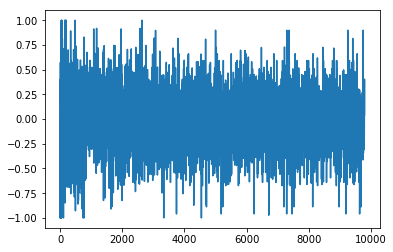

490
0.805450641828
[ 0.22222222  1.          0.66666667  0.11111111  0.11111111  0.22222222
  0.66666667  0.11111111  0.11111111  0.33333333  0.22222222  0.11111111
  0.44444444  0.11111111  0.88888889  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.44444444  0.55555556  0.44444444  0.66666667
  0.22222222  0.11111111  0.11111111  0.22222222  0.66666667  0.44444444
  0.11111111  0.88888889  0.22222222  0.11111111  0.11111111  0.11111111
  0.88888889  0.66666667  0.11111111  0.44444444  1.          0.          1.
  0.          1.          0.          0.          0.          1.          0.
  0.          0.11111111  0.66666667  0.          0.          1.          1.
  1.          0.        ]
Writing away results
1995-11-01 00:00:00


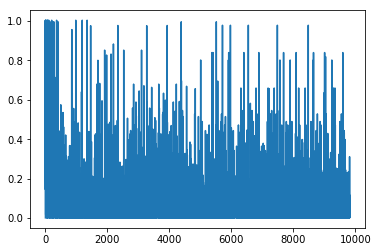

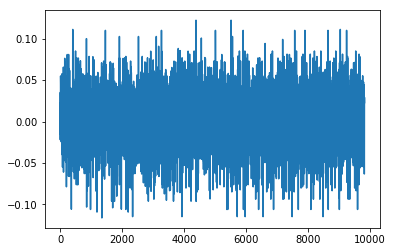

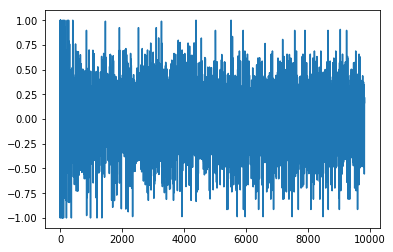

491
1.00548345635
[ 0.33333333  0.55555556  0.          0.44444444  0.          0.66666667
  0.88888889  0.88888889  0.44444444  0.44444444  0.88888889  0.55555556
  0.11111111  0.          0.          0.44444444  0.66666667  0.44444444
  0.55555556  0.11111111  0.55555556  0.11111111  0.          0.
  0.88888889  0.44444444  0.11111111  0.33333333  0.88888889  0.66666667
  0.11111111  0.33333333  0.88888889  0.44444444  0.11111111  0.33333333
  0.88888889  0.88888889  0.11111111  1.          0.77777778  1.          1.
  0.33333333  1.          0.33333333  0.77777778  1.          0.77777778
  0.77777778  0.22222222  0.          1.          0.77777778  0.77777778
  1.          1.          0.88888889  0.44444444]
Writing away results
1995-12-01 00:00:00


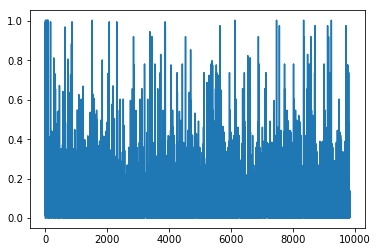

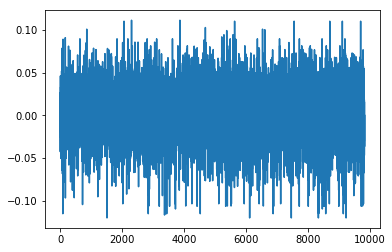

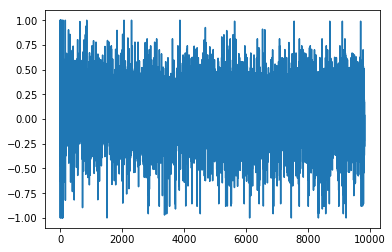

492
0.894060185597
[ 0.44444444  0.88888889  0.44444444  1.          0.88888889  0.66666667
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.44444444  0.44444444  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  1.          0.88888889  0.88888889
  0.44444444  0.44444444  0.88888889  0.88888889  0.88888889  0.44444444
  0.44444444  0.88888889  0.88888889  0.88888889  0.44444444  0.88888889
  0.33333333  0.44444444  1.          0.55555556  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.        ]
Writing away results
1996-01-01 00:00:00


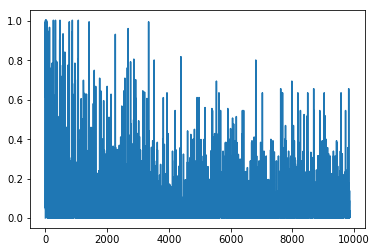

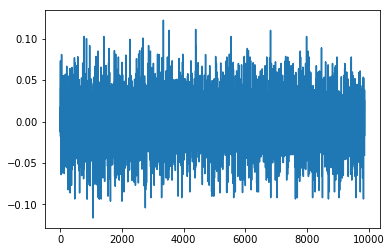

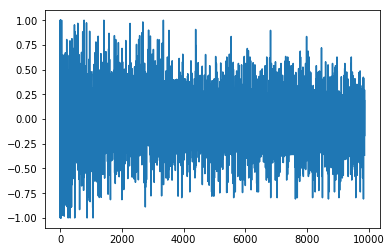

493
1.06496882433
[ 0.55555556  0.55555556  1.          0.33333333  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.22222222
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.66666667  0.33333333  0.55555556  0.55555556  0.55555556
  0.11111111  0.55555556  0.55555556  0.55555556  0.88888889  0.66666667
  0.55555556  0.55555556  0.55555556  0.66666667  0.55555556  0.55555556
  0.77777778  0.33333333  0.33333333  0.          0.77777778  0.44444444
  0.33333333  0.          0.77777778  0.          0.33333333  0.
  0.77777778  0.33333333  0.33333333  0.          0.77777778  0.33333333
  0.33333333  0.          0.77777778  0.33333333  0.33333333]
Writing away results
1996-02-01 00:00:00


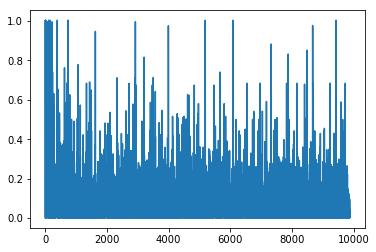

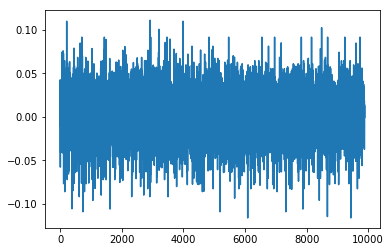

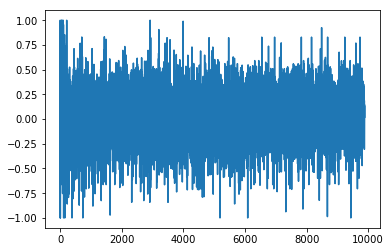

494
1.14620801526
[ 0.55555556  0.44444444  0.          0.11111111  0.33333333  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.33333333
  0.55555556  0.66666667  0.33333333  0.55555556  0.55555556  0.88888889
  0.55555556  0.33333333  0.33333333  0.55555556  0.22222222  0.55555556
  0.55555556  0.55555556  0.55555556  0.88888889  0.33333333  0.33333333
  0.44444444  0.66666667  0.44444444  0.11111111  0.44444444  0.66666667
  0.          0.44444444  0.44444444  0.66666667  0.44444444  0.66666667
  0.66666667  0.44444444  1.          0.44444444  0.44444444  0.44444444
  0.77777778  1.          0.44444444  0.44444444  0.66666667]
Writing away results
1996-03-01 00:00:00


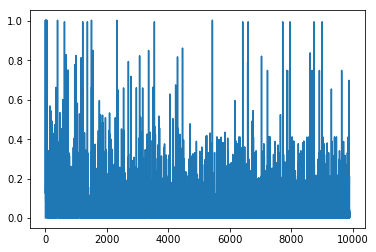

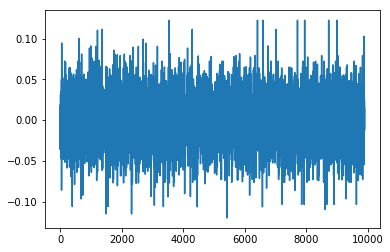

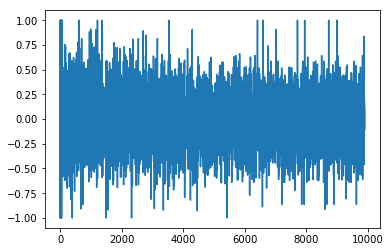

495
0.974624572666
[ 0.55555556  0.33333333  0.88888889  0.88888889  0.33333333  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.55555556  0.33333333
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.22222222
  0.11111111  0.88888889  0.88888889  0.88888889  1.          0.88888889
  0.88888889  0.22222222  1.          0.66666667  0.33333333  0.88888889
  0.88888889  1.          0.88888889  0.22222222  1.          0.11111111
  0.11111111  0.77777778  0.44444444  0.44444444  0.11111111  0.44444444
  0.11111111  0.11111111  0.11111111  0.44444444  0.11111111  0.77777778
  0.44444444  0.66666667  0.11111111  0.44444444  0.11111111  0.66666667
  0.44444444  0.44444444  0.11111111  0.11111111  0.44444444]
Writing away results
1996-04-01 00:00:00


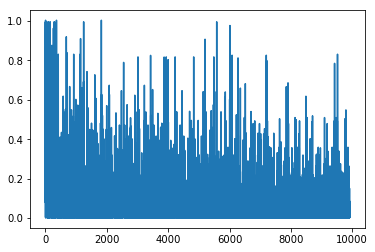

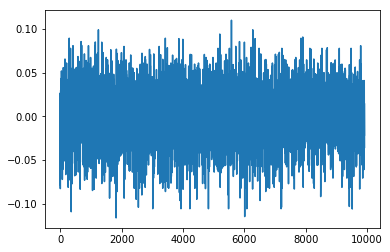

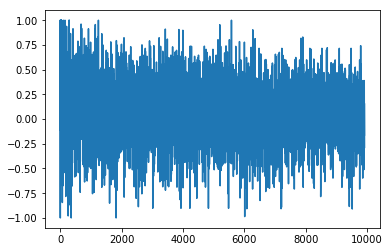

496
0.886268196033
[ 0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.44444444  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  1.
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.22222222  0.22222222
  1.          0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.11111111  0.33333333  1.          0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.77777778
  0.22222222  0.22222222  0.22222222  0.11111111  0.22222222]
Writing away results
1996-05-01 00:00:00


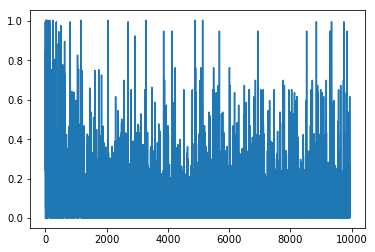

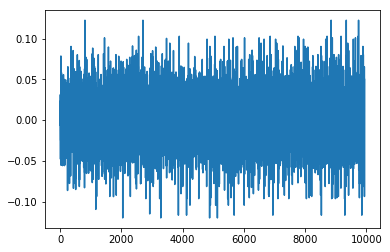

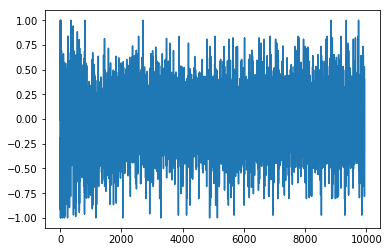

497
0.978927187884
[ 1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.77777778  0.33333333  1.          1.          1.
  1.          1.          0.33333333  1.          1.          1.          1.
  1.          1.          1.          0.          0.33333333  0.77777778
  0.77777778  0.11111111  0.77777778  0.77777778  0.11111111  0.77777778
  0.11111111  0.88888889  0.77777778  0.          0.66666667  0.88888889
  0.11111111  0.22222222  0.88888889  0.11111111  0.11111111  0.88888889
  0.33333333  0.77777778  0.22222222  0.77777778  0.77777778  0.77777778
  0.22222222]
Writing away results
1996-06-01 00:00:00


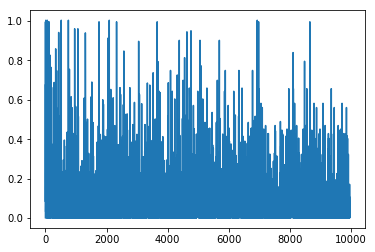

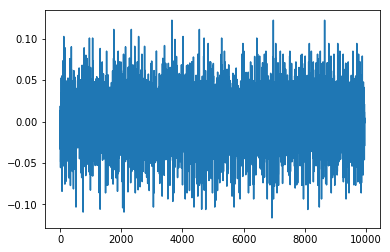

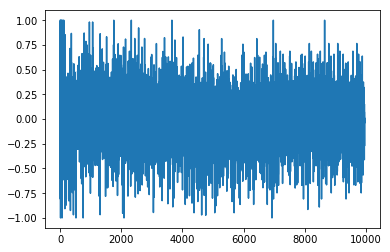

498
1.15413906982
[ 0.66666667  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.22222222  1.          0.66666667
  0.66666667  0.44444444  0.66666667  0.66666667  0.66666667  0.88888889
  0.66666667  1.          0.66666667  0.66666667  0.55555556  0.33333333
  0.66666667  0.33333333  0.22222222  0.77777778  0.          0.77777778
  0.77777778  0.22222222  0.77777778  0.77777778  0.          0.77777778
  1.          0.11111111  0.44444444  0.44444444  0.77777778  0.
  0.77777778  0.22222222  0.77777778  0.77777778  0.22222222  0.
  0.22222222  0.22222222  0.22222222  0.77777778  0.22222222]
Writing away results
1996-07-01 00:00:00


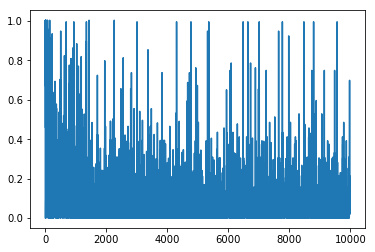

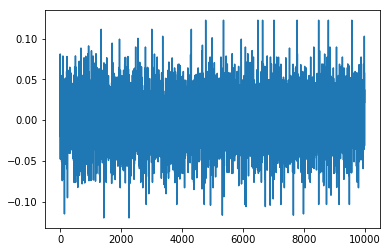

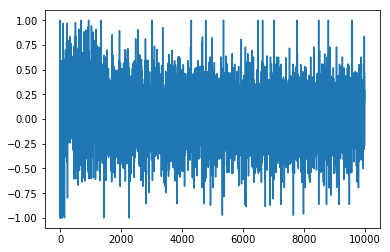

499
1.09970481954
[ 0.88888889  0.44444444  0.33333333  0.88888889  0.44444444  0.33333333
  0.77777778  0.44444444  0.44444444  0.44444444  0.88888889  0.44444444
  0.44444444  1.          0.          0.44444444  0.44444444  0.33333333
  1.          0.44444444  0.44444444  0.44444444  0.44444444  0.55555556
  0.44444444  0.88888889  1.          0.22222222  0.33333333  1.          1.
  0.66666667  0.22222222  0.66666667  0.88888889  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.22222222  0.66666667  0.
  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667  0.66666667
  0.11111111  0.66666667  0.66666667  0.66666667  0.11111111  0.66666667
  0.66666667  0.66666667  0.11111111  0.11111111]
Writing away results
1996-08-01 00:00:00


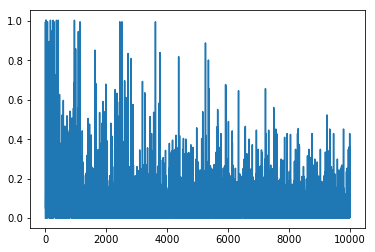

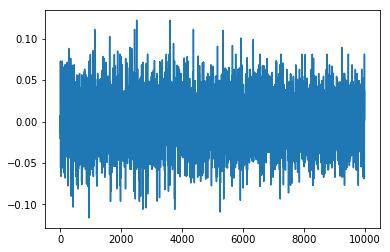

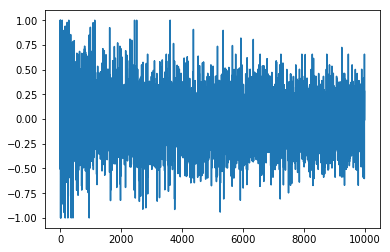

500
1.21965932428
[ 0.66666667  0.          0.44444444  0.44444444  0.77777778  0.11111111
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.44444444
  0.66666667  0.33333333  0.44444444  0.66666667  0.11111111  0.66666667
  0.66666667  0.44444444  0.66666667  0.66666667  1.          0.11111111
  0.66666667  0.88888889  0.77777778  0.44444444  0.44444444  0.44444444
  0.55555556  0.77777778  0.22222222  0.88888889  0.55555556  0.33333333
  0.22222222  0.33333333  0.33333333  0.77777778  1.          0.55555556
  0.33333333  1.          0.33333333  0.33333333  0.33333333  1.
  0.33333333  0.33333333  0.33333333  0.77777778  0.22222222  0.33333333
  0.22222222  0.22222222  1.          0.33333333  0.88888889]
Writing away results
1996-09-01 00:00:00


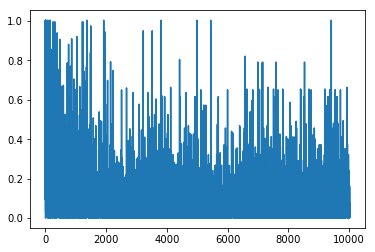

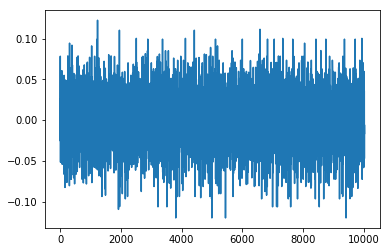

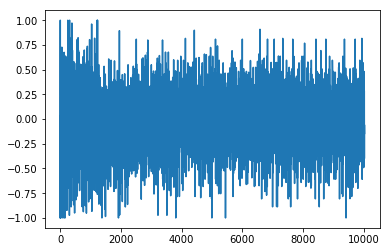

501
1.11680327172
[ 0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.33333333  0.44444444  0.44444444  0.33333333  0.44444444  0.44444444
  0.77777778  0.33333333  0.44444444  0.11111111  0.11111111  0.44444444
  0.44444444  0.33333333  0.44444444  0.44444444  0.44444444  0.33333333
  0.33333333  0.44444444  0.66666667  0.44444444  0.77777778  1.
  0.88888889  0.77777778  0.22222222  0.88888889  0.88888889  0.88888889
  0.77777778  0.88888889  0.77777778  0.77777778  1.          0.88888889
  0.22222222  0.88888889  0.77777778  0.22222222  0.88888889  0.
  0.55555556  0.22222222  0.88888889  0.          0.77777778  0.77777778
  0.77777778  0.88888889  0.55555556  0.22222222  0.        ]
Writing away results
1996-10-01 00:00:00


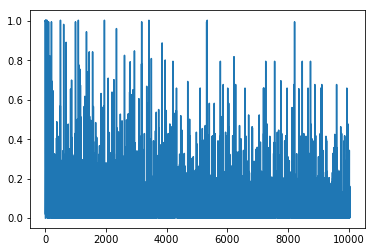

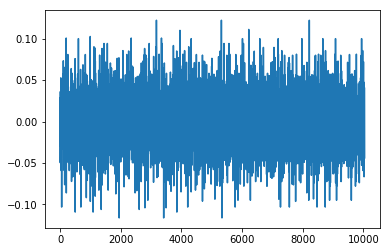

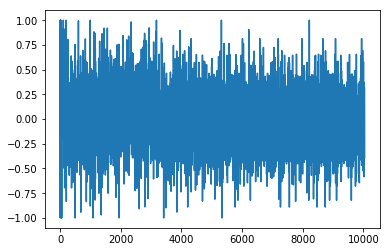

502
1.02392407643
[ 0.44444444  0.88888889  0.77777778  0.77777778  0.88888889  0.88888889
  0.88888889  1.          0.66666667  0.44444444  0.88888889  0.22222222
  0.77777778  0.88888889  0.88888889  0.11111111  0.66666667  0.77777778
  0.44444444  0.88888889  0.77777778  0.44444444  0.88888889  0.55555556
  1.          0.66666667  0.44444444  0.11111111  0.          0.77777778
  0.          0.          0.          0.          0.          0.66666667
  0.          0.33333333  0.33333333  0.88888889  0.11111111  0.66666667
  0.11111111  0.          0.          0.11111111  0.33333333  0.33333333
  0.11111111  0.11111111  0.66666667  0.          0.77777778  0.11111111
  0.33333333  0.33333333  0.11111111  0.          0.77777778]
Writing away results
1996-11-01 00:00:00


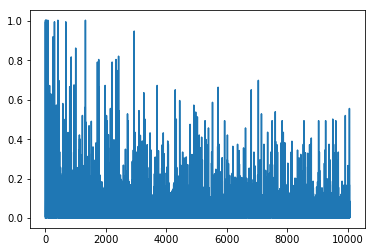

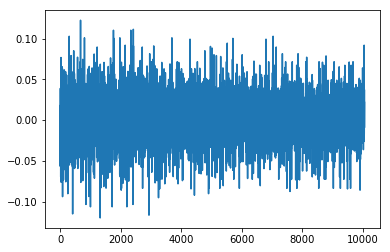

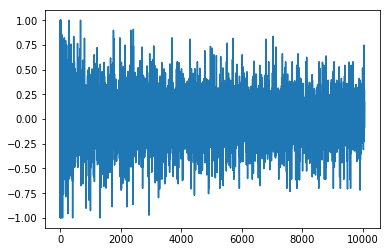

503
1.07288378078
[ 0.44444444  0.44444444  0.55555556  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.          0.66666667  0.44444444
  0.44444444  0.44444444  0.          0.44444444  0.44444444  0.33333333
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.55555556
  0.22222222  0.55555556  0.66666667  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.33333333  0.11111111  0.11111111
  0.11111111  0.33333333  0.11111111  0.33333333  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.77777778  0.33333333  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.33333333  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.33333333]
Writing away results
1996-12-01 00:00:00


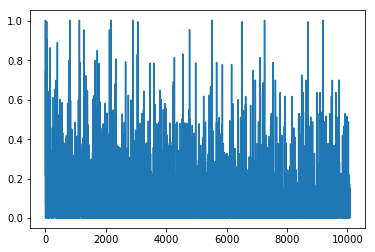

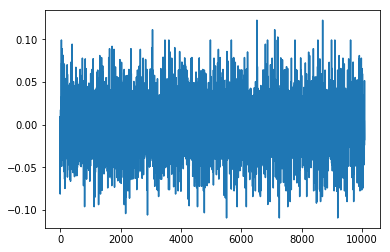

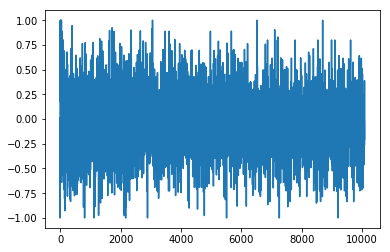

504
1.01499749607
[ 0.          0.22222222  0.77777778  0.22222222  0.22222222  0.55555556
  0.22222222  0.55555556  0.22222222  0.          0.55555556  0.22222222
  0.22222222  0.55555556  0.          0.22222222  0.22222222  0.55555556
  1.          0.55555556  0.22222222  0.55555556  0.22222222  0.
  0.77777778  0.55555556  0.88888889  0.88888889  0.88888889  0.11111111
  0.88888889  0.88888889  0.11111111  0.11111111  0.66666667  0.88888889
  0.88888889  1.          0.11111111  0.88888889  0.88888889  0.11111111
  0.88888889  0.88888889  0.11111111  0.11111111  0.11111111  0.88888889
  0.11111111  0.11111111  0.66666667  0.88888889  1.          0.11111111
  0.11111111  0.88888889  0.11111111  0.          0.22222222]
Writing away results
1997-01-01 00:00:00


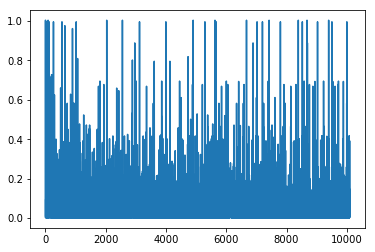

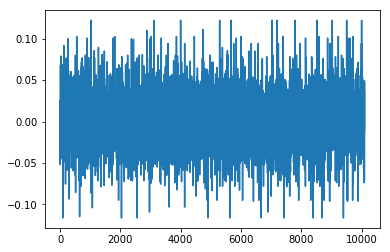

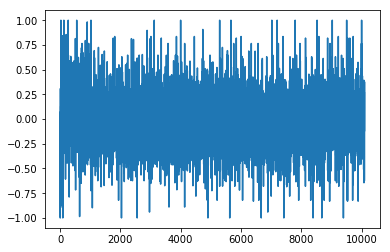

505
1.19179371974
[ 1.          1.          1.          0.22222222  1.          0.22222222
  1.          0.22222222  0.33333333  0.22222222  0.          1.          1.
  0.22222222  0.          1.          0.22222222  0.66666667  0.          1.
  0.22222222  0.22222222  0.          1.          0.22222222  0.33333333
  0.88888889  0.44444444  0.11111111  0.44444444  0.11111111  0.11111111
  0.11111111  0.33333333  0.11111111  0.44444444  0.33333333  0.11111111
  0.11111111  0.44444444  0.33333333  0.11111111  0.11111111  0.77777778
  0.77777778  0.33333333  0.11111111  0.11111111  0.33333333  0.33333333
  0.44444444  0.66666667  0.77777778  0.33333333  0.11111111  0.11111111
  0.          0.33333333  0.88888889]
Writing away results
1997-02-01 00:00:00


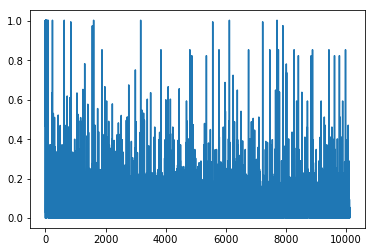

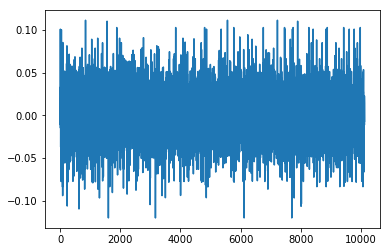

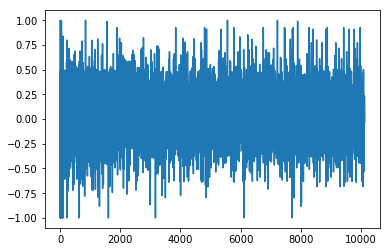

506
1.16462024283
[ 1.          0.          1.          1.          0.          0.          1.
  0.55555556  0.          0.          1.          0.22222222  0.          1.
  1.          0.          0.          1.          1.          0.          0.
  1.          1.          0.22222222  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.66666667  0.55555556  0.88888889  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.66666667  0.55555556  0.55555556  0.          0.55555556
  0.55555556  0.        ]
Writing away results
1997-03-01 00:00:00


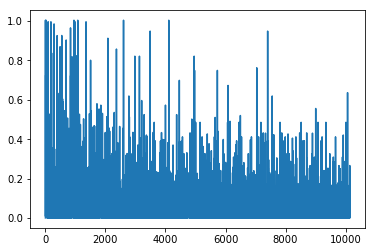

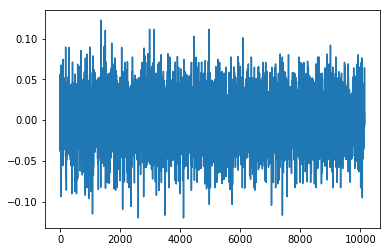

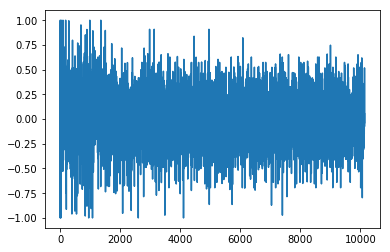

507
1.2633695324
[ 0.          0.          0.          0.          0.          0.11111111
  0.11111111  0.          0.          0.          0.11111111  0.77777778
  0.          0.22222222  0.          0.77777778  0.          0.          0.
  0.22222222  0.77777778  0.          0.33333333  0.66666667  0.44444444
  0.66666667  0.44444444  0.66666667  0.44444444  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.66666667  0.44444444  0.88888889
  0.66666667  0.66666667  0.44444444  0.66666667  0.55555556  0.88888889
  0.44444444  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.55555556  0.33333333  0.44444444  0.66666667  0.66666667  1.
  0.66666667  0.11111111  0.66666667  0.77777778]
Writing away results
1997-04-01 00:00:00


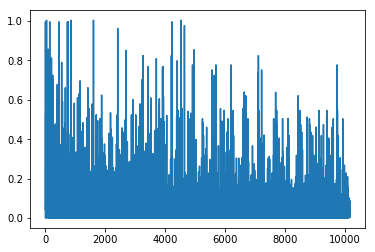

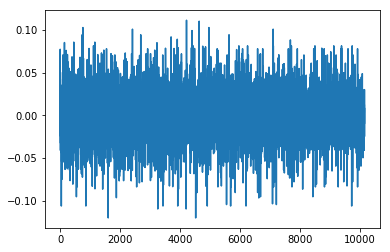

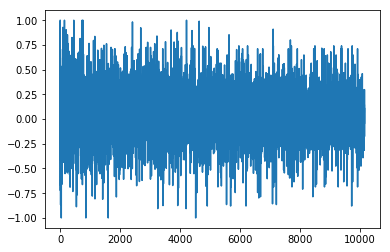

508
1.30011434606
[ 0.55555556  0.55555556  0.22222222  0.22222222  0.55555556  0.
  0.22222222  0.22222222  0.55555556  0.55555556  0.22222222  0.22222222
  0.22222222  0.66666667  0.55555556  0.22222222  0.55555556  0.55555556
  0.55555556  0.11111111  0.55555556  0.55555556  0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.88888889  0.          0.          0.          0.          0.
  0.          0.          0.33333333  0.          0.          0.          0.
  0.          0.          0.77777778  0.77777778  0.          0.          0.
  0.22222222  0.33333333  0.          0.          0.          0.        ]
Writing away results
1997-05-01 00:00:00


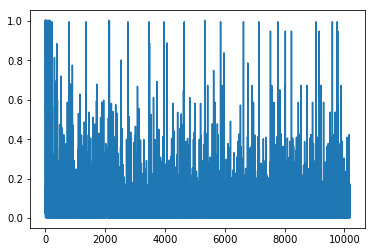

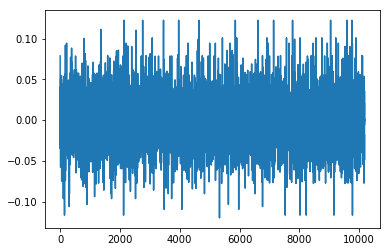

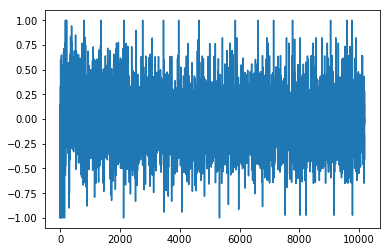

509
1.22790901044
[ 1.          0.77777778  1.          1.          1.          1.
  0.22222222  0.22222222  1.          0.44444444  0.77777778  0.77777778
  1.          1.          0.22222222  0.22222222  1.          1.          1.
  0.22222222  0.11111111  0.          0.44444444  0.          0.66666667
  0.          0.66666667  0.          0.33333333  0.33333333  0.33333333
  0.          0.22222222  0.          0.33333333  0.          0.
  0.33333333  0.          0.66666667  0.66666667  0.          0.
  0.33333333  0.          0.33333333  0.33333333  0.66666667  0.66666667
  0.66666667  0.          0.          0.77777778  0.22222222  0.44444444
  0.55555556  0.77777778  0.33333333  0.33333333]
Writing away results
1997-06-01 00:00:00


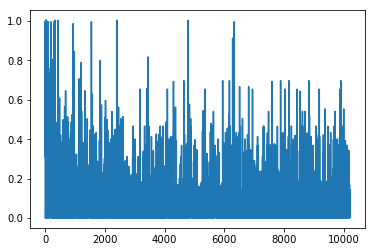

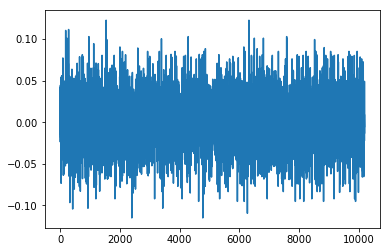

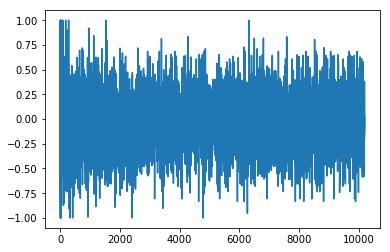

510
1.56353789301
[ 0.66666667  1.          0.44444444  0.22222222  1.          1.
  0.44444444  0.44444444  1.          1.          0.44444444  0.          0.
  1.          0.44444444  0.66666667  1.          0.22222222  1.
  0.88888889  0.22222222  0.22222222  0.22222222  0.33333333  0.77777778
  0.33333333  0.55555556  0.77777778  0.33333333  0.11111111  0.55555556
  0.22222222  0.11111111  0.66666667  0.88888889  0.77777778  0.11111111
  0.22222222  0.77777778  0.77777778  0.33333333  0.22222222  0.11111111
  0.88888889  0.22222222  0.22222222  0.33333333  0.77777778  0.33333333
  0.33333333  0.22222222  1.          0.44444444  0.33333333  1.
  0.88888889  0.33333333  0.88888889  0.22222222]
Writing away results
1997-07-01 00:00:00


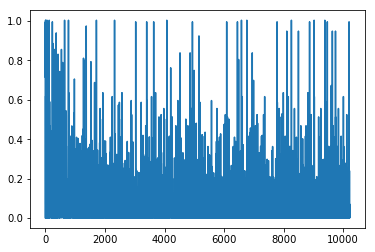

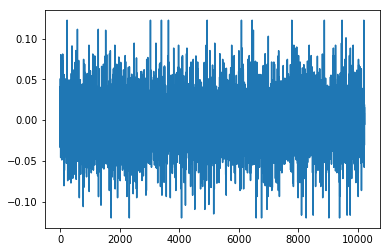

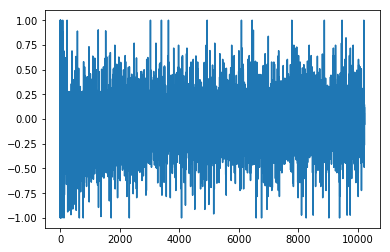

511
1.2976319798
[ 0.11111111  0.22222222  0.55555556  0.66666667  0.66666667  1.          1.
  0.55555556  0.11111111  0.33333333  1.          0.22222222  0.66666667
  0.11111111  0.22222222  0.          0.66666667  0.88888889  1.
  0.55555556  0.          0.33333333  0.77777778  0.          0.77777778
  0.88888889  0.          0.55555556  0.          0.          0.22222222
  0.55555556  0.          0.77777778  0.77777778  0.77777778  0.
  0.88888889  0.88888889  0.77777778  0.          0.          0.44444444
  0.77777778  0.          0.11111111  0.88888889  0.55555556  0.55555556
  0.          0.33333333  0.22222222  0.55555556  0.          0.11111111
  0.33333333  0.          0.          0.88888889]
Writing away results
1997-08-01 00:00:00


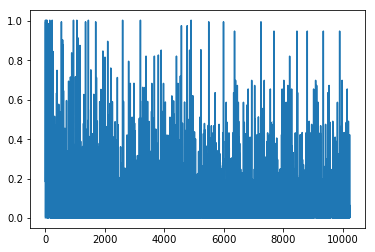

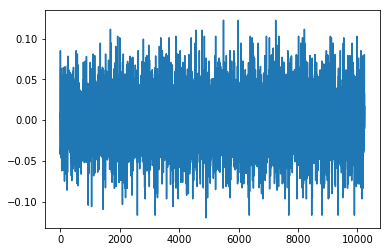

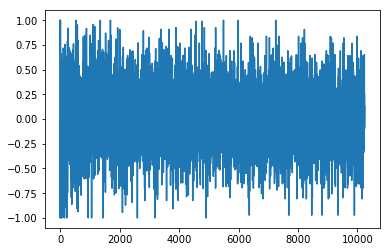

512
1.40252112421
[ 1.          0.88888889  1.          1.          0.33333333  0.33333333
  1.          1.          1.          0.33333333  0.33333333  0.88888889
  1.          1.          0.33333333  0.88888889  0.88888889  1.
  0.44444444  0.44444444  0.          0.44444444  0.          0.66666667
  0.          0.          0.          0.66666667  0.          0.55555556
  0.44444444  0.          0.          0.66666667  0.66666667  0.
  0.66666667  0.66666667  0.44444444  0.          0.66666667  0.66666667
  0.          0.          0.77777778  0.66666667  0.44444444  0.44444444
  0.          1.          0.66666667  0.44444444  0.          0.55555556
  0.          0.66666667  0.44444444  0.77777778  0.66666667]
Writing away results
1997-09-01 00:00:00


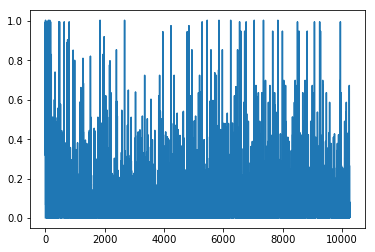

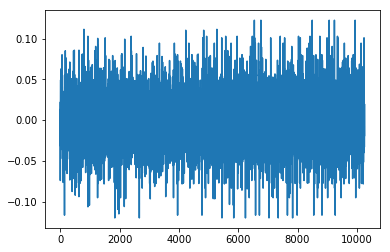

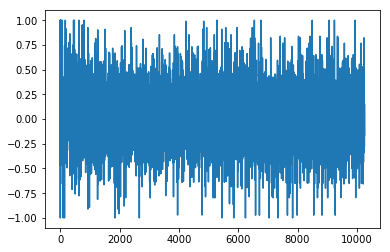

513
1.21136013074
[ 0.          1.          1.          1.          0.11111111  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.77777778  1.          0.44444444  0.          0.          0.22222222
  0.77777778  0.22222222  0.          0.          0.          0.22222222
  0.88888889  0.          0.66666667  0.88888889  0.          0.22222222
  0.22222222  0.          0.          0.22222222  0.88888889  0.88888889
  0.22222222  0.          0.22222222  0.88888889  0.22222222  0.          0.
  0.88888889  0.88888889  0.66666667  1.          0.66666667  0.
  0.11111111  0.66666667  0.88888889  0.          0.22222222  0.77777778
  0.          0.88888889]
Writing away results
1997-10-01 00:00:00


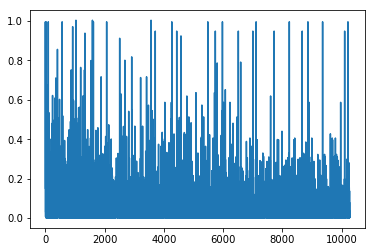

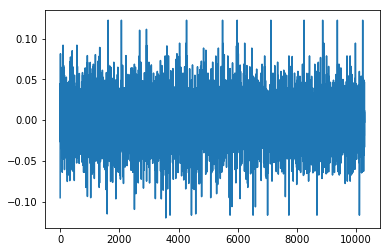

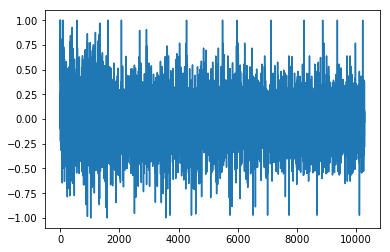

514
1.25515276156
[ 0.44444444  0.44444444  0.66666667  0.66666667  0.55555556  0.44444444
  0.44444444  0.88888889  0.66666667  0.44444444  0.44444444  1.
  0.77777778  1.          0.44444444  0.11111111  0.66666667  0.22222222
  0.33333333  0.11111111  0.33333333  0.22222222  0.33333333  0.33333333
  0.33333333  0.22222222  0.77777778  0.66666667  0.33333333  0.77777778
  0.77777778  0.33333333  0.77777778  0.77777778  0.22222222  0.33333333
  0.33333333  0.77777778  0.          0.33333333  0.11111111  0.77777778
  0.          0.22222222  0.33333333  0.77777778  0.33333333  0.44444444
  0.66666667  0.22222222  0.77777778  0.          0.11111111  0.88888889
  0.77777778  0.22222222  0.33333333  0.11111111  0.33333333]
Writing away results
1997-11-01 00:00:00


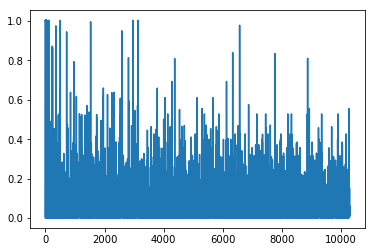

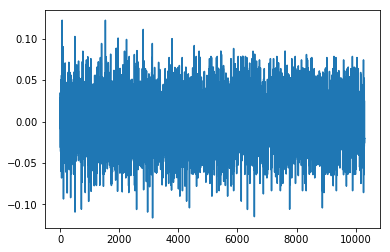

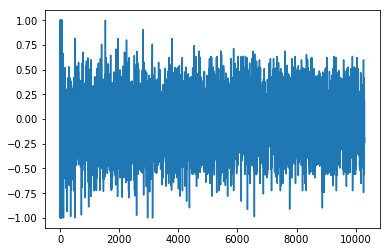

515
1.44896807014
[ 0.11111111  0.11111111  1.          0.55555556  0.11111111  0.55555556
  0.55555556  1.          0.77777778  0.11111111  1.          0.55555556
  0.77777778  0.11111111  0.11111111  0.66666667  0.66666667  0.44444444
  0.22222222  0.          0.44444444  0.          0.44444444  0.66666667
  0.22222222  0.77777778  1.          0.66666667  0.22222222  0.77777778
  0.44444444  0.          0.66666667  0.77777778  0.44444444  0.66666667
  0.66666667  0.77777778  0.44444444  0.44444444  0.          0.77777778
  0.44444444  0.66666667  0.66666667  0.          0.33333333  0.44444444
  0.66666667  0.55555556  0.88888889  0.44444444  0.          0.66666667
  0.77777778  0.44444444  0.22222222  0.66666667  0.66666667]
Writing away results
1997-12-01 00:00:00


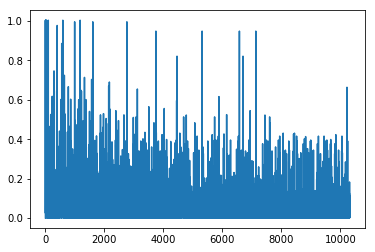

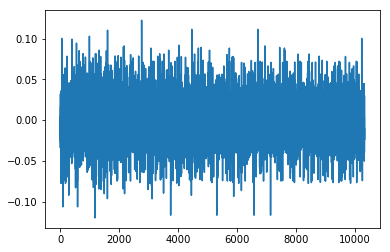

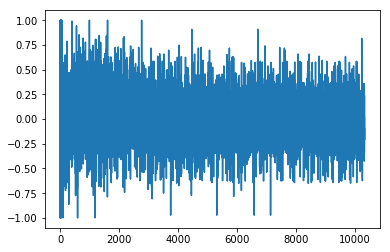

516
1.49769645686
[ 0.22222222  0.22222222  0.66666667  0.22222222  0.22222222  1.
  0.66666667  0.66666667  0.22222222  1.          0.66666667  0.66666667
  0.22222222  1.          0.55555556  0.          0.          0.
  0.55555556  0.          0.55555556  0.          0.55555556  0.11111111
  0.88888889  0.22222222  0.11111111  0.44444444  0.88888889  0.
  0.55555556  0.55555556  0.          0.          0.55555556  0.55555556
  0.11111111  0.11111111  0.55555556  0.55555556  0.          0.          1.
  0.11111111  0.11111111  0.77777778  0.55555556  0.55555556  0.44444444
  0.          0.11111111  0.55555556  0.55555556  0.          0.77777778
  1.          0.55555556  0.          0.11111111]
Writing away results
1998-01-01 00:00:00


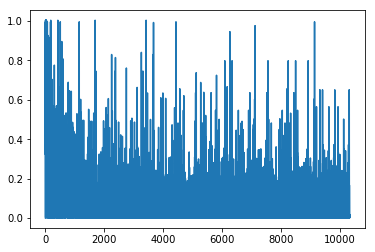

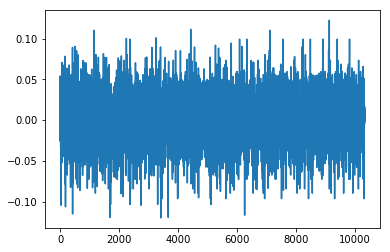

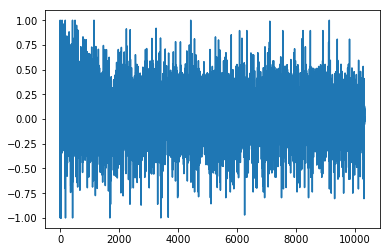

517
1.25803184586
[ 0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.55555556  0.          0.77777778
  0.88888889  0.22222222  0.11111111  0.88888889  0.88888889  0.88888889
  0.11111111  0.22222222  0.88888889  0.33333333  0.11111111  0.88888889
  0.44444444  0.88888889  0.22222222  0.88888889  0.88888889  0.88888889
  0.11111111  0.33333333  0.88888889  0.11111111  0.11111111  0.88888889
  0.88888889  0.11111111  0.11111111  1.          0.33333333  0.11111111
  0.11111111  0.22222222  0.88888889  0.44444444  0.11111111  0.66666667
  0.88888889  0.33333333  0.88888889  0.77777778  0.11111111  0.88888889
  0.11111111  0.11111111  0.88888889  0.88888889]
Writing away results
1998-02-01 00:00:00


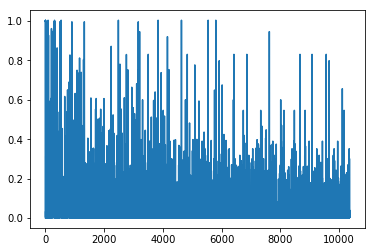

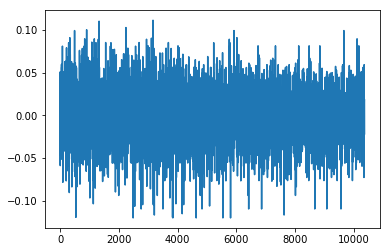

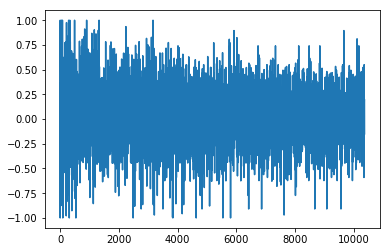

518
1.60828145459
[ 0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.33333333  0.77777778
  0.22222222  0.66666667  0.66666667  0.66666667  0.22222222  0.66666667
  0.66666667  0.66666667  0.          0.          1.          0.33333333
  0.          0.66666667  0.77777778  0.          0.22222222  0.66666667
  0.66666667  0.22222222  0.22222222  0.          0.77777778  0.22222222
  0.          1.          0.66666667  0.66666667  0.22222222  0.          0.
  0.11111111  0.33333333  0.          0.66666667  0.66666667  0.          1.
  0.22222222  0.66666667  0.22222222  0.22222222  0.          0.77777778
  0.          0.77777778  0.        ]
Writing away results
1998-03-01 00:00:00


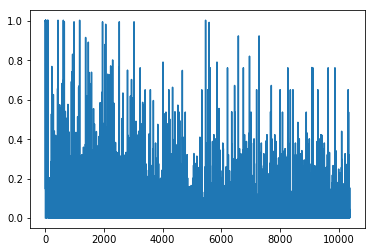

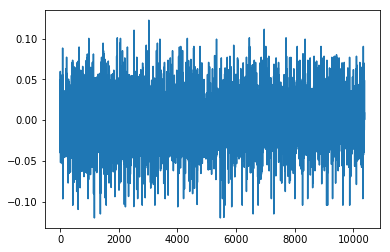

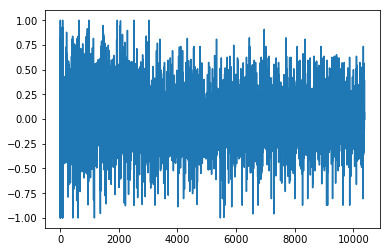

519
1.25996314007
[ 0.22222222  0.22222222  0.33333333  0.88888889  0.44444444  0.22222222
  0.55555556  0.88888889  0.          0.22222222  0.55555556  0.11111111
  0.88888889  0.11111111  0.88888889  0.11111111  0.88888889  0.11111111
  0.77777778  0.11111111  0.88888889  0.11111111  0.11111111  0.88888889
  0.11111111  0.11111111  0.11111111  0.88888889  0.11111111  0.11111111
  1.          0.88888889  0.11111111  0.11111111  0.11111111  0.11111111
  0.88888889  0.77777778  0.77777778  0.77777778  0.11111111  0.11111111
  0.44444444  0.77777778  0.88888889  0.11111111  0.          0.11111111
  0.33333333  0.11111111  0.11111111  1.          0.88888889  0.11111111
  0.11111111  0.11111111  0.11111111  0.88888889  0.77777778]
Writing away results
1998-04-01 00:00:00


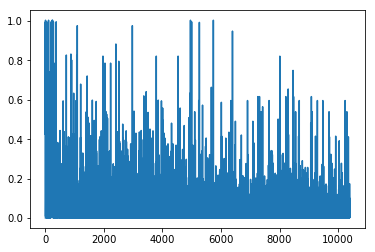

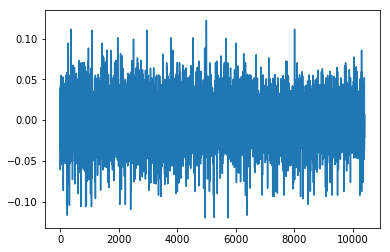

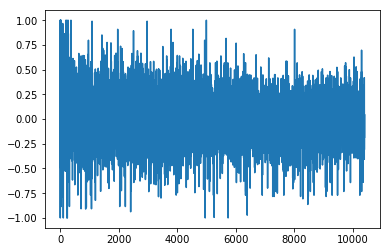

520
1.15219607176
[ 0.22222222  0.22222222  0.22222222  0.11111111  0.22222222  0.22222222
  0.11111111  0.11111111  0.          0.22222222  0.44444444  0.44444444
  0.44444444  0.44444444  0.77777778  0.44444444  0.44444444  0.44444444
  0.77777778  0.44444444  0.66666667  0.44444444  0.77777778  0.44444444
  0.66666667  0.77777778  0.44444444  0.44444444  0.44444444  0.88888889
  0.44444444  0.44444444  0.44444444  0.77777778  0.77777778  0.66666667
  0.66666667  0.44444444  0.88888889  0.44444444  0.44444444  0.
  0.77777778  0.55555556  0.44444444  0.          0.77777778  0.55555556
  0.44444444  0.44444444  0.88888889  0.44444444  0.44444444  0.44444444
  0.44444444  0.77777778  0.77777778  0.44444444  0.66666667]
Writing away results
1998-05-01 00:00:00


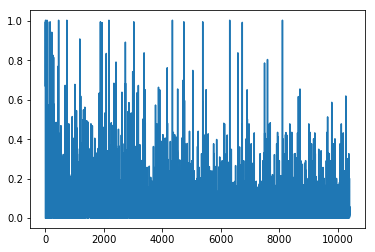

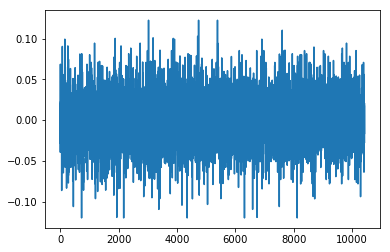

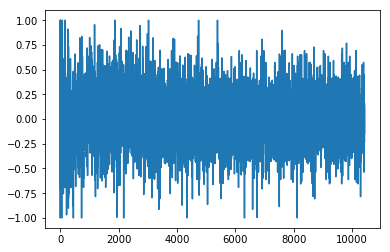

521
1.3202719267
[ 0.33333333  0.88888889  0.44444444  0.44444444  0.44444444  0.88888889
  0.88888889  0.44444444  0.44444444  0.11111111  0.11111111  0.88888889
  0.11111111  0.11111111  0.11111111  0.11111111  0.          0.11111111
  0.11111111  0.88888889  0.77777778  0.55555556  1.          0.11111111
  0.11111111  0.11111111  0.11111111  0.          0.44444444  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.
  0.66666667  0.11111111  0.11111111  0.11111111  0.          0.77777778
  0.11111111  0.55555556  0.          0.11111111  0.11111111  0.11111111
  0.          0.33333333  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  1.          0.88888889  0.77777778]
Writing away results
1998-06-01 00:00:00


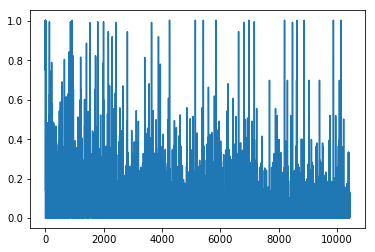

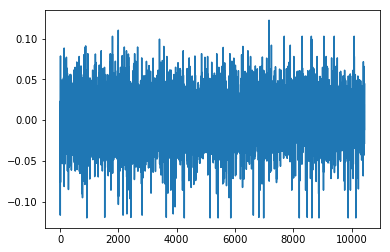

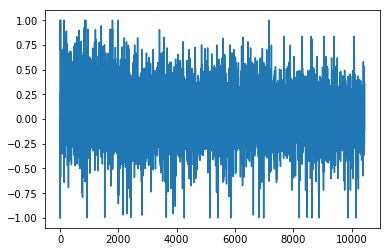

522
1.51226846828
[ 0.55555556  0.33333333  0.55555556  0.55555556  0.          0.33333333
  0.88888889  0.55555556  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.66666667  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.88888889  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.77777778
  0.22222222  0.11111111  0.11111111  0.66666667  0.11111111  0.11111111
  0.          0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.22222222  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.88888889  1.          0.11111111]
Writing away results
1998-07-01 00:00:00


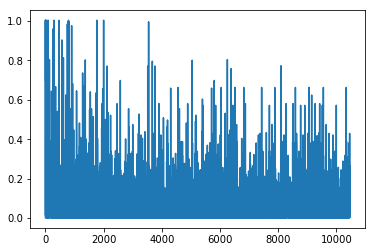

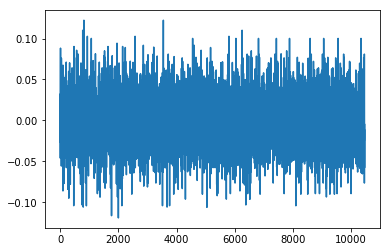

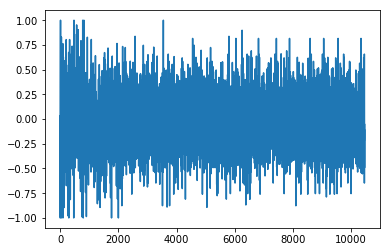

523
1.41431985456
[ 0.22222222  0.77777778  0.77777778  0.77777778  0.22222222  1.
  0.77777778  0.          0.          0.          0.          0.66666667
  0.          0.          0.          0.          0.          0.66666667
  0.          0.          0.          0.          0.          0.          0.
  0.          0.11111111  0.          0.          0.          0.88888889
  0.          0.66666667  0.          0.11111111  0.          0.          0.
  0.77777778  0.11111111  0.          0.88888889  0.          0.
  0.66666667  0.          0.          0.11111111  0.          0.          0.
  0.88888889  0.          0.66666667  0.          0.66666667  0.33333333
  0.          0.        ]
Writing away results
1998-08-01 00:00:00


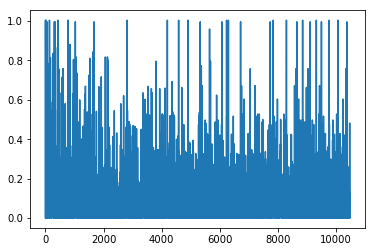

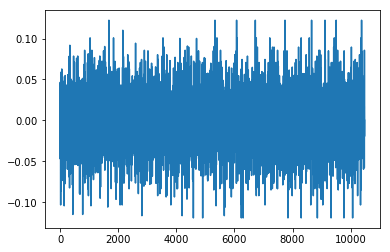

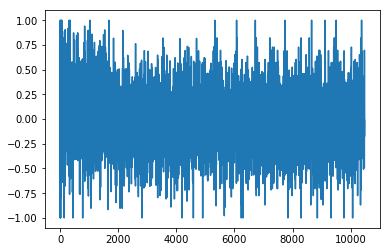

524
1.45746703001
[ 0.11111111  1.          0.55555556  0.33333333  0.33333333  1.
  0.44444444  0.66666667  0.11111111  0.          0.55555556  0.66666667
  0.55555556  0.11111111  0.          0.55555556  0.33333333  0.11111111
  0.66666667  0.44444444  0.          0.11111111  0.          0.          0.
  0.11111111  0.66666667  0.66666667  0.          0.11111111  0.11111111
  0.          0.          0.11111111  0.44444444  0.66666667  0.55555556
  1.          0.11111111  0.66666667  0.33333333  0.11111111  0.55555556
  0.55555556  0.          0.22222222  0.55555556  0.66666667  0.55555556
  0.44444444  0.          0.11111111  0.          0.11111111  0.11111111
  0.66666667  0.55555556  0.66666667  0.        ]
Writing away results
1998-09-01 00:00:00


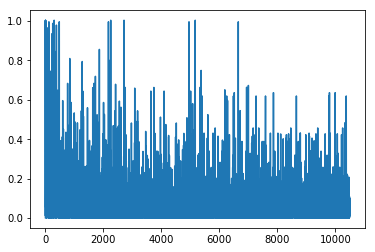

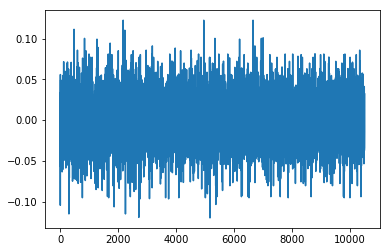

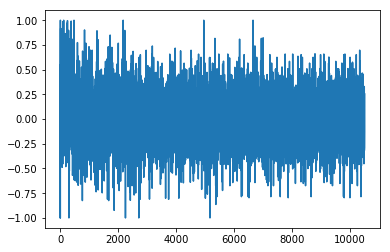

525
1.63776764222
[ 0.66666667  0.          1.          0.66666667  0.66666667  0.11111111
  0.11111111  1.          0.22222222  0.33333333  0.11111111  0.
  0.11111111  0.          0.11111111  0.11111111  0.22222222  0.22222222
  1.          1.          0.22222222  0.11111111  0.11111111  0.22222222
  1.          0.11111111  0.11111111  0.11111111  0.33333333  0.22222222
  0.11111111  1.          0.66666667  1.          0.11111111  0.11111111
  0.55555556  0.77777778  0.11111111  1.          1.          0.22222222
  0.11111111  0.11111111  0.22222222  1.          0.11111111  0.11111111
  0.11111111  0.          0.22222222  0.22222222  0.88888889  1.
  0.66666667  0.22222222  0.          0.          0.55555556]
Writing away results
1998-10-01 00:00:00


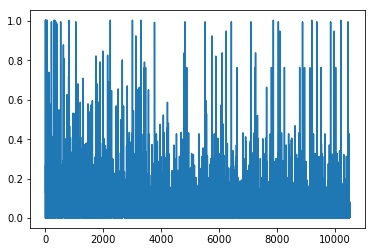

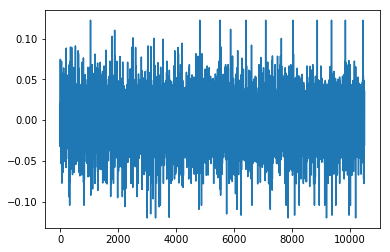

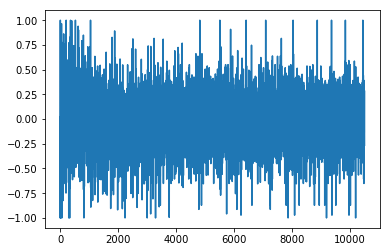

526
1.24261332845
[ 0.77777778  1.          0.11111111  0.44444444  0.55555556  0.
  0.55555556  0.55555556  0.55555556  0.          0.55555556  0.55555556
  0.55555556  0.33333333  0.55555556  0.11111111  0.77777778  0.33333333
  0.          0.55555556  0.55555556  0.55555556  0.          0.55555556
  0.77777778  0.          0.66666667  0.55555556  0.55555556  0.33333333
  0.11111111  0.55555556  0.55555556  0.          0.55555556  0.11111111
  0.55555556  0.77777778  0.22222222  0.66666667  0.55555556  0.33333333
  0.55555556  0.          0.55555556  0.77777778  0.55555556  0.44444444
  0.55555556  0.55555556  0.55555556  0.33333333  0.66666667  0.
  0.77777778  1.          0.          0.11111111  0.11111111]
Writing away results
1998-11-01 00:00:00


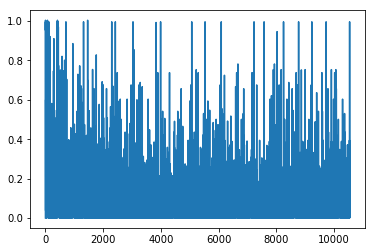

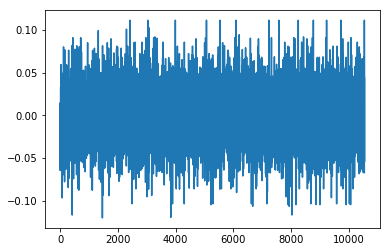

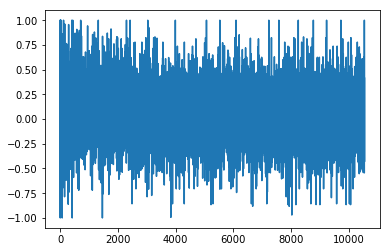

527
1.53758815443
[ 0.88888889  0.22222222  0.88888889  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  1.          0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.88888889  0.55555556
  0.55555556  0.66666667  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.44444444  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.66666667  0.55555556  1.          0.55555556
  0.55555556  0.66666667  0.88888889  0.88888889  0.55555556]
Writing away results
1998-12-01 00:00:00


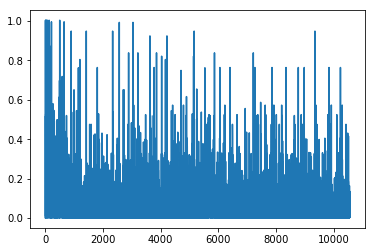

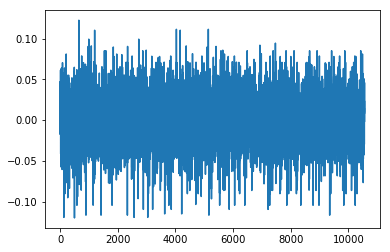

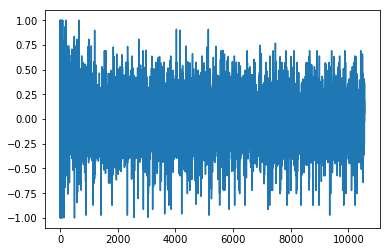

528
1.60925711052
[ 0.33333333  0.          0.77777778  1.          0.77777778  1.
  0.77777778  0.77777778  0.22222222  0.77777778  0.77777778  0.22222222
  0.77777778  1.          0.22222222  0.22222222  0.33333333  0.77777778
  0.22222222  0.22222222  0.77777778  0.77777778  0.77777778  0.22222222
  0.22222222  0.77777778  0.77777778  0.22222222  1.          0.77777778
  0.77777778  0.22222222  0.22222222  0.77777778  0.77777778  1.
  0.88888889  0.33333333  0.77777778  0.22222222  0.22222222  1.
  0.77777778  0.77777778  0.22222222  0.77777778  0.33333333  0.77777778
  0.77777778  0.88888889  0.77777778  0.55555556  0.22222222  0.22222222
  0.33333333  0.11111111  0.55555556  0.22222222  0.66666667]
Writing away results
1999-01-01 00:00:00


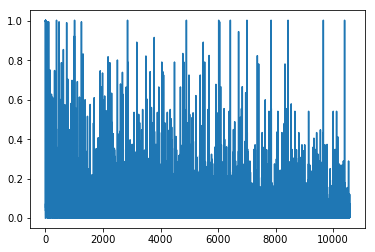

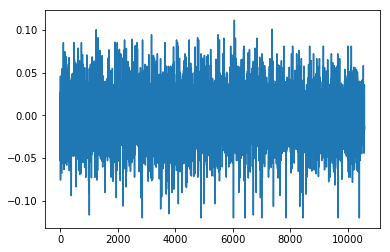

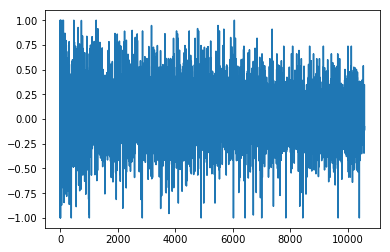

529
1.3559288907
[ 0.22222222  0.55555556  0.55555556  0.55555556  0.66666667  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.88888889  0.55555556  0.55555556  0.55555556  0.55555556  0.77777778
  0.55555556  0.55555556  0.11111111  0.88888889  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.66666667  1.
  0.55555556  0.55555556  0.44444444  0.88888889  0.55555556  0.33333333
  1.          0.55555556  0.          0.55555556  0.44444444  0.
  0.88888889  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.88888889  0.          0.55555556  0.55555556
  0.22222222  0.22222222  0.55555556  0.33333333  1.        ]
Writing away results
1999-02-01 00:00:00


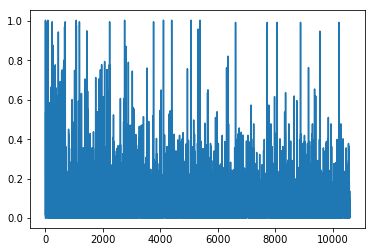

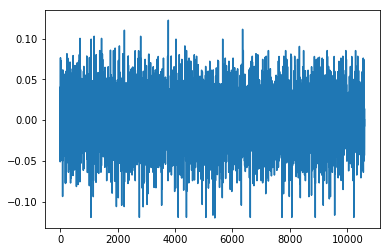

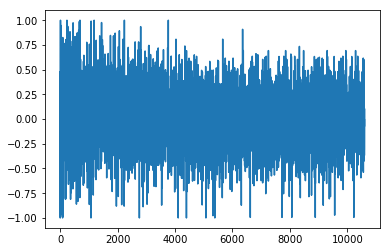

530
1.56032222393
[ 0.44444444  0.44444444  0.44444444  0.88888889  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.77777778  0.44444444
  0.44444444  0.44444444  0.88888889  0.44444444  0.44444444  0.44444444
  0.77777778  0.33333333  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.77777778  0.77777778  0.44444444  0.44444444
  0.44444444  0.77777778  0.44444444  0.44444444  0.77777778  0.88888889
  0.44444444  0.44444444  0.44444444  0.66666667  0.11111111  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.77777778  0.22222222  0.44444444  0.44444444  0.44444444  0.33333333
  0.11111111  0.44444444  1.          0.77777778  0.        ]
Writing away results
1999-03-01 00:00:00


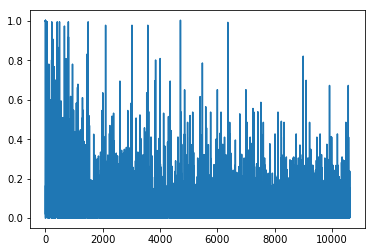

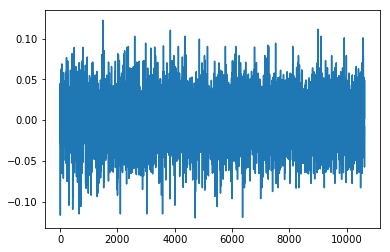

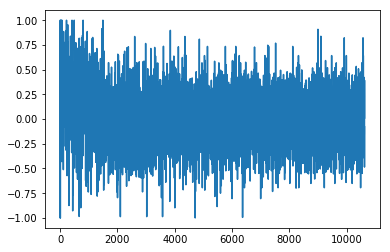

531
1.23519815817
[ 0.44444444  0.66666667  0.44444444  0.77777778  0.77777778  0.66666667
  0.44444444  0.77777778  0.44444444  0.66666667  0.77777778  0.33333333
  0.88888889  0.44444444  0.33333333  0.77777778  0.44444444  0.66666667
  0.22222222  0.44444444  0.33333333  0.33333333  0.77777778  0.44444444
  0.66666667  0.11111111  0.          0.88888889  0.44444444  0.33333333
  0.66666667  1.          0.33333333  0.55555556  0.22222222  0.77777778
  0.44444444  0.77777778  0.33333333  0.66666667  0.44444444  0.88888889
  0.66666667  0.44444444  0.44444444  0.77777778  0.44444444  0.66666667
  0.          0.88888889  0.77777778  0.33333333  0.66666667  0.22222222
  0.44444444  0.55555556  0.55555556  0.33333333  0.88888889]
Writing away results
1999-04-01 00:00:00


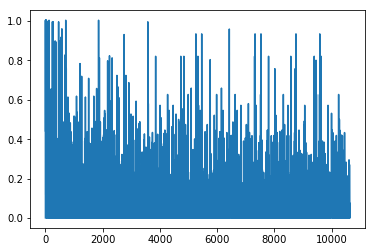

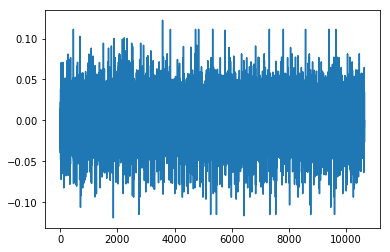

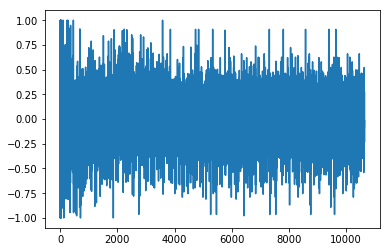

532
1.34410361598
[ 1.          1.          0.66666667  1.          0.22222222  0.66666667
  0.66666667  1.          0.11111111  0.66666667  1.          1.
  0.77777778  0.66666667  0.66666667  0.66666667  1.          0.66666667
  0.66666667  0.11111111  1.          0.66666667  0.66666667  0.11111111
  0.77777778  1.          0.66666667  0.66666667  1.          0.11111111
  0.66666667  0.11111111  1.          0.88888889  0.66666667  1.
  0.22222222  1.          1.          0.66666667  0.66666667  1.
  0.66666667  0.66666667  0.66666667  0.33333333  0.88888889  0.55555556
  1.          0.66666667  1.          1.          0.55555556  0.11111111
  1.          0.          0.66666667  1.          0.66666667]
Writing away results
1999-05-01 00:00:00


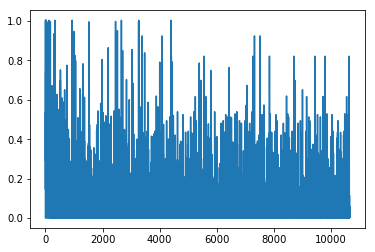

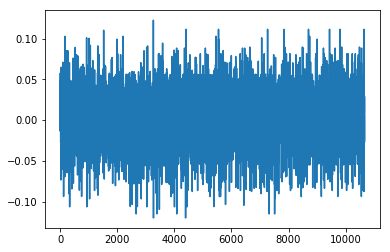

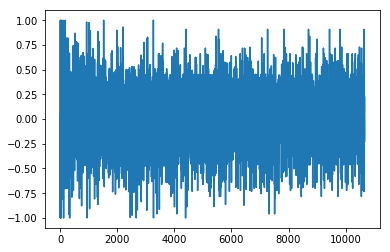

533
1.51448119506
[ 0.77777778  1.          0.77777778  1.          0.77777778  0.77777778
  0.44444444  1.          0.66666667  1.          1.          0.77777778
  0.77777778  1.          1.          0.77777778  0.88888889  0.44444444
  1.          0.77777778  1.          0.55555556  0.11111111  0.77777778
  0.77777778  0.77777778  1.          0.44444444  0.33333333  0.88888889
  0.77777778  1.          0.77777778  0.77777778  0.55555556  1.
  0.77777778  1.          0.44444444  0.44444444  0.11111111  1.
  0.77777778  1.          0.55555556  0.11111111  0.88888889  1.          1.
  0.55555556  0.11111111  0.88888889  0.77777778  0.11111111  0.44444444
  0.77777778  1.          0.44444444  0.77777778]
Writing away results
1999-06-01 00:00:00


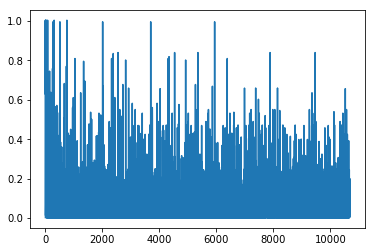

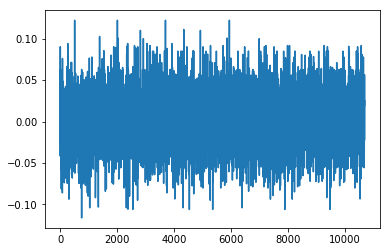

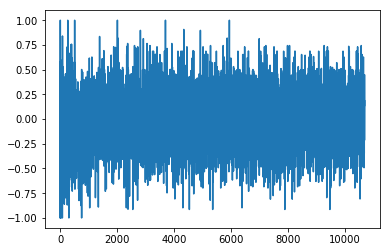

534
1.3220027358
[ 0.88888889  1.          0.88888889  1.          0.88888889  1.
  0.88888889  1.          0.55555556  1.          0.66666667  0.55555556
  1.          1.          0.66666667  0.88888889  1.          0.33333333
  0.11111111  0.55555556  0.33333333  1.          1.          0.88888889
  0.22222222  1.          0.55555556  0.66666667  1.          0.55555556
  0.11111111  0.33333333  0.55555556  1.          1.          0.66666667
  0.88888889  1.          0.88888889  1.          0.55555556  1.
  0.88888889  0.22222222  1.          0.66666667  1.          0.33333333
  0.55555556  0.          0.77777778  0.88888889  0.22222222  0.11111111
  0.55555556  0.44444444  1.          0.88888889  0.55555556]
Writing away results
1999-07-01 00:00:00


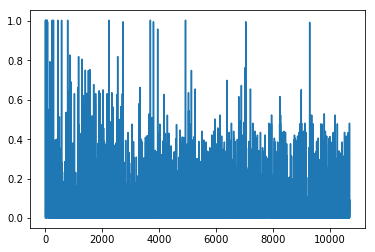

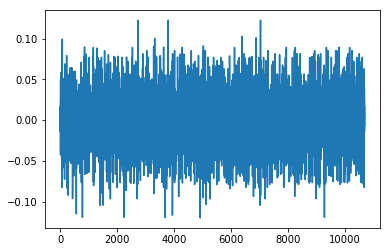

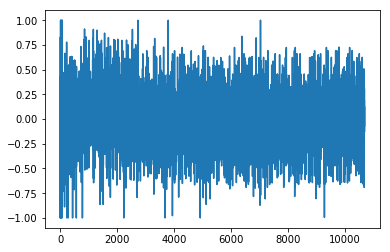

535
1.59368167572
[ 0.22222222  1.          0.22222222  1.          0.22222222  1.          0.
  0.11111111  0.22222222  1.          0.22222222  0.22222222  0.22222222
  0.11111111  1.          0.22222222  1.          0.22222222  1.
  0.22222222  0.22222222  0.11111111  0.11111111  0.22222222  1.
  0.22222222  0.66666667  0.22222222  0.22222222  0.88888889  0.22222222
  0.11111111  0.22222222  0.22222222  0.11111111  0.22222222  0.55555556
  0.22222222  0.22222222  1.          0.22222222  1.          0.88888889
  0.22222222  0.55555556  0.22222222  1.          1.          0.
  0.77777778  0.22222222  0.33333333  0.22222222  0.11111111  1.
  0.22222222  0.22222222  0.22222222  1.        ]
Writing away results
1999-08-01 00:00:00


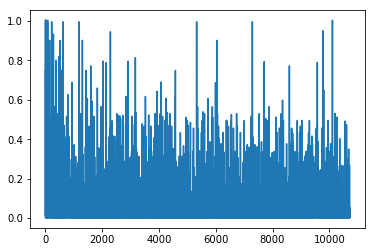

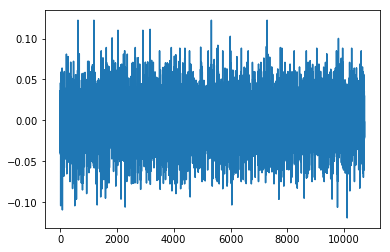

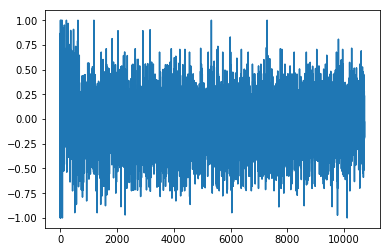

536
1.27334653982
[ 0.77777778  0.44444444  0.77777778  0.11111111  0.55555556  0.66666667
  0.77777778  0.77777778  0.77777778  0.11111111  0.77777778  0.77777778
  0.77777778  0.11111111  0.66666667  0.77777778  0.77777778  0.77777778
  0.11111111  0.77777778  0.77777778  0.11111111  0.11111111  0.77777778
  0.77777778  0.55555556  0.66666667  0.77777778  0.          0.44444444
  0.11111111  0.88888889  0.77777778  0.11111111  0.55555556  0.66666667
  0.11111111  0.77777778  0.77777778  0.11111111  0.77777778  0.88888889
  1.          1.          0.11111111  0.77777778  0.11111111  0.55555556
  0.66666667  0.33333333  0.          0.77777778  0.11111111  0.88888889
  0.77777778  0.11111111  0.88888889  0.44444444  0.66666667]
Writing away results
1999-09-01 00:00:00


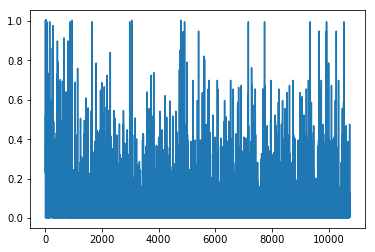

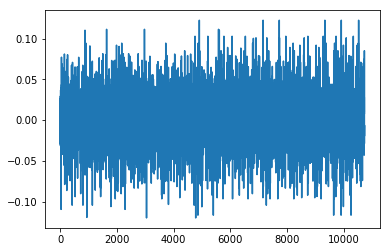

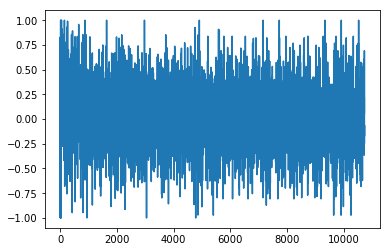

537
1.48329131871
[ 0.33333333  0.22222222  0.33333333  0.66666667  0.11111111  0.22222222
  0.33333333  0.66666667  0.22222222  0.33333333  0.33333333  0.
  0.33333333  0.33333333  0.33333333  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  1.          0.33333333  0.33333333  0.22222222
  0.          0.22222222  1.          0.44444444  0.77777778  0.22222222
  0.33333333  0.22222222  0.          0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.22222222  0.33333333  0.44444444  0.
  0.33333333  0.33333333  0.33333333  0.22222222  0.          1.          1.
  1.          0.33333333  0.33333333  0.33333333  0.33333333  0.22222222
  0.22222222  0.33333333  0.33333333  0.88888889]
Writing away results
1999-10-01 00:00:00


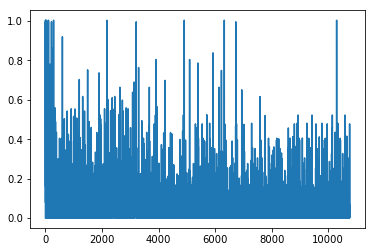

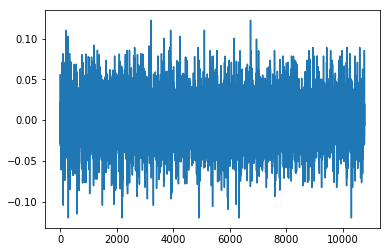

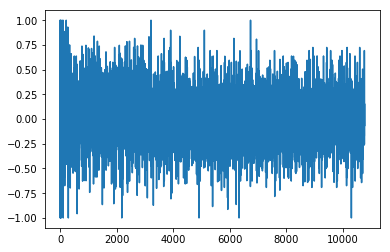

538
1.4778993016
[ 0.22222222  0.22222222  0.22222222  0.22222222  1.          0.22222222
  1.          0.22222222  0.22222222  0.22222222  0.11111111  0.77777778
  0.22222222  1.          0.11111111  0.22222222  0.22222222  0.22222222
  0.88888889  0.77777778  1.          1.          0.22222222  0.33333333
  0.22222222  0.11111111  0.88888889  0.22222222  0.88888889  0.22222222
  0.22222222  0.11111111  0.22222222  0.22222222  1.          0.22222222
  0.88888889  0.22222222  0.22222222  0.88888889  0.22222222  0.88888889
  0.22222222  0.22222222  0.88888889  0.33333333  0.22222222  0.22222222
  0.33333333  0.22222222  0.11111111  0.22222222  0.22222222  1.
  0.22222222  0.33333333  0.88888889  1.          0.88888889]
Writing away results
1999-11-01 00:00:00


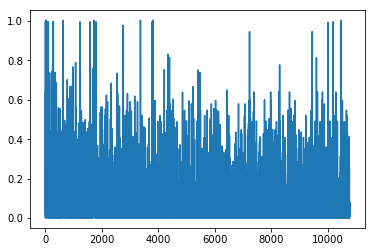

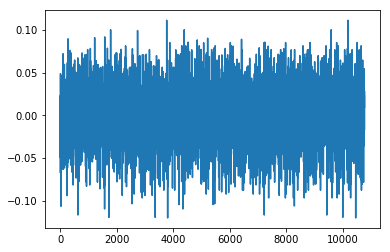

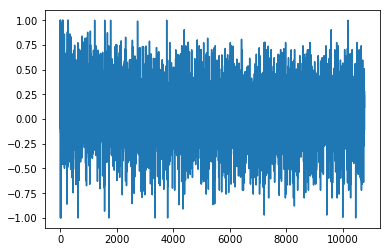

539
1.27428965482
[ 0.22222222  0.22222222  0.77777778  0.44444444  1.          0.88888889
  1.          1.          1.          0.66666667  0.44444444  1.          1.
  0.22222222  0.55555556  0.55555556  0.66666667  0.88888889  1.          1.
  1.          1.          0.33333333  0.55555556  0.66666667  1.
  0.22222222  0.55555556  0.66666667  1.          0.88888889  1.          1.
  1.          0.22222222  1.          0.22222222  0.44444444  1.
  0.66666667  1.          1.          1.          0.22222222  0.33333333
  0.55555556  0.55555556  0.11111111  1.          1.          1.
  0.22222222  1.          1.          0.11111111  1.          0.66666667
  0.66666667  0.11111111]
Writing away results
1999-12-01 00:00:00


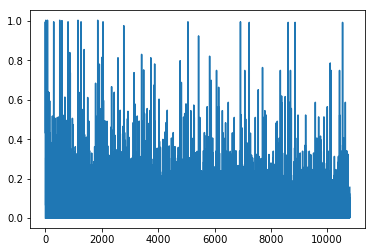

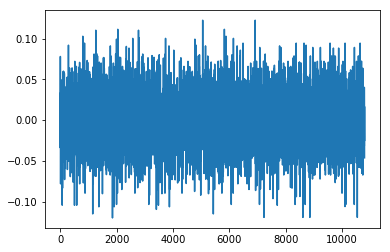

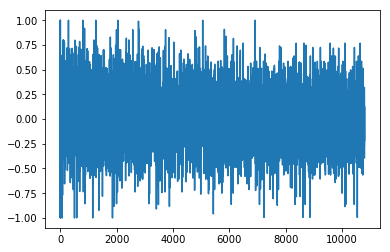

540
1.40299219147
[ 0.22222222  0.55555556  0.44444444  1.          0.22222222  0.33333333
  0.44444444  0.22222222  0.33333333  0.66666667  0.22222222  0.22222222
  0.22222222  0.22222222  0.55555556  0.          0.33333333  0.55555556
  0.44444444  0.22222222  0.22222222  0.77777778  0.          0.55555556
  1.          0.88888889  0.22222222  0.44444444  0.44444444  0.55555556
  0.66666667  0.55555556  0.22222222  0.22222222  0.22222222  0.22222222
  0.33333333  0.11111111  0.66666667  0.55555556  0.22222222  0.22222222
  0.33333333  0.88888889  0.77777778  0.          1.          0.88888889
  0.22222222  0.22222222  0.22222222  0.22222222  0.44444444  0.22222222
  0.22222222  0.55555556  1.          0.22222222  0.33333333]
Writing away results
2000-01-01 00:00:00


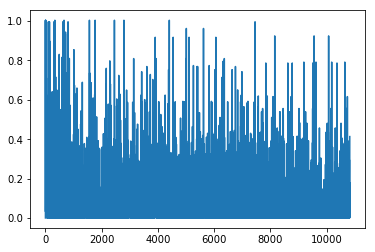

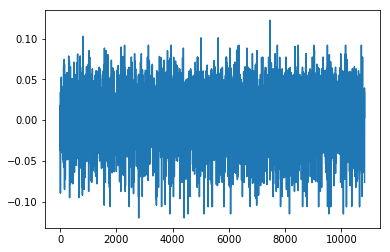

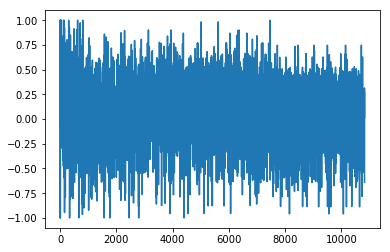

541
1.15418924607
[ 0.33333333  1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.66666667  1.          1.          0.66666667  0.66666667
  1.          1.          0.66666667  0.66666667  0.11111111  0.33333333
  0.66666667  0.66666667  0.77777778  0.88888889  0.33333333  0.66666667
  0.66666667  1.          0.44444444  0.66666667  0.66666667  1.
  0.66666667  0.66666667  1.          0.66666667  1.          1.
  0.33333333  0.66666667  0.          1.          0.66666667  0.66666667
  1.          0.22222222  0.33333333  0.66666667  0.66666667  1.          1.
  1.          0.66666667  1.          0.66666667  1.          1.
  0.33333333  0.66666667  0.88888889  0.        ]
Writing away results
2000-02-01 00:00:00


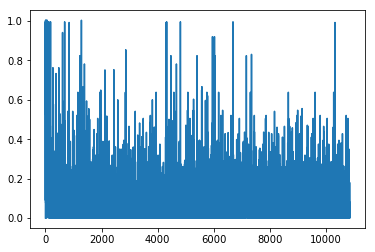

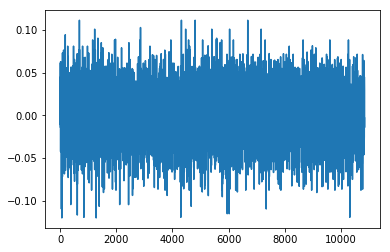

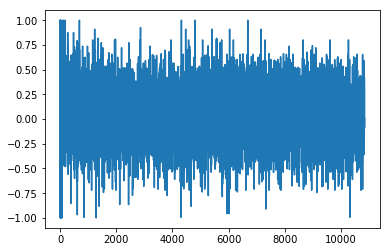

542
1.1792079393
[ 0.66666667  0.77777778  0.77777778  0.66666667  0.77777778  0.77777778
  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667
  0.66666667  0.77777778  0.55555556  1.          0.22222222  0.77777778
  0.66666667  0.77777778  0.55555556  0.77777778  0.77777778  0.11111111
  0.66666667  1.          0.77777778  0.33333333  0.66666667  0.77777778
  1.          0.66666667  0.77777778  0.66666667  0.77777778  1.
  0.44444444  0.11111111  1.          0.77777778  0.66666667  0.66666667
  0.11111111  1.          0.88888889  0.          0.66666667  1.
  0.77777778  0.44444444  0.66666667  0.77777778  0.55555556  0.66666667
  0.77777778  0.11111111  0.33333333  0.22222222  0.77777778]
Writing away results
2000-03-01 00:00:00


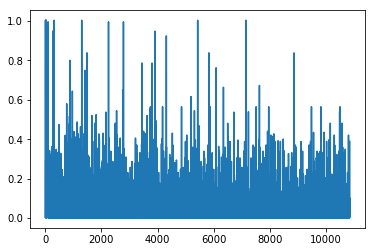

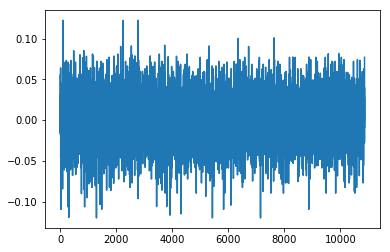

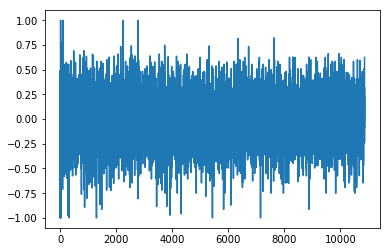

543
1.54822257724
[ 0.55555556  1.          0.          0.22222222  0.          0.55555556
  0.11111111  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.          0.55555556  0.55555556  0.22222222  0.55555556  0.55555556
  0.66666667  0.33333333  0.55555556  0.55555556  0.55555556  0.
  0.55555556  1.          0.          0.22222222  0.44444444  0.55555556
  0.55555556  1.          0.55555556  0.          0.44444444  1.
  0.33333333  0.55555556  0.55555556  0.          0.88888889  0.66666667
  0.44444444  0.          1.          0.          0.          0.44444444
  0.          0.22222222  0.          0.55555556  0.55555556  0.22222222
  0.55555556  0.11111111  0.33333333  0.44444444  0.44444444]
Writing away results
2000-04-01 00:00:00


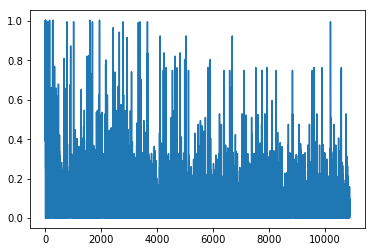

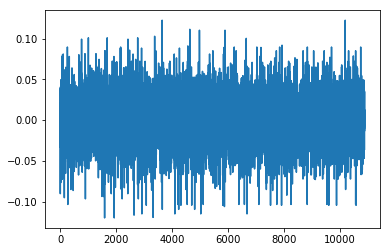

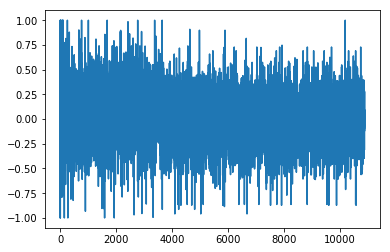

544
1.14817837016
[ 0.44444444  0.55555556  0.55555556  0.55555556  0.44444444  0.66666667
  0.55555556  0.55555556  0.55555556  0.55555556  0.33333333  0.55555556
  0.66666667  0.66666667  0.55555556  0.55555556  0.55555556  0.11111111
  0.66666667  0.55555556  1.          0.66666667  0.55555556  0.33333333
  0.55555556  0.44444444  0.66666667  0.55555556  0.55555556  0.55555556
  1.          0.55555556  0.55555556  0.33333333  0.66666667  0.44444444
  0.55555556  0.55555556  0.55555556  0.11111111  0.          0.77777778
  0.          0.44444444  0.55555556  0.33333333  0.55555556  0.44444444
  0.55555556  0.11111111  0.44444444  0.55555556  0.33333333  0.11111111
  0.66666667  0.33333333  0.          0.44444444  1.        ]
Writing away results
2000-05-01 00:00:00


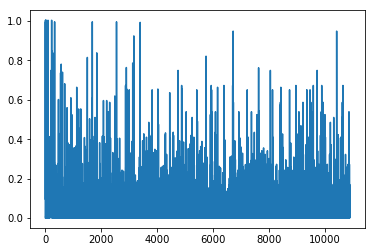

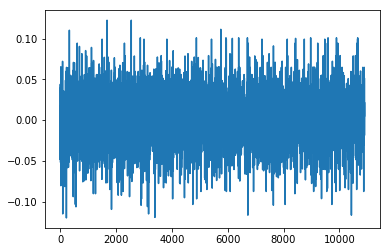

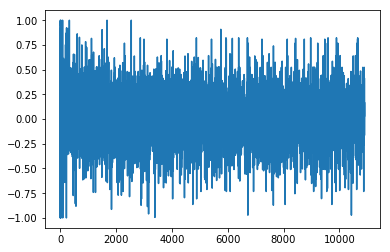

545
1.01997033714
[ 0.88888889  0.22222222  0.88888889  0.55555556  0.66666667  0.22222222
  0.88888889  0.22222222  0.88888889  0.88888889  0.77777778  0.44444444
  0.11111111  0.77777778  0.22222222  0.88888889  0.55555556  0.77777778
  0.88888889  0.44444444  0.22222222  0.66666667  0.33333333  0.77777778
  0.55555556  0.11111111  0.22222222  0.88888889  0.22222222  0.88888889
  0.22222222  0.77777778  0.33333333  0.44444444  0.66666667  0.22222222
  0.22222222  0.88888889  0.55555556  0.66666667  0.77777778  0.
  0.44444444  0.22222222  0.22222222  0.22222222  0.88888889  0.77777778
  0.55555556  0.22222222  0.88888889  0.66666667  0.44444444  0.11111111
  0.33333333  0.66666667  0.44444444  0.11111111  0.22222222]
Writing away results
2000-06-01 00:00:00


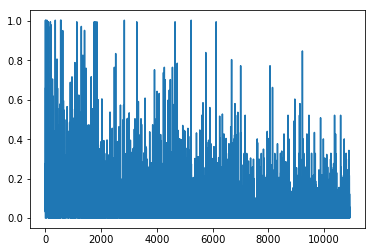

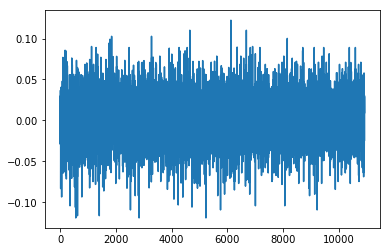

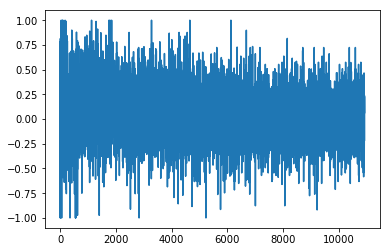

546
1.30560107327
[ 0.11111111  0.33333333  0.11111111  0.22222222  0.11111111  0.33333333
  0.33333333  0.11111111  0.11111111  0.33333333  0.11111111  0.11111111
  0.          0.33333333  0.33333333  0.22222222  0.11111111  0.11111111
  0.88888889  0.55555556  0.11111111  0.11111111  0.33333333  0.11111111
  0.          0.33333333  0.33333333  0.          0.11111111  0.55555556
  0.11111111  0.11111111  0.          0.77777778  0.          0.33333333
  0.55555556  0.66666667  0.66666667  0.11111111  0.          0.88888889
  0.11111111  0.11111111  0.33333333  0.11111111  0.11111111  0.33333333
  0.11111111  0.11111111  0.33333333  0.88888889  0.88888889  0.22222222
  0.33333333  0.55555556  0.88888889  0.66666667  0.33333333]
Writing away results
2000-07-01 00:00:00


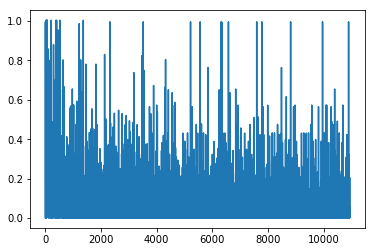

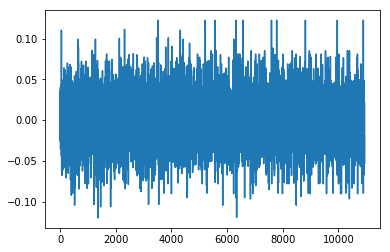

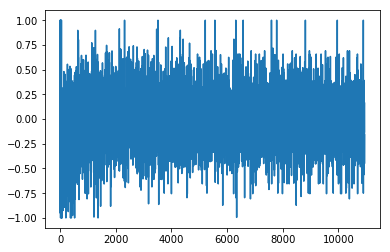

547
1.56438937522
[ 0.          0.22222222  0.55555556  0.22222222  0.          0.22222222
  0.          0.          0.          0.22222222  0.55555556  0.22222222
  0.          0.          0.88888889  0.55555556  0.          0.22222222
  0.44444444  0.          0.          0.          0.22222222  0.22222222
  0.22222222  0.          0.          0.          0.22222222  0.
  0.22222222  0.          0.22222222  0.          0.          0.
  0.66666667  0.11111111  0.33333333  0.55555556  0.22222222  0.
  0.22222222  0.          0.          0.          0.88888889  0.22222222
  0.          0.          0.44444444  0.55555556  0.33333333  0.88888889
  0.33333333  1.          0.77777778  0.          0.22222222]
Writing away results
2000-08-01 00:00:00


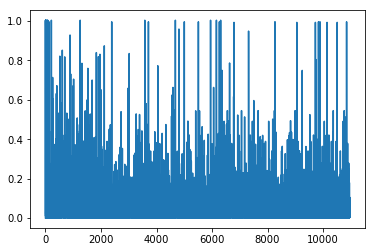

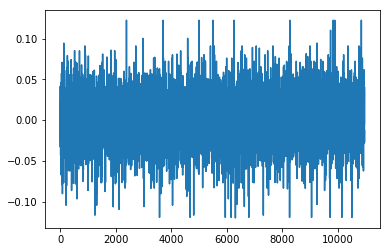

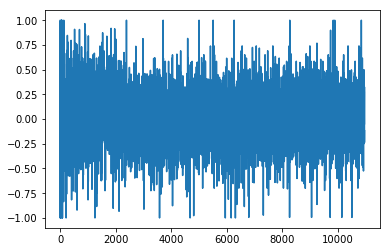

548
1.65511722429
[ 0.11111111  0.33333333  0.11111111  0.11111111  0.11111111  0.33333333
  0.11111111  0.11111111  0.          0.33333333  0.33333333  0.11111111
  0.11111111  1.          0.88888889  0.11111111  0.22222222  0.88888889
  0.33333333  0.11111111  0.          0.11111111  0.33333333  1.
  0.11111111  0.11111111  0.77777778  0.11111111  0.11111111  0.11111111
  0.55555556  0.44444444  0.11111111  0.11111111  0.11111111  0.55555556
  0.88888889  0.11111111  0.22222222  0.22222222  0.33333333  0.11111111
  0.          0.11111111  0.11111111  1.          0.44444444  0.11111111
  0.77777778  0.22222222  0.66666667  0.11111111  1.          0.
  0.33333333  0.22222222  0.11111111  0.11111111  0.33333333]
Writing away results
2000-09-01 00:00:00


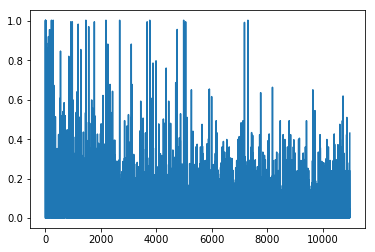

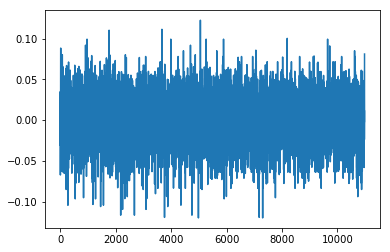

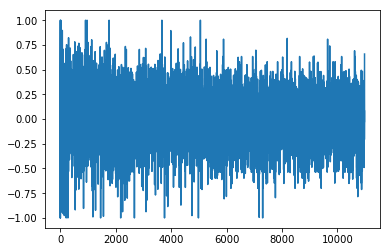

549
1.32498801231
[ 0.66666667  0.22222222  0.22222222  0.77777778  0.22222222  0.22222222
  0.77777778  0.77777778  0.88888889  0.22222222  0.22222222  0.22222222
  0.66666667  0.44444444  0.22222222  0.22222222  0.77777778  0.88888889
  0.22222222  0.22222222  0.77777778  0.66666667  0.22222222  0.88888889
  0.77777778  0.22222222  0.77777778  0.22222222  0.22222222  0.77777778
  0.33333333  0.22222222  0.22222222  0.22222222  0.66666667  0.55555556
  0.88888889  0.77777778  0.77777778  0.88888889  0.22222222  0.77777778
  0.88888889  0.88888889  0.22222222  0.77777778  0.66666667  0.22222222
  0.77777778  0.11111111  0.66666667  0.22222222  0.77777778  0.66666667
  0.55555556  0.22222222  0.77777778  0.77777778  0.22222222]
Writing away results
2000-10-01 00:00:00


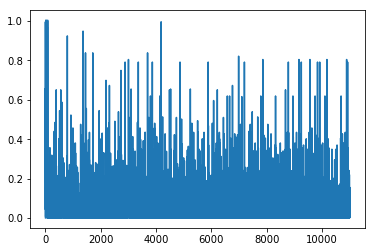

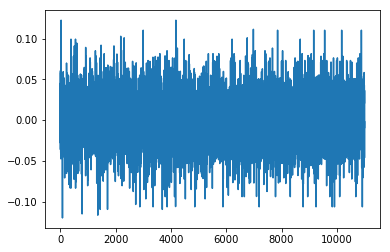

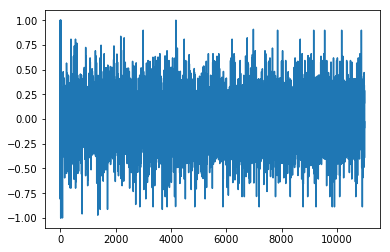

550
1.13912782887
[ 0.55555556  0.88888889  0.33333333  0.55555556  0.55555556  0.33333333
  1.          0.22222222  0.55555556  0.88888889  0.33333333  0.11111111
  0.22222222  1.          0.33333333  0.44444444  0.22222222  0.55555556
  0.88888889  0.66666667  0.55555556  1.          0.33333333  0.55555556
  0.33333333  0.44444444  0.55555556  1.          0.33333333  0.
  0.55555556  0.55555556  0.88888889  0.11111111  0.22222222  0.66666667
  1.          0.88888889  0.33333333  0.55555556  0.88888889  0.88888889
  0.55555556  0.11111111  0.88888889  0.22222222  0.55555556  1.          0.
  0.22222222  1.          0.88888889  0.          0.          0.88888889
  0.33333333  0.55555556  1.          0.33333333]
Writing away results
2000-11-01 00:00:00


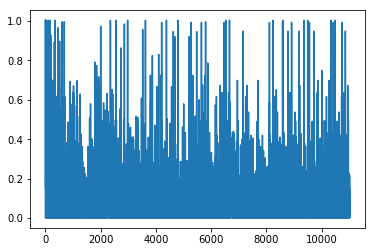

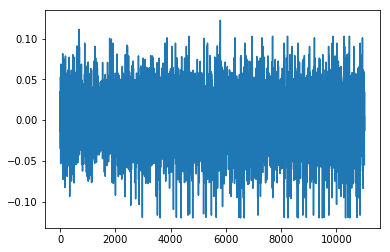

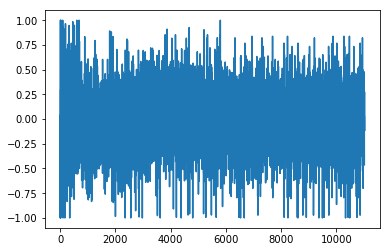

551
1.27356199313
[ 0.11111111  0.77777778  0.44444444  0.11111111  0.11111111  0.11111111
  0.55555556  0.66666667  0.11111111  0.11111111  0.55555556  0.88888889
  0.11111111  0.11111111  0.22222222  0.55555556  0.11111111  0.11111111
  0.77777778  0.33333333  0.11111111  0.11111111  0.77777778  0.11111111
  0.11111111  0.11111111  0.11111111  0.77777778  0.55555556  0.44444444
  0.11111111  0.11111111  0.22222222  0.88888889  0.11111111  0.77777778
  0.66666667  0.55555556  0.11111111  0.11111111  0.11111111  0.77777778
  0.77777778  0.11111111  0.44444444  0.11111111  0.77777778  0.55555556
  0.          0.11111111  1.          0.55555556  0.          0.11111111
  0.77777778  0.77777778  0.11111111  0.11111111  0.11111111]
Writing away results
2000-12-01 00:00:00


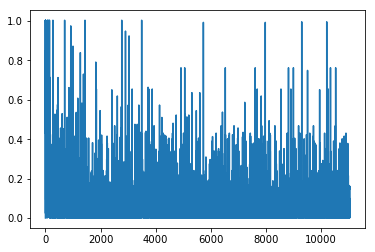

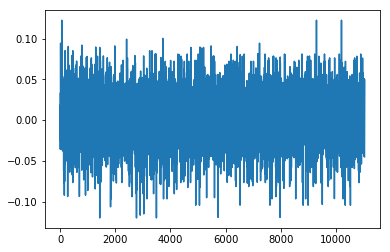

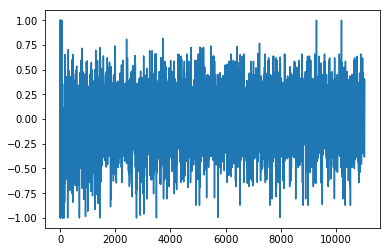

552
1.14216777329
[ 0.88888889  0.          0.66666667  0.11111111  0.88888889  0.          0.
  0.88888889  0.88888889  0.33333333  0.55555556  0.88888889  0.44444444
  1.          0.33333333  0.66666667  0.88888889  0.11111111  0.
  0.88888889  0.88888889  0.88888889  0.33333333  0.88888889  0.33333333
  0.88888889  0.11111111  0.          0.88888889  0.88888889  0.88888889
  0.77777778  0.77777778  0.11111111  0.11111111  0.          0.
  0.66666667  0.88888889  0.11111111  0.11111111  0.44444444  0.
  0.11111111  0.88888889  0.88888889  0.77777778  0.66666667  0.44444444
  0.88888889  0.33333333  0.44444444  0.88888889  0.11111111  0.55555556
  0.33333333  0.11111111  1.          0.44444444]
Writing away results
2001-01-01 00:00:00


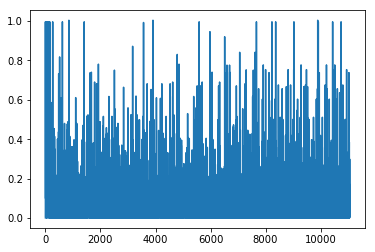

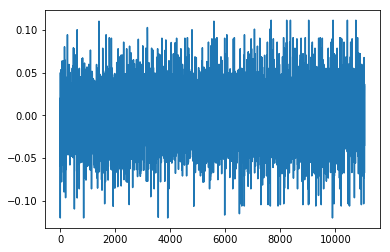

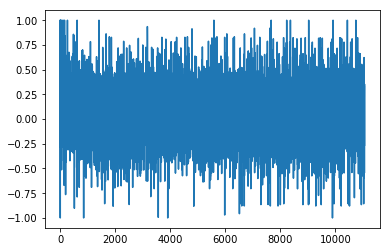

553
1.3463734832
[ 0.          0.          0.          0.          0.          0.          0.
  0.          0.88888889  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.66666667
  0.          0.          0.          0.55555556  0.88888889  0.
  0.11111111  0.          0.          0.          0.          0.          0.
  0.11111111  0.          0.          0.          0.11111111  0.55555556
  0.66666667  0.11111111  0.44444444  0.55555556  0.88888889  0.          0.
  0.          0.44444444  0.          0.          0.11111111  0.        ]
Writing away results
2001-02-01 00:00:00


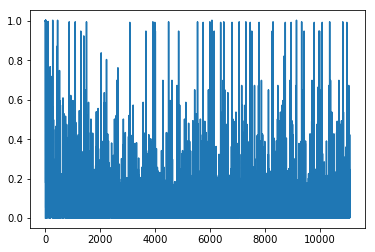

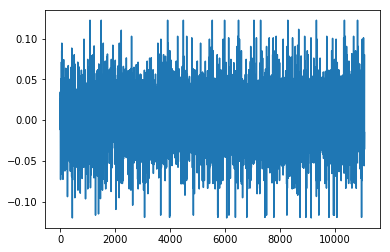

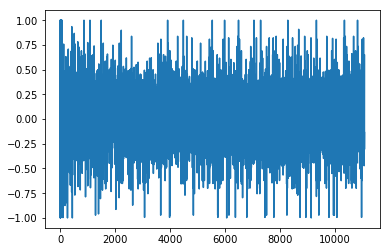

554
1.48713077744
[ 0.88888889  0.11111111  0.11111111  0.11111111  0.          0.          0.
  1.          0.11111111  0.          0.88888889  0.          0.88888889
  0.22222222  0.11111111  0.44444444  0.11111111  0.66666667  0.          0.
  0.22222222  0.          0.11111111  0.33333333  0.11111111  0.44444444
  0.          0.          0.88888889  1.          1.          0.
  0.88888889  0.          0.          0.22222222  0.          0.          0.
  1.          0.11111111  0.          0.22222222  1.          0.11111111
  0.88888889  0.11111111  0.44444444  0.44444444  0.33333333  0.22222222
  0.44444444  0.11111111  1.          0.11111111  0.          1.          0.
  1.        ]
Writing away results
2001-03-01 00:00:00


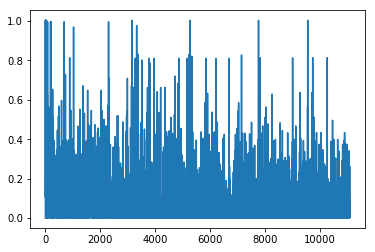

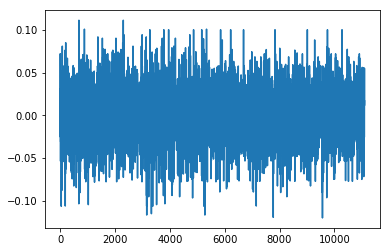

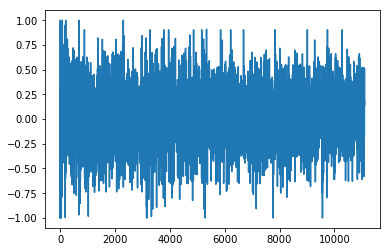

555
1.39046976165
[ 0.11111111  0.11111111  0.11111111  0.          0.11111111  0.11111111
  0.77777778  0.22222222  0.11111111  0.11111111  0.22222222  0.11111111
  0.11111111  0.11111111  0.11111111  0.55555556  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.          0.11111111  0.11111111  0.11111111  0.77777778  0.77777778
  0.11111111  1.          0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  1.          0.22222222  0.77777778  0.11111111  0.          0.22222222
  0.66666667  0.11111111  0.11111111  0.11111111  0.88888889  0.11111111
  0.11111111  0.66666667  0.11111111  0.11111111  0.44444444]
Writing away results
2001-04-01 00:00:00


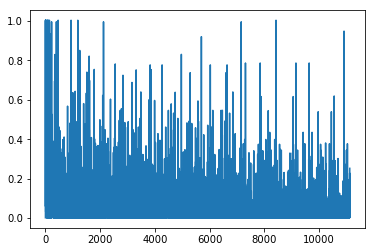

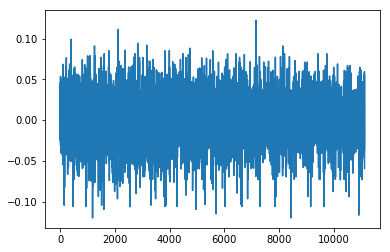

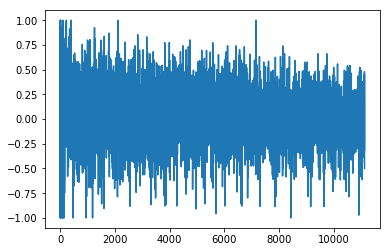

556
1.27192458725
[ 0.33333333  0.44444444  0.11111111  0.11111111  0.22222222  0.55555556
  0.33333333  0.88888889  0.66666667  0.22222222  0.11111111  0.11111111
  0.11111111  0.33333333  0.88888889  0.11111111  0.11111111  0.22222222
  0.11111111  0.22222222  0.22222222  1.          0.22222222  0.44444444
  0.11111111  0.11111111  0.22222222  0.55555556  0.44444444  0.33333333
  0.66666667  0.22222222  0.22222222  0.11111111  0.11111111  0.22222222
  0.88888889  1.          0.22222222  0.33333333  0.11111111  0.
  0.77777778  0.44444444  1.          0.          0.55555556  0.44444444
  0.11111111  0.88888889  0.22222222  0.44444444  0.11111111  0.11111111
  0.55555556  0.11111111  0.          0.22222222  0.44444444]
Writing away results
2001-05-01 00:00:00


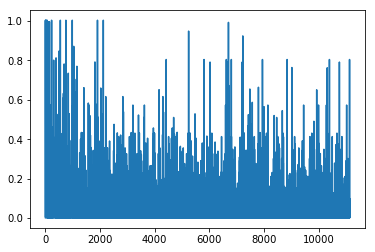

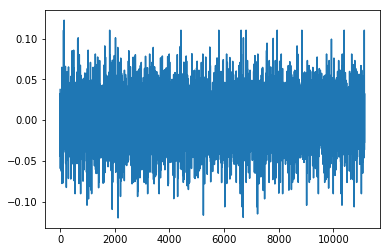

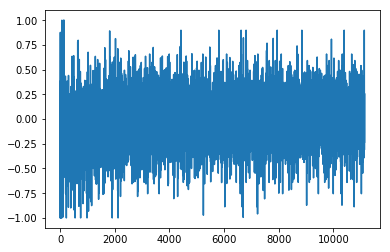

557
1.20214470148
[ 0.11111111  0.88888889  0.11111111  0.11111111  0.          0.88888889
  0.11111111  0.22222222  0.44444444  0.88888889  0.88888889  0.11111111
  0.11111111  0.77777778  1.          0.11111111  0.11111111  0.33333333
  0.88888889  0.11111111  0.22222222  0.11111111  1.          0.11111111
  1.          0.11111111  0.          0.          0.88888889  0.22222222
  0.44444444  1.          0.11111111  0.11111111  0.11111111  0.88888889
  0.44444444  0.11111111  0.11111111  0.22222222  0.44444444  0.66666667
  0.88888889  1.          0.66666667  0.66666667  0.77777778  0.33333333
  0.11111111  0.44444444  1.          0.11111111  0.44444444  0.55555556
  0.11111111  0.33333333  0.66666667  1.          0.55555556]
Writing away results
2001-06-01 00:00:00


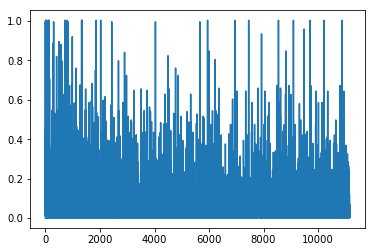

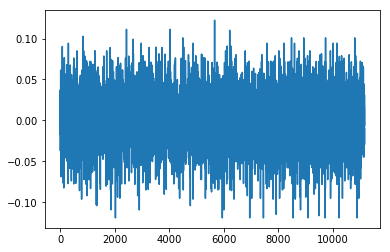

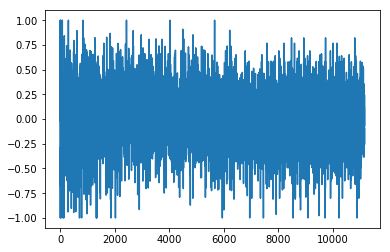

558
1.08716021928
[ 0.55555556  0.55555556  0.55555556  1.          0.55555556  0.55555556
  0.77777778  0.11111111  0.55555556  0.77777778  0.88888889  0.44444444
  0.88888889  0.55555556  0.55555556  0.77777778  0.77777778  0.55555556
  0.88888889  0.77777778  0.11111111  0.44444444  0.55555556  0.55555556
  0.55555556  1.          1.          0.55555556  0.11111111  0.11111111
  0.55555556  0.77777778  0.88888889  0.55555556  0.77777778  0.11111111
  0.55555556  0.33333333  0.55555556  0.11111111  0.          0.33333333
  0.88888889  0.44444444  0.66666667  1.          0.55555556  0.77777778
  0.11111111  0.44444444  0.55555556  0.66666667  0.44444444  0.55555556
  0.33333333  0.11111111  0.22222222  0.55555556  1.        ]
Writing away results
2001-07-01 00:00:00


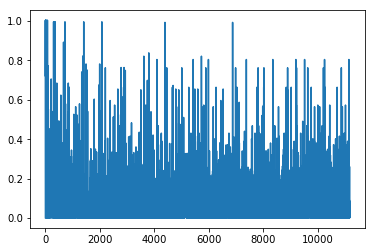

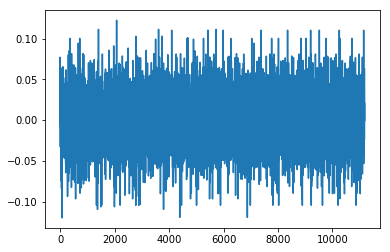

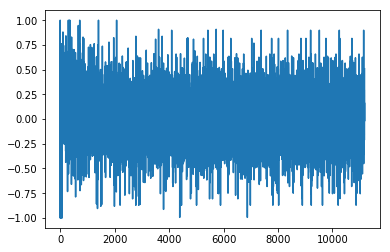

559
0.914801243808
[ 0.33333333  0.88888889  0.33333333  1.          1.          0.22222222
  0.44444444  1.          0.33333333  1.          0.88888889  0.44444444
  0.33333333  0.88888889  0.88888889  0.33333333  0.88888889  1.
  0.33333333  0.44444444  0.44444444  0.88888889  0.88888889  0.88888889
  0.77777778  0.77777778  1.          0.33333333  0.66666667  0.44444444
  0.33333333  0.88888889  0.88888889  0.88888889  0.33333333  0.88888889
  0.88888889  0.33333333  0.66666667  0.44444444  0.33333333  1.
  0.88888889  0.77777778  0.77777778  1.          0.88888889  0.44444444
  0.33333333  0.88888889  0.33333333  0.22222222  0.88888889  0.33333333
  0.55555556  0.          0.11111111  0.77777778  0.77777778]
Writing away results
2001-08-01 00:00:00


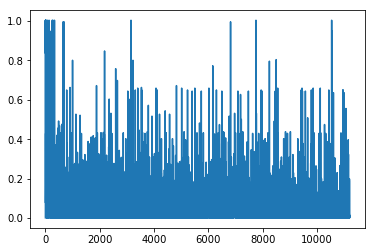

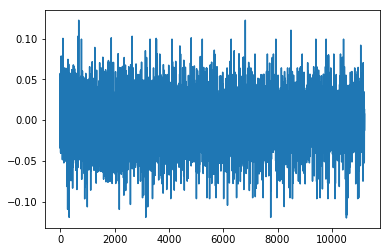

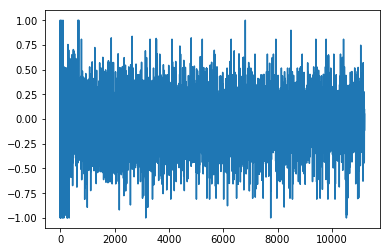

560
1.14805887329
[ 0.33333333  0.11111111  0.88888889  0.44444444  0.77777778  1.
  0.88888889  0.33333333  0.33333333  0.55555556  0.66666667  0.33333333
  0.33333333  0.33333333  0.11111111  0.33333333  0.44444444  0.88888889
  0.77777778  0.11111111  0.33333333  0.33333333  0.          0.22222222
  1.          0.44444444  0.77777778  0.33333333  0.88888889  0.66666667
  0.33333333  0.33333333  0.33333333  0.11111111  0.66666667  0.44444444
  0.33333333  0.77777778  0.55555556  0.22222222  0.33333333  0.88888889
  0.22222222  1.          0.          0.55555556  0.77777778  0.88888889
  0.88888889  0.88888889  0.11111111  0.33333333  0.11111111  0.66666667
  0.55555556  0.44444444  0.77777778  0.11111111  0.22222222]
Writing away results
2001-09-01 00:00:00


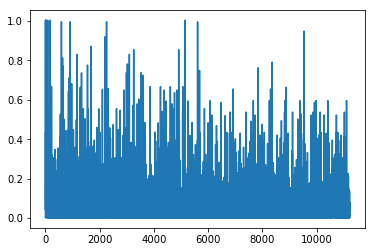

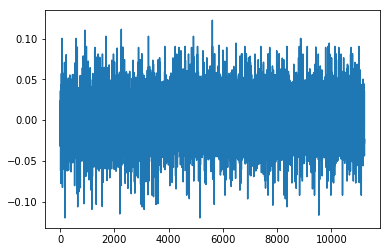

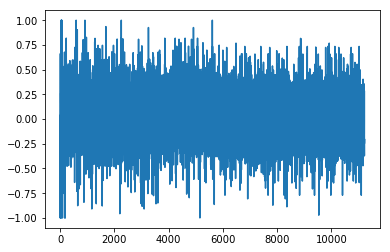

561
1.14602303861
[ 0.11111111  0.77777778  0.44444444  0.          1.          0.55555556
  0.33333333  1.          0.44444444  1.          0.33333333  0.22222222
  0.33333333  0.55555556  0.22222222  0.55555556  0.44444444  0.33333333
  0.77777778  0.33333333  1.          0.22222222  0.11111111  0.77777778
  0.55555556  0.66666667  1.          0.55555556  0.33333333  1.
  0.22222222  0.33333333  0.33333333  1.          0.44444444  0.
  0.33333333  0.77777778  0.22222222  0.66666667  0.22222222  0.44444444
  0.66666667  0.55555556  0.44444444  1.          0.55555556  0.33333333
  0.55555556  0.44444444  0.33333333  0.44444444  1.          0.77777778
  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667]
Writing away results
2001-10-01 00:00:00


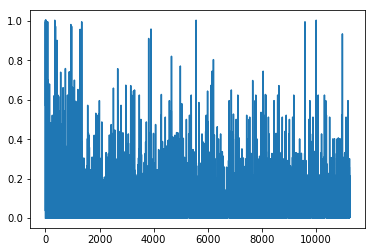

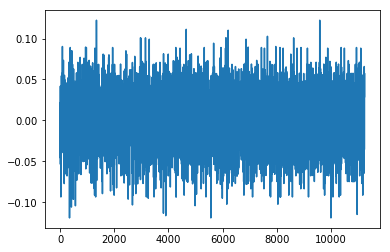

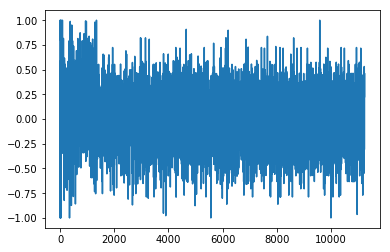

562
0.980690384636
[ 0.88888889  0.77777778  0.55555556  0.33333333  0.77777778  0.77777778
  0.88888889  0.77777778  0.44444444  0.33333333  0.77777778  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.44444444  0.33333333
  0.77777778  0.          0.77777778  0.11111111  0.66666667  0.22222222
  1.          0.33333333  0.77777778  0.77777778  0.88888889  0.77777778
  0.77777778  0.77777778  0.33333333  0.77777778  0.55555556  0.
  0.44444444  0.11111111  0.88888889  0.88888889  0.44444444  0.66666667
  0.77777778  0.77777778  0.44444444  0.33333333  0.77777778  0.44444444
  0.55555556  0.77777778  0.77777778  0.88888889  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2001-11-01 00:00:00


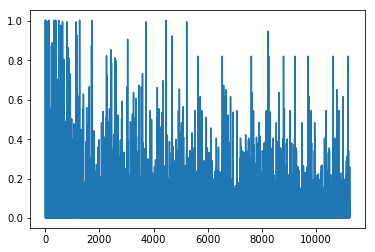

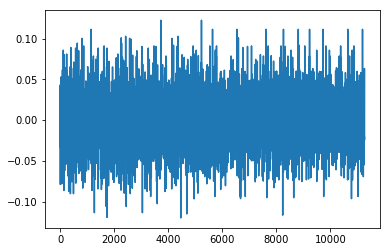

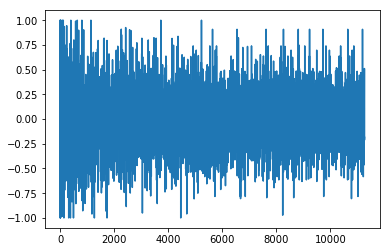

563
1.17272833859
[ 0.33333333  0.33333333  0.55555556  0.          0.55555556  0.          0.
  1.          0.44444444  0.33333333  0.55555556  0.55555556  0.55555556
  0.          0.44444444  0.          0.          0.11111111  0.55555556
  0.55555556  0.22222222  0.88888889  0.33333333  0.          0.          0.
  0.55555556  0.55555556  0.          0.          0.44444444  0.55555556
  0.          0.33333333  0.44444444  0.          0.22222222  0.33333333
  0.33333333  0.88888889  0.22222222  0.77777778  0.55555556  0.
  0.77777778  0.          0.          0.44444444  0.55555556  0.44444444
  0.22222222  0.66666667  0.33333333  0.44444444  0.88888889  0.66666667
  0.66666667  0.66666667  0.33333333]
Writing away results
2001-12-01 00:00:00


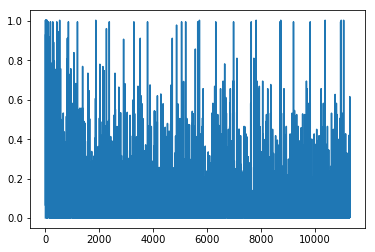

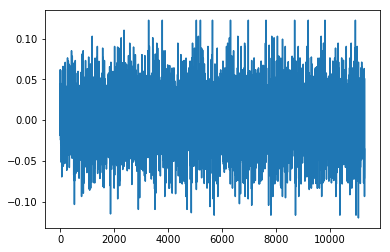

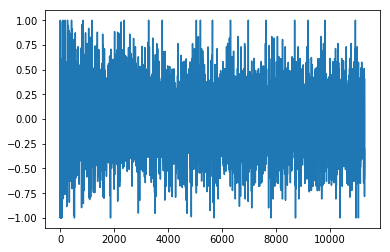

564
1.19713759597
[ 0.88888889  0.88888889  0.77777778  0.77777778  0.88888889  0.55555556
  0.          0.88888889  0.22222222  0.77777778  0.77777778  0.77777778
  0.77777778  0.88888889  0.44444444  0.          0.22222222  0.88888889
  0.22222222  0.          1.          0.66666667  0.55555556  0.88888889
  0.77777778  0.77777778  0.88888889  0.55555556  0.77777778  0.88888889
  0.77777778  0.55555556  0.88888889  0.88888889  0.          1.
  0.88888889  0.55555556  0.66666667  0.88888889  0.22222222  0.77777778
  0.44444444  0.11111111  0.55555556  0.55555556  0.88888889  0.44444444
  0.          0.44444444  0.11111111  0.66666667  0.44444444  0.          1.
  1.          0.66666667  0.55555556  1.        ]
Writing away results
2002-01-01 00:00:00


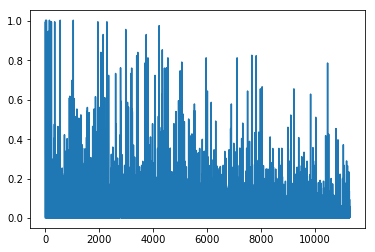

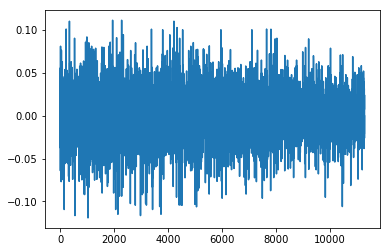

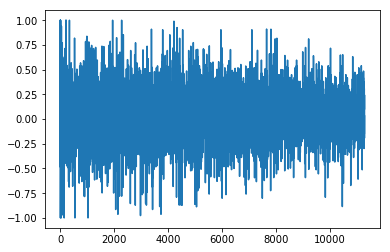

565
1.20522447199
[ 0.11111111  0.          0.55555556  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.44444444  0.          0.11111111  0.
  0.22222222  0.33333333  0.          0.44444444  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.          0.          0.66666667  0.33333333  0.          0.66666667
  0.66666667  0.77777778  0.22222222  0.11111111  0.11111111  0.11111111
  0.44444444  0.11111111  0.          0.22222222  0.11111111  0.22222222
  0.11111111  0.22222222  0.77777778  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222]
Writing away results
2002-02-01 00:00:00


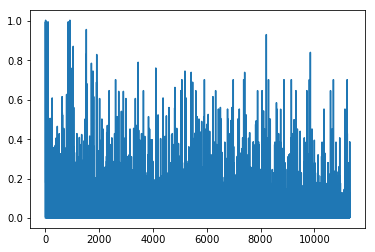

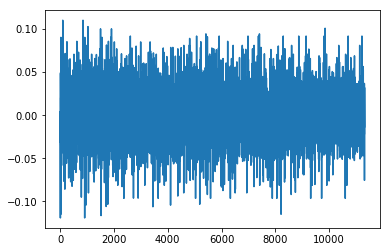

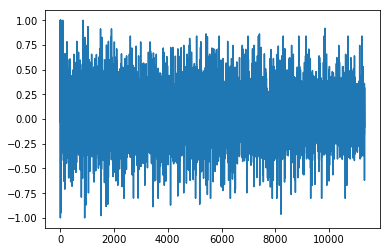

566
1.10439666577
[ 0.33333333  0.33333333  0.33333333  0.33333333  1.          0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.11111111  0.33333333  0.33333333  0.33333333  0.33333333  0.55555556
  0.77777778  0.33333333  0.55555556  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.44444444  0.33333333  0.33333333
  0.33333333  0.66666667  0.33333333  0.44444444  0.44444444  0.33333333
  0.          0.44444444  0.33333333  0.33333333  0.11111111  0.33333333
  0.33333333  0.33333333  0.44444444  0.11111111  0.66666667  0.
  0.11111111  0.33333333  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.55555556  0.44444444  0.11111111  0.77777778]
Writing away results
2002-03-01 00:00:00


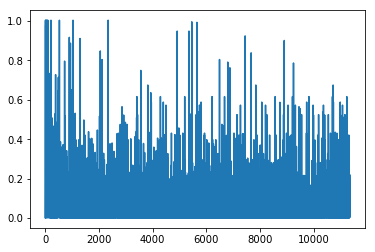

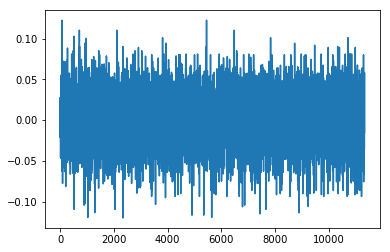

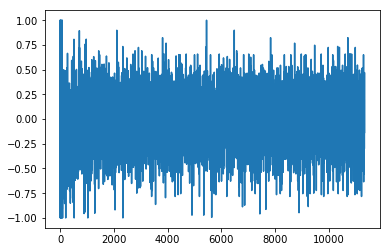

567
1.16513212138
[ 0.77777778  0.77777778  0.33333333  0.22222222  0.44444444  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.44444444  1.
  0.22222222  0.77777778  0.77777778  0.77777778  0.66666667  0.55555556
  0.44444444  0.66666667  1.          0.33333333  0.77777778  0.77777778
  0.77777778  0.77777778  0.66666667  0.77777778  0.77777778  0.44444444
  0.66666667  1.          0.22222222  0.55555556  0.44444444  0.66666667
  0.55555556  0.33333333  0.77777778  0.22222222  0.33333333  0.77777778
  0.          0.66666667  0.77777778  0.66666667  0.55555556  0.66666667
  0.66666667  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667
  0.66666667  0.66666667  0.88888889  0.66666667  0.55555556]
Writing away results
2002-04-01 00:00:00


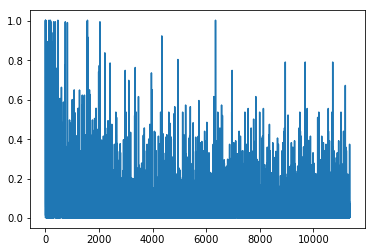

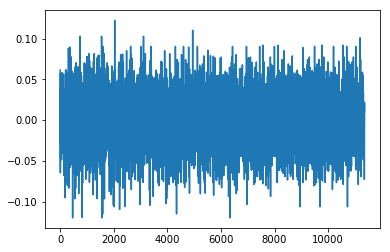

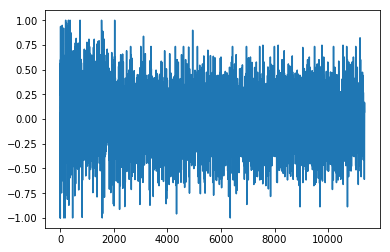

568
0.97047836263
[ 0.66666667  0.          1.          0.55555556  0.66666667  0.44444444
  0.55555556  0.          1.          0.          1.          0.77777778
  0.44444444  0.44444444  0.55555556  0.11111111  0.          0.66666667
  0.33333333  0.66666667  0.77777778  0.44444444  0.66666667  1.
  0.44444444  0.55555556  0.          0.33333333  0.44444444  0.55555556
  0.          0.77777778  0.66666667  0.66666667  0.88888889  0.44444444
  0.66666667  0.11111111  1.          0.88888889  1.          0.33333333
  0.88888889  0.66666667  0.88888889  0.11111111  0.33333333  0.88888889
  0.33333333  0.          0.11111111  0.88888889  0.66666667  0.33333333
  0.11111111  0.66666667  0.77777778  0.44444444  0.66666667]
Writing away results
2002-05-01 00:00:00


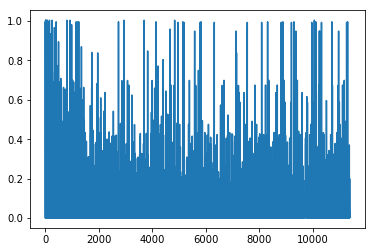

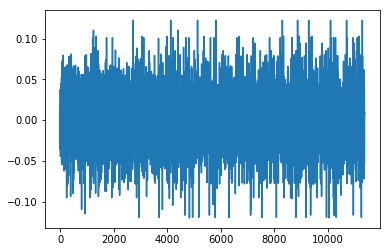

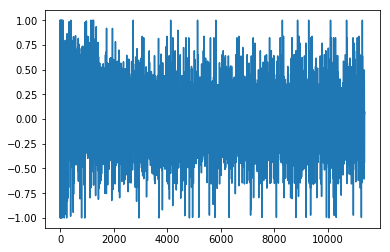

569
1.36688080898
[ 0.          0.11111111  0.44444444  0.33333333  0.          0.22222222
  0.33333333  0.33333333  0.77777778  0.33333333  0.88888889  0.
  0.33333333  0.33333333  1.          0.66666667  0.          0.11111111
  0.11111111  0.          0.          0.33333333  0.33333333  0.
  0.44444444  0.33333333  0.33333333  0.          0.66666667  0.55555556
  1.          0.66666667  0.33333333  1.          1.          0.33333333
  0.          0.11111111  0.44444444  0.          0.44444444  1.
  0.33333333  1.          0.66666667  0.55555556  0.          0.44444444
  1.          1.          1.          0.66666667  1.          1.          1.
  1.          1.          1.          1.        ]
Writing away results
2002-06-01 00:00:00


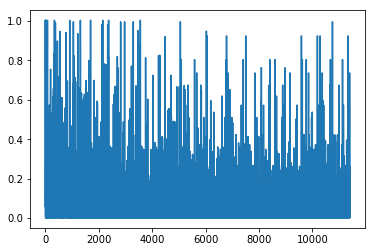

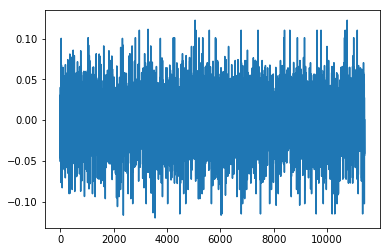

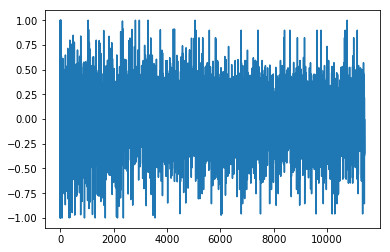

570
0.835423178446
[ 0.11111111  0.33333333  0.88888889  0.88888889  0.88888889  0.55555556
  1.          0.55555556  0.33333333  0.33333333  0.11111111  0.33333333
  0.88888889  1.          0.22222222  0.44444444  0.66666667  0.55555556
  0.88888889  0.11111111  0.          0.33333333  0.11111111  0.55555556
  0.33333333  0.          0.11111111  0.33333333  0.88888889  0.22222222
  0.11111111  0.33333333  1.          0.55555556  0.33333333  0.55555556
  0.88888889  0.55555556  0.11111111  0.33333333  0.55555556  0.33333333
  1.          0.55555556  0.44444444  0.11111111  0.66666667  0.55555556
  0.66666667  0.          0.44444444  1.          0.66666667  0.44444444
  1.          0.11111111  0.33333333  0.66666667  0.22222222]
Writing away results
2002-07-01 00:00:00


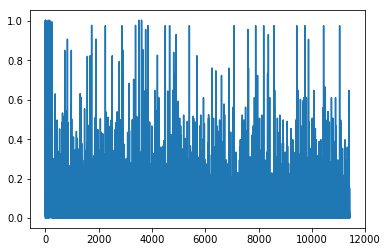

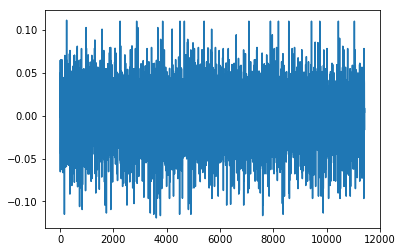

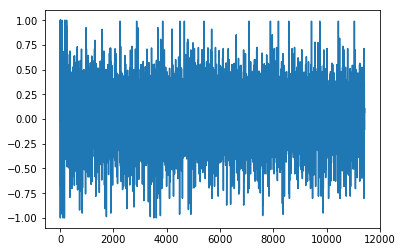

571
0.924696119082
[ 0.11111111  0.55555556  0.55555556  0.33333333  0.55555556  0.55555556
  0.88888889  0.55555556  0.77777778  0.88888889  1.          0.88888889
  0.66666667  0.66666667  0.11111111  0.          0.44444444  0.55555556
  0.88888889  0.55555556  0.55555556  0.88888889  0.77777778  0.55555556
  0.55555556  0.22222222  0.66666667  0.33333333  0.77777778  0.22222222
  0.55555556  0.          0.          0.55555556  0.88888889  1.
  0.11111111  0.55555556  0.77777778  0.          0.55555556  0.88888889
  0.55555556  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.66666667  0.22222222  0.          0.
  0.33333333  0.77777778  0.11111111]
Writing away results
2002-08-01 00:00:00


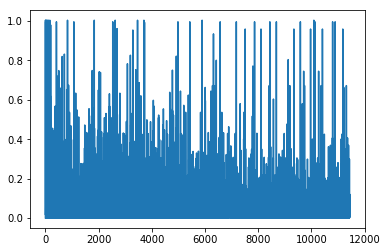

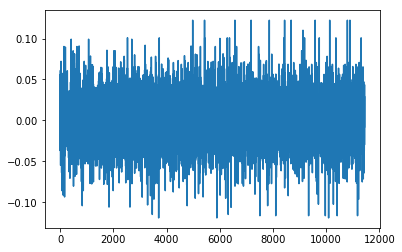

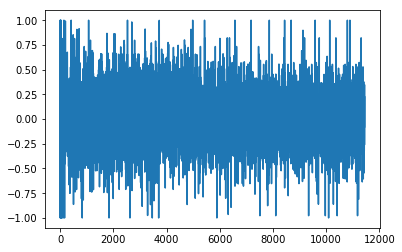

572
1.14618592916
[ 0.22222222  0.44444444  0.22222222  0.44444444  0.44444444  0.55555556
  0.44444444  0.11111111  0.55555556  0.22222222  0.22222222  0.88888889
  1.          0.33333333  0.44444444  0.44444444  0.22222222  0.22222222
  0.44444444  0.44444444  0.44444444  0.77777778  0.44444444  0.44444444
  0.22222222  0.44444444  0.11111111  1.          0.77777778  0.22222222
  0.66666667  0.33333333  0.22222222  0.22222222  0.44444444  0.22222222
  0.44444444  0.77777778  0.66666667  0.44444444  0.66666667  0.88888889
  1.          0.55555556  0.44444444  0.66666667  1.          1.
  0.33333333  0.66666667  0.66666667  1.          1.          0.          1.
  0.11111111  1.          0.22222222  0.11111111]
Writing away results
2002-09-01 00:00:00


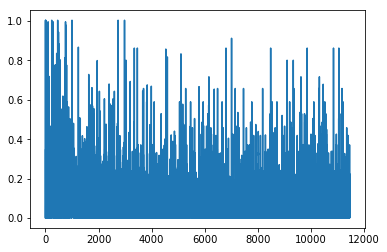

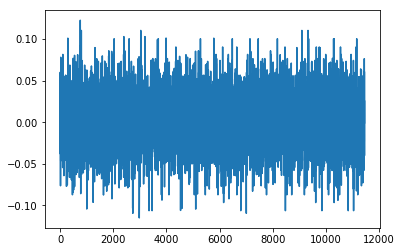

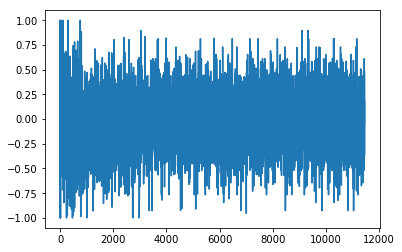

573
0.951949109822
[ 0.44444444  1.          0.44444444  0.22222222  1.          0.11111111
  0.77777778  0.22222222  0.88888889  0.44444444  0.44444444  0.33333333
  0.33333333  1.          0.55555556  0.22222222  1.          1.
  0.22222222  0.44444444  0.88888889  0.11111111  0.22222222  0.
  0.88888889  0.77777778  0.22222222  1.          0.44444444  0.11111111
  0.55555556  1.          0.22222222  0.33333333  1.          0.44444444
  0.88888889  0.88888889  0.44444444  0.88888889  0.55555556  0.33333333
  0.77777778  0.88888889  0.77777778  0.66666667  0.77777778  0.66666667
  0.77777778  0.55555556  0.77777778  0.          0.          0.77777778
  0.77777778  0.33333333  1.          0.44444444  0.11111111]
Writing away results
2002-10-01 00:00:00


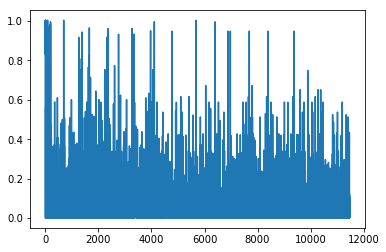

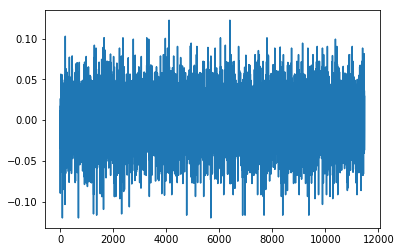

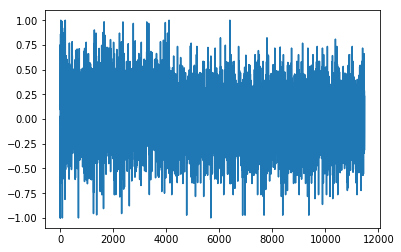

574
0.847231477771
[ 0.77777778  0.77777778  0.77777778  0.77777778  0.44444444  0.11111111
  0.55555556  0.77777778  0.77777778  0.33333333  0.33333333  0.77777778
  0.88888889  1.          0.11111111  0.77777778  0.77777778  0.77777778
  0.77777778  0.55555556  0.77777778  0.11111111  0.77777778  1.
  0.66666667  0.11111111  0.55555556  0.          0.88888889  1.
  0.77777778  0.77777778  0.44444444  0.55555556  0.77777778  0.55555556
  0.33333333  0.44444444  0.33333333  0.77777778  1.          0.66666667
  1.          0.33333333  1.          0.33333333  1.          0.22222222
  0.33333333  1.          0.33333333  0.22222222  1.          0.33333333
  0.44444444  0.          0.11111111  0.33333333  1.        ]
Writing away results
2002-11-01 00:00:00


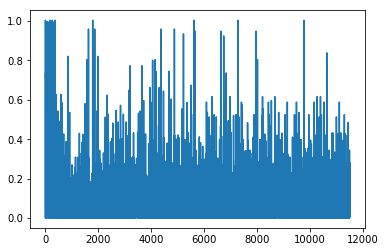

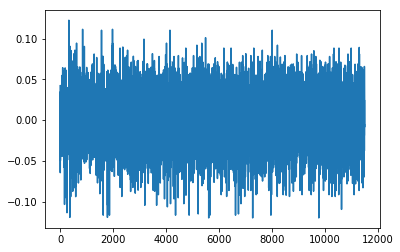

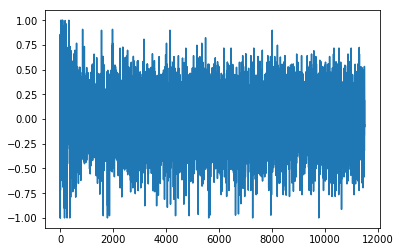

575
0.780793119089
[ 0.77777778  0.77777778  0.22222222  0.77777778  0.66666667  0.88888889
  0.77777778  0.77777778  0.88888889  0.66666667  0.11111111  0.44444444
  0.88888889  0.77777778  0.88888889  0.77777778  0.77777778  0.88888889
  0.77777778  0.33333333  0.77777778  0.88888889  0.77777778  0.66666667
  0.11111111  0.77777778  0.77777778  0.66666667  0.11111111  0.77777778
  0.77777778  0.88888889  0.22222222  0.88888889  0.77777778  0.66666667
  0.77777778  0.77777778  0.33333333  0.55555556  0.66666667  1.
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.55555556  0.33333333  0.66666667  0.66666667  1.
  0.55555556  0.77777778  0.66666667  0.66666667  0.66666667]
Writing away results
2002-12-01 00:00:00


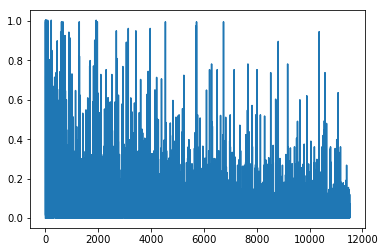

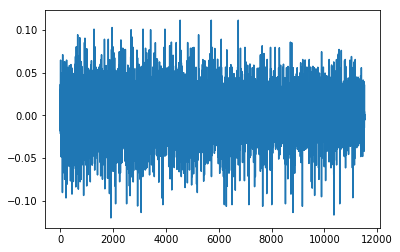

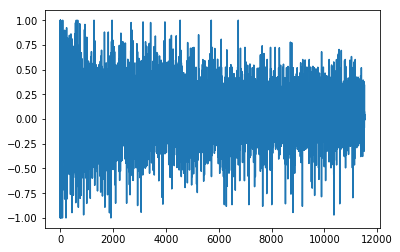

576
0.96978458563
[ 0.22222222  0.22222222  0.          0.44444444  0.          0.
  0.22222222  0.33333333  0.33333333  0.55555556  0.88888889  0.
  0.22222222  0.22222222  0.          0.22222222  0.          0.77777778
  0.          0.22222222  0.22222222  0.44444444  0.33333333  1.
  0.77777778  0.22222222  0.33333333  0.33333333  0.22222222  0.22222222
  0.          0.77777778  0.22222222  1.          0.33333333  0.
  0.77777778  0.          1.          0.33333333  1.          0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.44444444  0.33333333  0.33333333  0.33333333  1.          0.55555556
  0.22222222  0.33333333  0.33333333  0.33333333  0.33333333]
Writing away results
2003-01-01 00:00:00


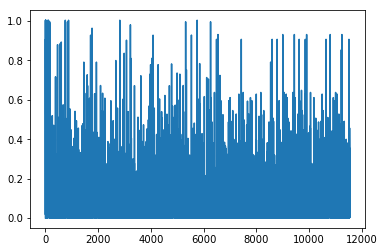

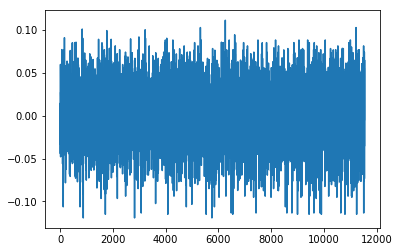

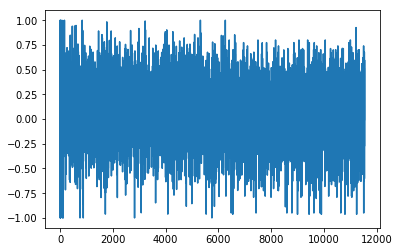

577
0.928662032858
[ 0.88888889  1.          0.22222222  1.          1.          0.77777778
  0.44444444  0.44444444  0.11111111  1.          1.          0.11111111
  1.          1.          0.77777778  1.          0.66666667  0.88888889
  0.11111111  0.77777778  1.          0.11111111  0.44444444  1.
  0.88888889  0.44444444  0.44444444  1.          0.77777778  1.
  0.66666667  1.          0.77777778  0.22222222  1.          0.44444444
  1.          0.44444444  0.11111111  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  1.          0.44444444  0.44444444  0.44444444  0.33333333  0.22222222
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444]
Writing away results
2003-02-01 00:00:00


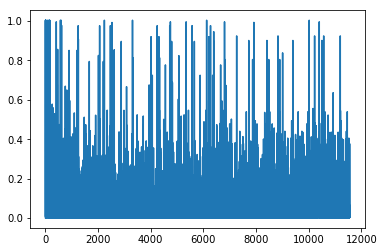

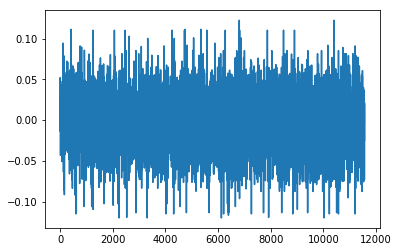

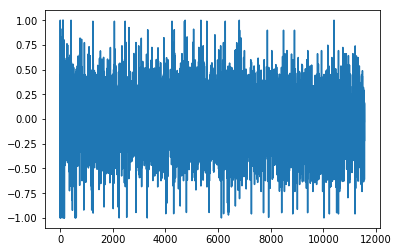

578
0.872823309679
[ 0.77777778  0.22222222  0.55555556  1.          0.77777778  0.77777778
  0.22222222  0.55555556  0.33333333  0.22222222  0.55555556  1.
  0.55555556  0.55555556  0.77777778  0.77777778  0.44444444  0.55555556
  1.          0.77777778  0.44444444  0.          0.33333333  0.44444444
  0.77777778  0.22222222  1.          0.77777778  0.77777778  0.33333333
  0.55555556  0.55555556  0.22222222  0.55555556  0.77777778  0.88888889
  0.44444444  0.22222222  0.77777778  0.22222222  0.          0.22222222
  0.22222222  0.77777778  0.22222222  0.22222222  0.66666667  0.77777778
  0.22222222  0.          0.88888889  0.33333333  0.          0.22222222
  0.22222222  0.33333333  0.22222222  0.22222222  0.22222222]
Writing away results
2003-03-01 00:00:00


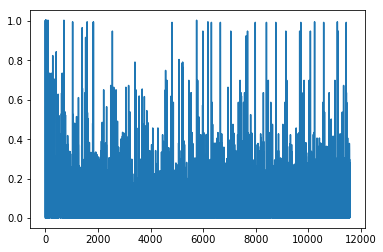

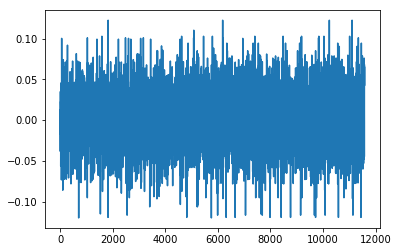

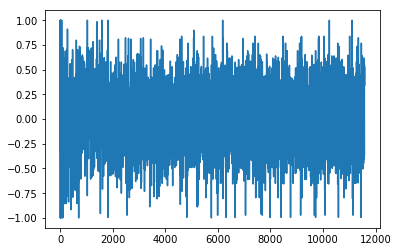

579
1.04916641744
[ 1.          0.11111111  0.77777778  0.44444444  0.55555556  1.
  0.11111111  0.33333333  0.          0.77777778  0.55555556  0.88888889
  0.77777778  0.44444444  0.55555556  0.88888889  0.11111111  0.22222222
  0.          1.          0.55555556  0.22222222  0.          0.33333333
  1.          0.77777778  0.44444444  0.44444444  0.77777778  0.44444444
  0.66666667  0.77777778  0.44444444  0.77777778  0.88888889  0.77777778
  1.          0.          1.          0.          1.          1.
  0.77777778  1.          1.          0.11111111  0.22222222  1.
  0.11111111  0.33333333  1.          0.77777778  0.33333333  1.          1.
  1.          1.          1.          1.        ]
Writing away results
2003-04-01 00:00:00


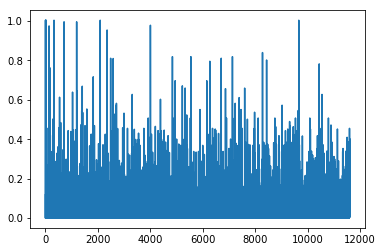

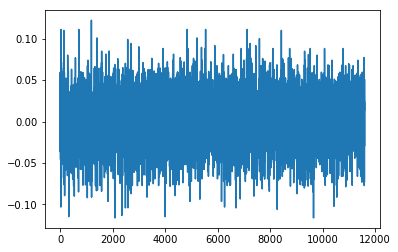

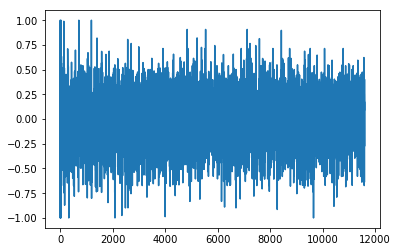

580
0.795226867375
[ 0.88888889  0.          1.          1.          0.22222222  0.22222222
  0.88888889  0.55555556  0.          0.55555556  0.55555556  0.
  0.88888889  0.55555556  1.          0.          0.88888889  0.55555556
  1.          0.11111111  1.          0.88888889  0.44444444  0.66666667
  0.          1.          0.88888889  0.55555556  0.55555556  0.
  0.33333333  0.88888889  0.          1.          0.11111111  0.33333333
  0.11111111  1.          0.33333333  0.66666667  0.22222222  0.11111111
  0.66666667  0.66666667  0.33333333  0.88888889  0.22222222  0.33333333
  0.11111111  0.77777778  0.33333333  0.66666667  0.66666667  0.11111111
  0.66666667  0.11111111  0.33333333  0.11111111  0.66666667]
Writing away results
2003-05-01 00:00:00


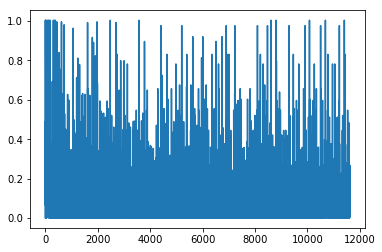

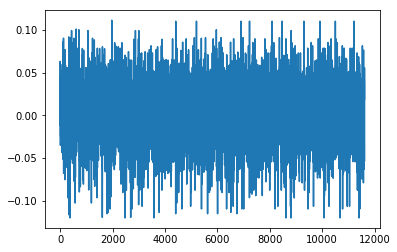

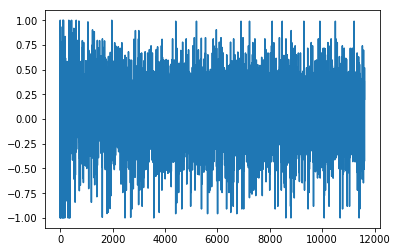

581
0.921864418618
[ 0.          0.          0.88888889  0.44444444  1.          1.          0.
  0.          1.          0.          1.          1.          0.55555556
  0.          1.          1.          0.44444444  0.          0.66666667
  0.22222222  0.          0.88888889  0.33333333  0.          0.
  0.11111111  0.44444444  1.          0.22222222  1.          0.
  0.55555556  0.33333333  0.44444444  1.          0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.88888889  0.44444444  0.44444444
  0.88888889  0.11111111  0.44444444  0.88888889  0.44444444  0.22222222
  0.          0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444]
Writing away results
2003-06-01 00:00:00


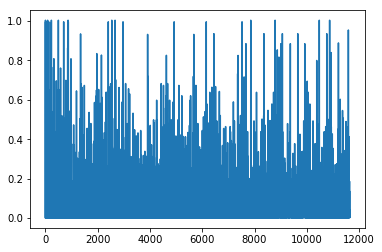

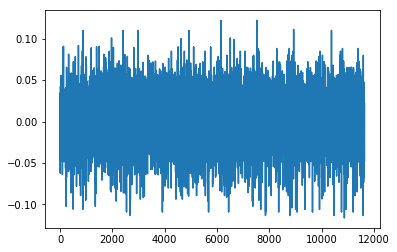

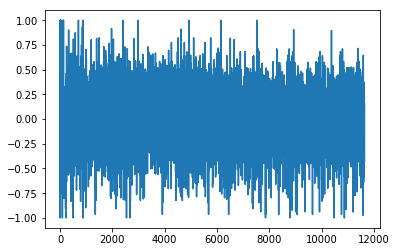

582
0.860833891509
[ 1.          0.11111111  0.88888889  1.          0.11111111  0.33333333
  0.22222222  0.77777778  0.77777778  0.22222222  0.33333333  0.77777778
  0.33333333  0.22222222  0.77777778  1.          0.22222222  0.44444444
  0.55555556  1.          0.11111111  0.44444444  0.22222222  0.11111111
  0.33333333  0.77777778  0.33333333  0.77777778  0.77777778  0.33333333
  0.77777778  0.33333333  0.22222222  0.66666667  0.77777778  0.88888889
  0.22222222  0.66666667  0.88888889  0.11111111  0.          0.88888889
  0.22222222  0.33333333  0.88888889  0.22222222  0.33333333  0.88888889
  0.11111111  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.          0.88888889  0.88888889  0.55555556]
Writing away results
2003-07-01 00:00:00


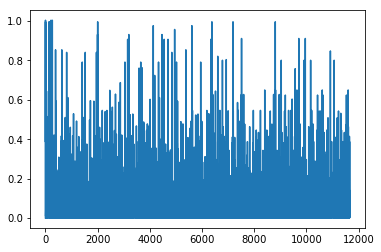

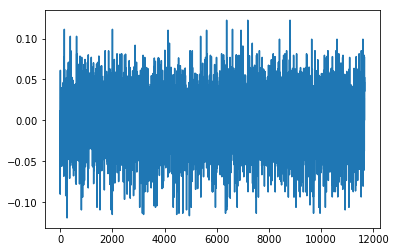

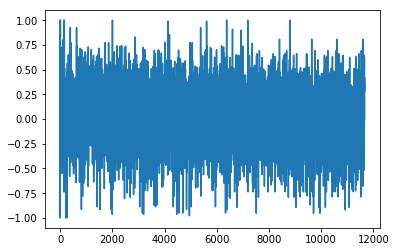

583
0.942515733389
[ 0.88888889  0.77777778  0.44444444  0.22222222  1.          1.
  0.77777778  0.22222222  0.77777778  0.66666667  0.88888889  0.
  0.77777778  0.22222222  0.22222222  1.          0.77777778  1.
  0.22222222  0.55555556  0.55555556  1.          0.          0.66666667
  0.77777778  0.44444444  0.22222222  1.          0.44444444  0.77777778
  0.11111111  0.88888889  0.44444444  0.22222222  0.55555556  0.11111111
  0.55555556  0.11111111  0.55555556  0.55555556  0.55555556  0.77777778
  0.55555556  0.55555556  0.55555556  0.88888889  1.          0.44444444
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556]
Writing away results
2003-08-01 00:00:00


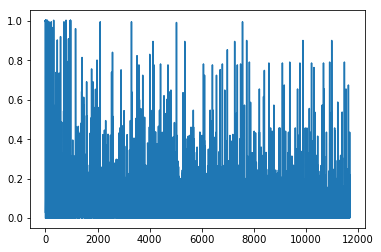

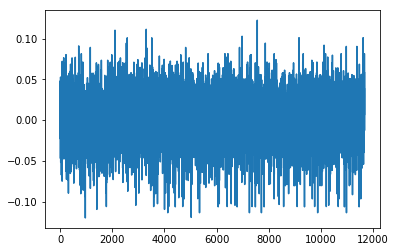

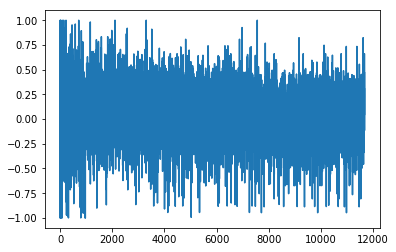

584
0.816677671595
[ 0.22222222  0.44444444  0.33333333  0.66666667  0.55555556  0.
  0.55555556  0.55555556  0.44444444  0.66666667  1.          0.44444444
  0.22222222  0.11111111  1.          0.44444444  0.22222222  0.88888889
  0.33333333  0.66666667  0.55555556  1.          0.44444444  0.11111111
  1.          0.44444444  0.33333333  0.55555556  0.33333333  0.22222222
  0.11111111  0.22222222  0.33333333  0.33333333  0.33333333  0.33333333
  0.77777778  0.33333333  0.33333333  0.55555556  0.33333333  0.
  0.11111111  0.33333333  0.66666667  0.22222222  0.88888889  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333]
Writing away results
2003-09-01 00:00:00


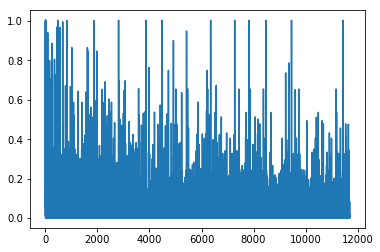

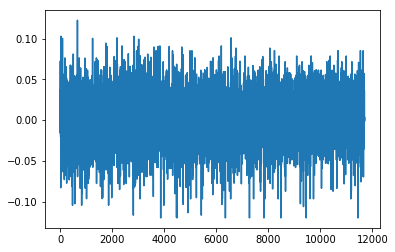

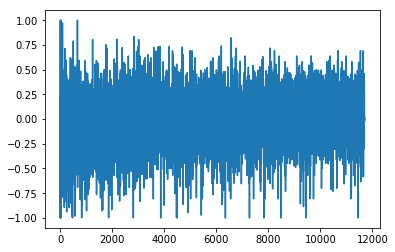

585
0.765912535702
[ 0.66666667  0.77777778  0.33333333  0.88888889  0.55555556  1.
  0.77777778  0.77777778  0.88888889  1.          0.55555556  0.55555556
  0.11111111  0.33333333  0.22222222  0.66666667  0.77777778  0.55555556
  0.22222222  0.11111111  0.11111111  0.33333333  0.66666667  0.88888889
  0.77777778  0.55555556  1.          0.55555556  0.44444444  0.33333333
  0.77777778  0.22222222  0.44444444  0.22222222  0.22222222  0.22222222
  0.55555556  0.22222222  0.22222222  0.22222222  0.22222222  0.33333333
  0.77777778  0.22222222  0.33333333  0.77777778  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.11111111]
Writing away results
2003-10-01 00:00:00


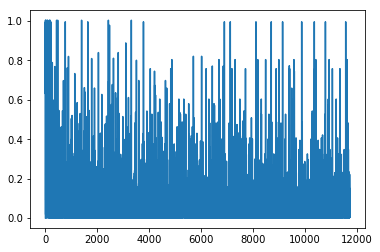

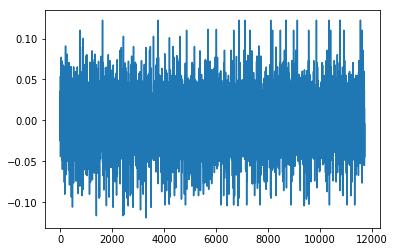

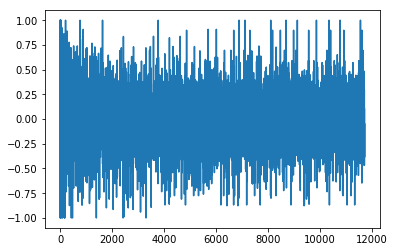

586
0.961062589825
[ 0.55555556  0.          0.11111111  0.44444444  0.44444444  0.11111111
  0.55555556  0.          0.44444444  0.11111111  0.11111111  0.44444444
  0.55555556  0.11111111  0.          0.33333333  0.55555556  0.88888889
  0.          0.11111111  0.44444444  0.88888889  0.77777778  0.88888889
  0.77777778  0.44444444  1.          0.44444444  1.          0.11111111
  0.66666667  0.          0.66666667  1.          0.33333333  1.
  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667  0.55555556
  0.66666667  0.          0.55555556  0.66666667  0.88888889  0.66666667
  0.88888889  0.66666667  0.33333333  0.66666667  0.66666667  0.66666667
  0.88888889  0.88888889  0.88888889  0.77777778  0.11111111]
Writing away results
2003-11-01 00:00:00


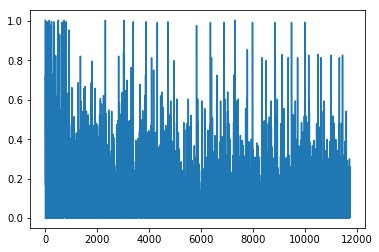

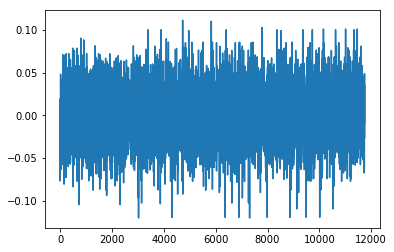

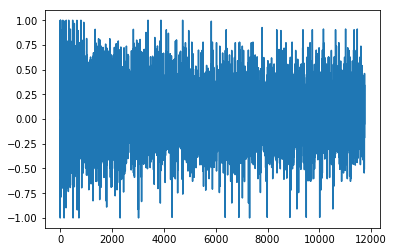

587
0.9826838822
[ 0.44444444  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  1.          0.22222222  0.22222222  0.22222222  0.11111111  0.55555556
  0.88888889  0.66666667  0.22222222  0.77777778  0.66666667  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.44444444  1.
  0.22222222  1.          0.22222222  0.88888889  0.          0.66666667
  1.          0.77777778  0.66666667  0.88888889  1.          0.66666667
  0.66666667  0.88888889  0.55555556  0.66666667  0.77777778  0.66666667
  0.66666667  0.22222222  1.          0.66666667  1.          0.66666667
  0.66666667  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.22222222  0.22222222]
Writing away results
2003-12-01 00:00:00


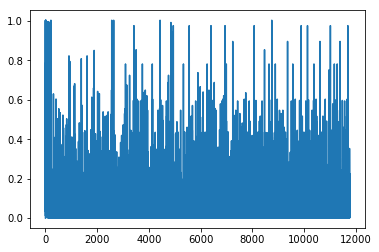

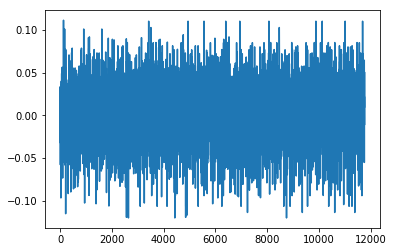

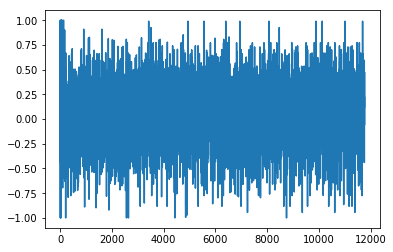

588
0.740699156862
[ 1.          0.44444444  1.          1.          1.          0.44444444
  1.          1.          1.          0.88888889  0.          0.77777778
  0.22222222  0.88888889  0.44444444  0.66666667  1.          0.44444444
  1.          0.44444444  1.          1.          0.44444444  1.
  0.44444444  0.          0.33333333  0.44444444  0.33333333  0.
  0.33333333  0.          0.33333333  0.          0.          0.88888889
  0.44444444  0.          0.          0.44444444  0.66666667  0.
  0.44444444  0.          0.          0.33333333  0.          0.          0.
  0.33333333  0.          0.          0.          0.          0.          0.
  0.11111111  0.11111111  0.11111111]
Writing away results
2004-01-01 00:00:00


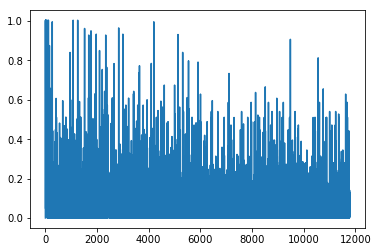

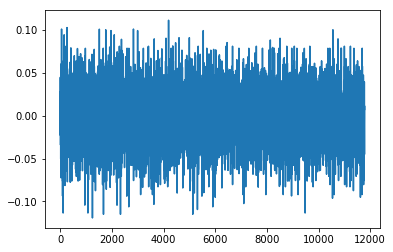

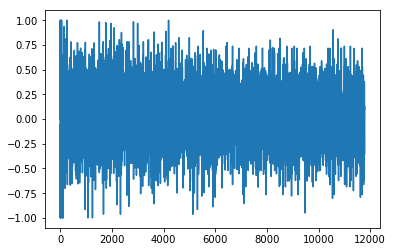

589
0.788572871207
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.22222222  0.66666667
  0.66666667  0.55555556  0.66666667  0.          0.88888889  0.11111111
  0.66666667  0.88888889  0.11111111  0.          0.66666667  0.66666667
  0.44444444  0.66666667  0.66666667  0.88888889  0.66666667  0.
  0.66666667  0.11111111  0.77777778  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.55555556  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  1.          0.11111111  0.33333333  0.77777778
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.66666667  0.55555556  0.22222222  0.66666667]
Writing away results
2004-02-01 00:00:00


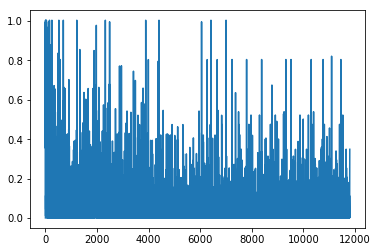

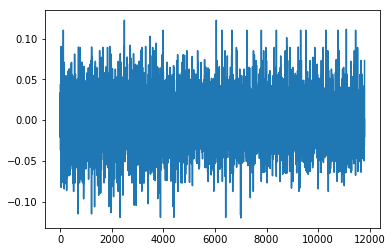

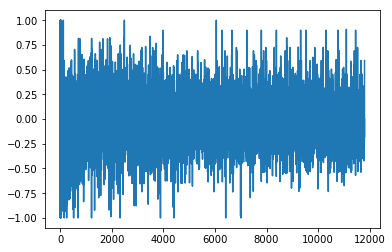

590
0.962386993956
[ 1.          0.22222222  0.22222222  0.          0.22222222  1.          0.
  0.33333333  0.55555556  0.44444444  0.          0.33333333  0.11111111
  0.          1.          0.22222222  0.22222222  0.22222222  0.22222222
  1.          0.11111111  0.22222222  0.11111111  0.          0.66666667
  0.11111111  0.66666667  0.77777778  0.44444444  0.44444444  0.44444444
  0.66666667  0.44444444  0.44444444  0.44444444  0.          0.88888889
  0.11111111  0.          0.88888889  0.33333333  0.11111111  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.66666667  0.88888889  0.88888889
  1.          0.77777778  0.22222222  0.11111111]
Writing away results
2004-03-01 00:00:00


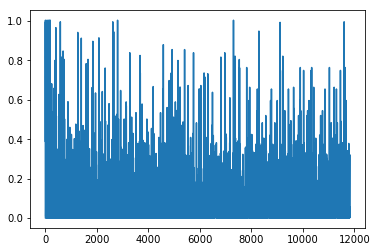

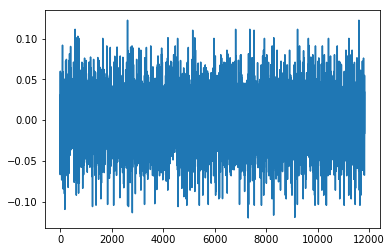

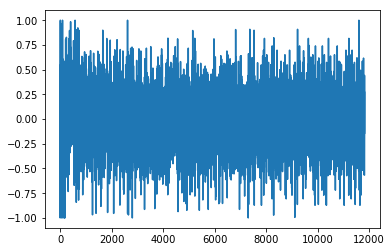

591
0.774643112921
[ 0.44444444  1.          0.33333333  0.22222222  0.44444444  0.11111111
  0.33333333  0.22222222  0.44444444  0.22222222  0.22222222  0.77777778
  0.88888889  0.66666667  0.44444444  0.44444444  0.11111111  0.22222222
  0.77777778  0.11111111  0.22222222  0.55555556  0.22222222  0.55555556
  0.77777778  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.77777778  0.88888889  0.88888889  0.77777778  0.88888889  0.88888889
  1.          0.33333333  0.          0.55555556  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.77777778  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.77777778  0.44444444
  0.44444444  0.44444444  0.44444444  0.55555556  0.33333333]
Writing away results
2004-04-01 00:00:00


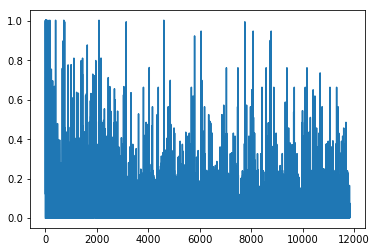

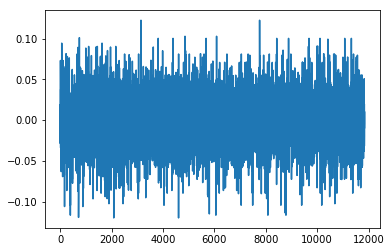

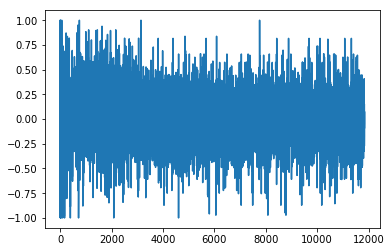

592
0.793669568538
[ 0.66666667  0.77777778  0.88888889  0.88888889  0.44444444  0.44444444
  0.          0.77777778  0.44444444  0.11111111  0.22222222  0.
  0.44444444  0.66666667  0.88888889  0.11111111  0.88888889  0.22222222
  0.11111111  0.88888889  0.77777778  0.55555556  0.22222222  0.
  0.77777778  0.11111111  0.          0.77777778  0.11111111  0.77777778
  0.          0.          0.33333333  0.55555556  0.11111111  0.
  0.22222222  0.44444444  0.66666667  0.77777778  0.11111111  0.11111111
  0.          0.11111111  0.          0.          0.          0.          0.
  0.          0.11111111  0.11111111  0.33333333  0.33333333  0.55555556
  0.88888889  0.77777778  0.55555556  0.88888889]
Writing away results
2004-05-01 00:00:00


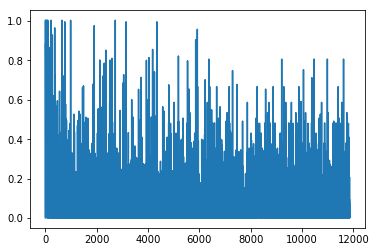

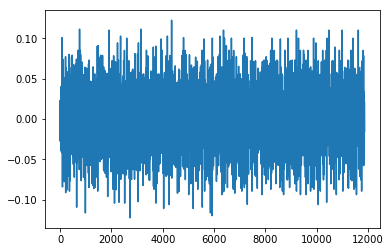

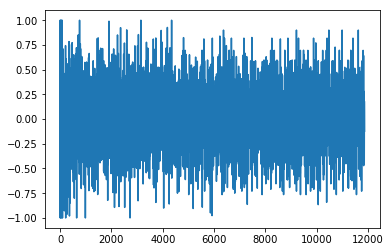

593
0.75204459243
[ 0.          0.22222222  0.11111111  0.77777778  1.          0.22222222
  0.66666667  0.88888889  0.33333333  0.88888889  0.          1.
  0.11111111  0.88888889  0.66666667  0.33333333  1.          0.11111111
  1.          0.77777778  0.          0.44444444  0.55555556  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.88888889  0.44444444
  0.44444444  0.77777778  0.          0.44444444  0.66666667  0.
  0.44444444  0.11111111  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.22222222  0.11111111  0.88888889
  1.          0.77777778  0.          1.          0.11111111]
Writing away results
2004-06-01 00:00:00


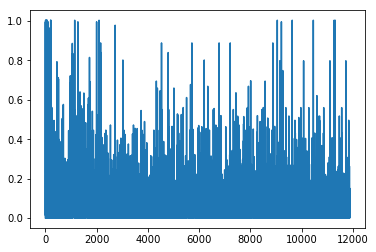

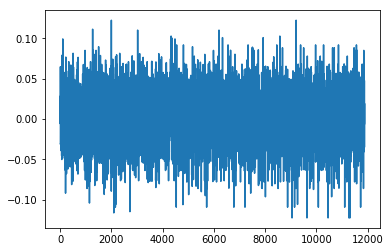

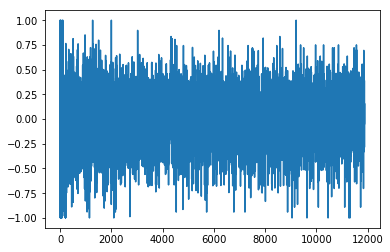

594
0.954383998829
[ 1.          0.11111111  0.33333333  0.33333333  0.          0.55555556
  0.33333333  1.          0.55555556  0.66666667  0.33333333  0.77777778
  0.22222222  0.55555556  1.          0.33333333  0.66666667  1.
  0.55555556  1.          0.55555556  0.88888889  0.33333333  0.55555556
  0.55555556  0.55555556  0.88888889  0.          0.55555556  0.44444444
  0.          0.88888889  0.          0.          0.44444444  1.
  0.11111111  0.55555556  0.55555556  0.55555556  0.66666667  0.55555556
  0.          0.55555556  0.55555556  0.          0.          0.55555556
  0.55555556  0.          0.44444444  0.77777778  0.77777778  1.          0.
  1.          1.          0.77777778  0.33333333]
Writing away results
2004-07-01 00:00:00


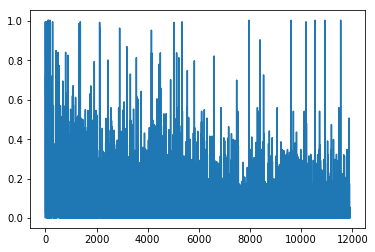

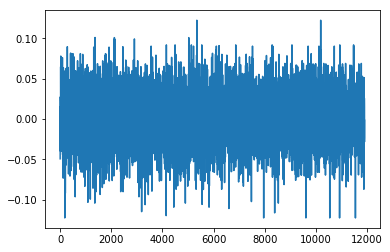

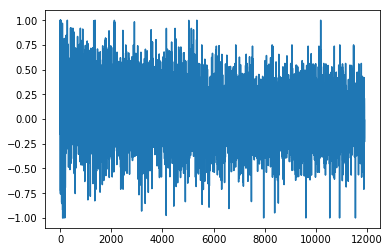

595
0.928149700732
[ 0.55555556  0.          0.88888889  0.55555556  0.44444444  0.44444444
  0.22222222  0.11111111  0.44444444  0.55555556  0.22222222  1.
  0.22222222  1.          0.55555556  0.          0.55555556  0.44444444
  0.22222222  0.88888889  0.44444444  0.88888889  0.33333333  0.11111111
  0.44444444  0.11111111  0.11111111  0.44444444  0.11111111  0.44444444
  0.88888889  0.44444444  0.44444444  0.88888889  0.22222222  0.55555556
  0.44444444  0.44444444  0.11111111  0.11111111  0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  0.11111111  0.44444444  0.44444444
  0.44444444  0.55555556  0.55555556  0.22222222  0.55555556  0.44444444
  1.          0.55555556  0.55555556  0.          0.55555556]
Writing away results
2004-08-01 00:00:00


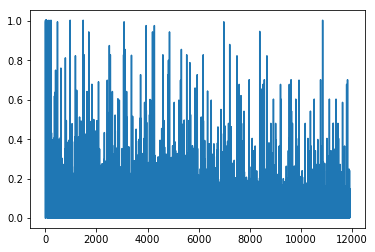

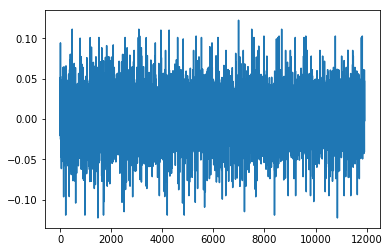

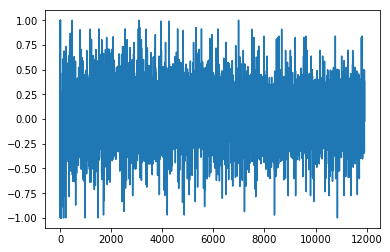

596
0.958176483491
[ 0.          0.11111111  0.33333333  0.66666667  0.33333333  0.11111111
  1.          0.55555556  0.33333333  0.11111111  0.33333333  0.11111111
  0.33333333  0.11111111  0.          0.33333333  0.88888889  0.66666667
  0.11111111  0.22222222  0.55555556  0.55555556  0.55555556  1.
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  1.
  0.55555556  1.          1.          0.          0.11111111  1.
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.33333333  0.33333333  0.77777778  0.11111111  0.11111111  0.
  0.11111111  0.33333333  0.33333333  0.33333333  0.33333333]
Writing away results
2004-09-01 00:00:00


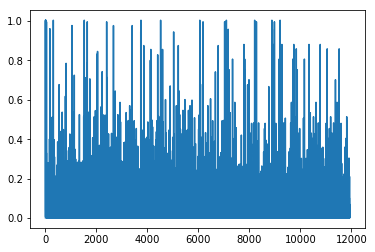

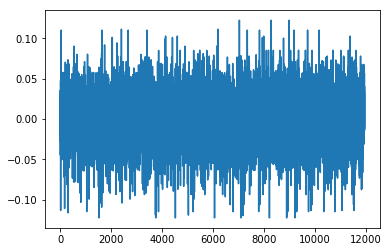

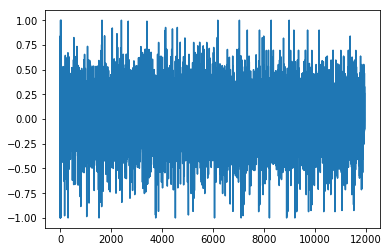

597
0.857088595892
[ 0.11111111  1.          0.55555556  0.66666667  0.11111111  0.55555556
  0.          1.          0.11111111  1.          0.66666667  1.
  0.33333333  0.66666667  1.          0.55555556  0.11111111  0.33333333
  0.77777778  0.55555556  0.88888889  0.44444444  0.55555556  0.11111111
  0.55555556  0.55555556  0.44444444  0.55555556  0.55555556  0.55555556
  0.44444444  0.55555556  0.77777778  0.11111111  0.55555556  0.77777778
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.11111111  0.22222222
  0.44444444  0.55555556  1.          0.55555556  0.66666667  1.
  0.66666667  0.66666667  1.          1.          0.        ]
Writing away results
2004-10-01 00:00:00


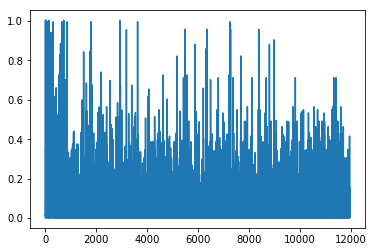

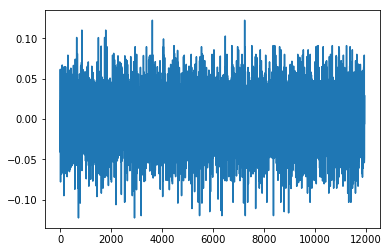

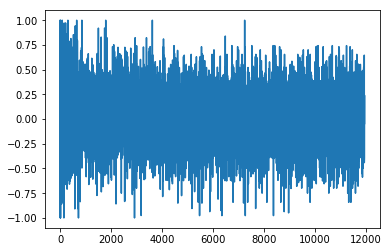

598
0.927558350768
[ 0.22222222  0.77777778  0.33333333  0.66666667  0.11111111  0.88888889
  0.66666667  0.44444444  0.33333333  0.66666667  0.55555556  0.66666667
  0.44444444  0.77777778  0.11111111  0.33333333  0.66666667  1.
  0.88888889  0.22222222  1.          0.88888889  0.88888889  0.11111111
  0.88888889  0.88888889  0.11111111  0.88888889  0.88888889  0.11111111
  0.88888889  0.66666667  0.55555556  0.11111111  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.44444444  0.77777778  0.77777778
  0.22222222  0.55555556  0.11111111  0.33333333  0.66666667  0.55555556
  0.          0.66666667  0.55555556  0.          0.66666667]
Writing away results
2004-11-01 00:00:00


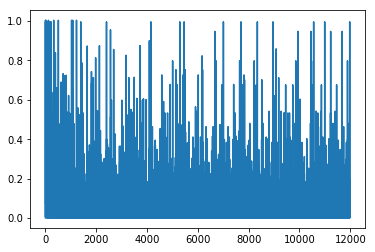

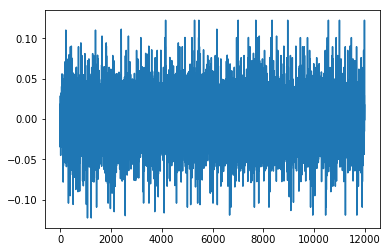

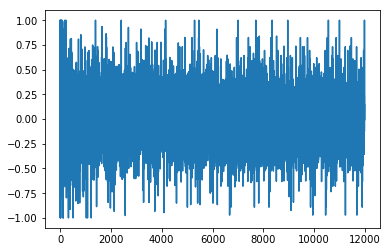

599
0.964134494464
[ 1.          0.11111111  0.33333333  0.88888889  0.66666667  0.33333333
  0.88888889  0.44444444  0.77777778  0.          0.33333333  0.88888889
  0.44444444  0.77777778  0.55555556  1.          0.22222222  0.88888889
  0.88888889  1.          0.88888889  1.          0.88888889  1.
  0.55555556  1.          0.55555556  1.          1.          0.55555556
  0.22222222  0.          0.88888889  1.          1.          1.          1.
  1.          1.          1.          1.          0.88888889  1.          1.
  1.          0.44444444  0.11111111  0.88888889  0.11111111  0.88888889
  0.          0.33333333  0.33333333  0.          0.33333333  0.11111111
  0.44444444  0.33333333  0.        ]
Writing away results
2004-12-01 00:00:00


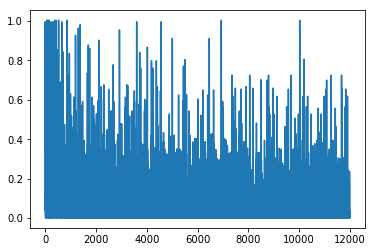

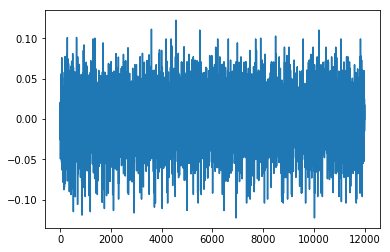

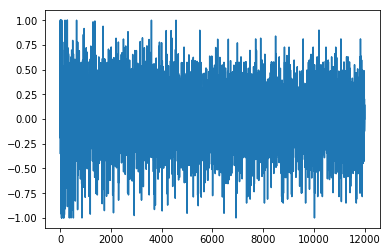

600
0.854511084356
[ 1.          0.66666667  0.          0.33333333  0.22222222  0.55555556
  0.11111111  0.44444444  0.77777778  1.          0.          0.22222222
  0.55555556  0.11111111  0.66666667  0.33333333  0.66666667  1.
  0.66666667  1.          0.33333333  0.11111111  0.33333333  0.44444444
  0.33333333  0.11111111  0.44444444  0.66666667  0.11111111  1.
  0.77777778  0.11111111  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.66666667
  0.33333333  0.33333333  0.22222222  0.22222222  0.55555556  0.88888889
  0.55555556  0.11111111  0.88888889  0.77777778  0.77777778  1.
  0.22222222  0.11111111  1.          0.88888889  0.33333333]
Writing away results
2005-01-01 00:00:00


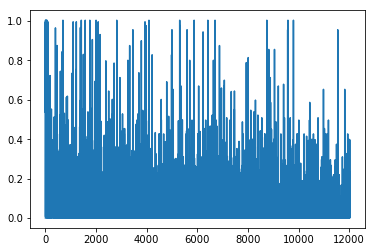

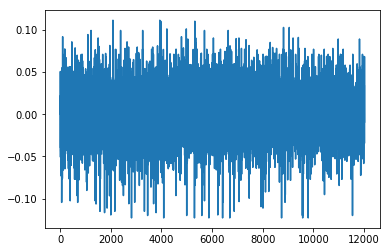

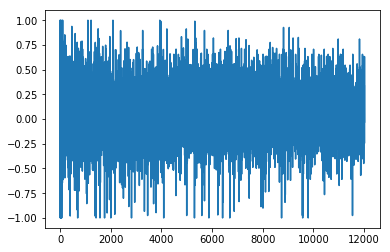

601
0.883730268376
[ 0.66666667  0.55555556  0.          0.11111111  1.          0.
  0.11111111  0.11111111  0.11111111  0.66666667  0.11111111  0.55555556
  1.          0.33333333  0.66666667  0.33333333  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.          0.11111111  1.
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.11111111  0.          0.77777778  1.          0.55555556
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  1.          0.
  0.11111111  0.          0.55555556  0.66666667]
Writing away results
2005-02-01 00:00:00


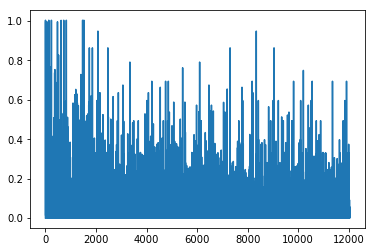

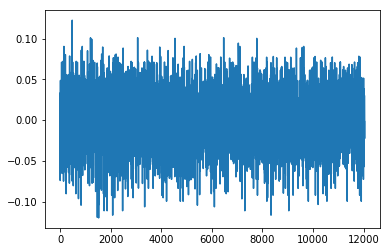

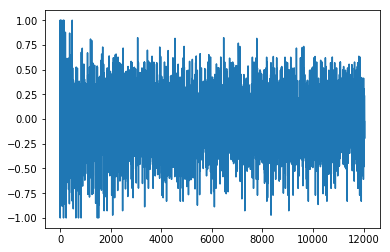

602
0.844707793116
[ 0.77777778  0.44444444  0.33333333  0.11111111  0.22222222  0.11111111
  0.33333333  0.77777778  0.66666667  0.33333333  0.11111111  0.
  0.22222222  0.66666667  0.22222222  0.66666667  0.          0.22222222
  0.33333333  0.77777778  0.          0.44444444  0.66666667  0.
  0.66666667  0.          0.22222222  0.33333333  0.77777778  0.22222222
  0.66666667  0.22222222  0.77777778  0.22222222  0.          0.          0.
  0.22222222  0.22222222  0.77777778  0.22222222  0.          0.33333333
  0.11111111  0.11111111  0.77777778  0.22222222  0.66666667  0.33333333
  0.11111111  0.33333333  0.33333333  0.33333333  0.88888889  0.66666667
  0.77777778  0.          0.44444444  0.77777778]
Writing away results
2005-03-01 00:00:00


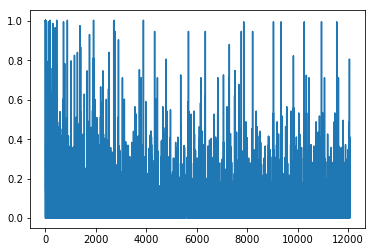

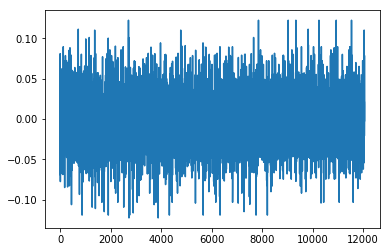

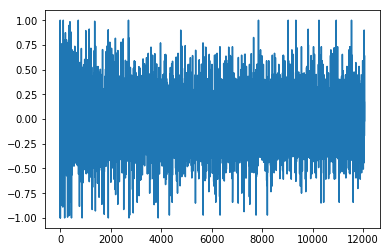

603
0.88262926738
[ 0.88888889  0.55555556  0.22222222  0.55555556  0.11111111  0.22222222
  0.44444444  0.33333333  0.22222222  0.66666667  0.22222222  0.88888889
  0.77777778  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  1.          0.88888889  0.88888889  0.33333333  0.88888889  0.88888889
  0.33333333  0.11111111  0.          0.55555556  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.22222222
  0.22222222  0.55555556  0.55555556  0.11111111  0.44444444  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.11111111  0.22222222
  0.22222222  0.33333333  0.88888889  0.88888889  0.88888889]
Writing away results
2005-04-01 00:00:00


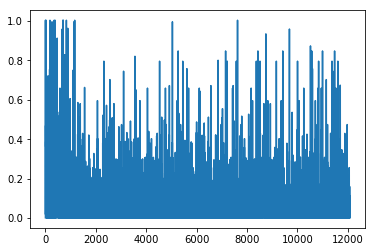

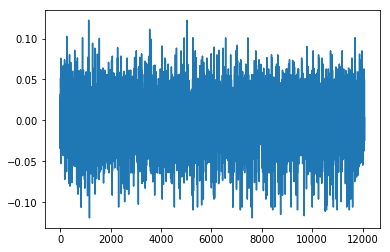

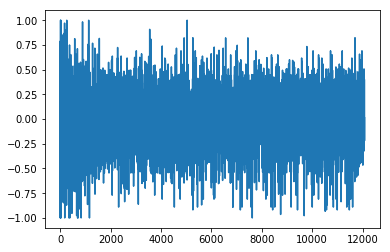

604
0.795548675234
[ 0.88888889  1.          0.22222222  0.22222222  1.          0.
  0.33333333  0.88888889  0.66666667  1.          0.          0.11111111
  0.66666667  0.11111111  0.66666667  0.33333333  0.88888889  0.
  0.66666667  0.          0.11111111  0.77777778  0.44444444  0.11111111
  0.66666667  0.88888889  0.77777778  0.66666667  0.44444444  0.11111111
  0.33333333  0.44444444  0.11111111  0.          0.11111111  0.44444444
  0.33333333  0.44444444  0.44444444  0.88888889  0.22222222  1.          1.
  0.77777778  0.66666667  0.77777778  0.88888889  0.55555556  0.77777778
  0.88888889  0.11111111  0.55555556  0.77777778  0.66666667  0.66666667
  0.33333333  1.          0.66666667  0.44444444]
Writing away results
2005-05-01 00:00:00


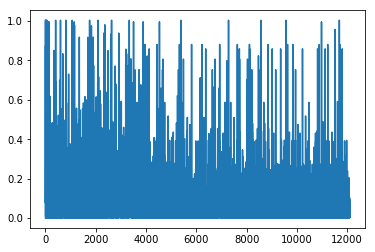

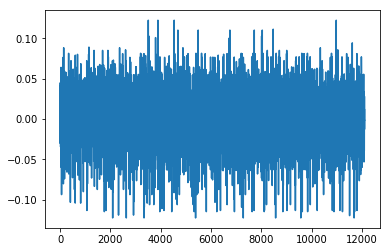

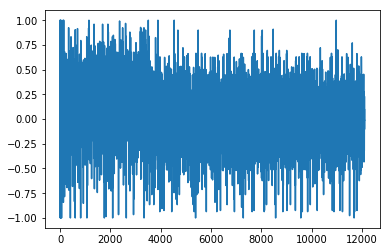

605
0.950597059393
[ 0.77777778  0.88888889  0.33333333  0.44444444  1.          0.77777778
  0.          0.55555556  0.77777778  0.11111111  0.77777778  0.22222222
  0.55555556  0.33333333  0.55555556  0.11111111  0.11111111  0.77777778
  0.55555556  0.11111111  0.77777778  0.11111111  0.77777778  0.22222222
  0.11111111  0.44444444  0.55555556  0.55555556  0.55555556  0.55555556
  0.11111111  0.11111111  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.11111111  0.          0.          0.77777778
  0.22222222  0.22222222  0.77777778  0.33333333  0.44444444  0.22222222
  1.          0.          0.44444444  0.66666667  1.          0.33333333
  0.55555556  0.11111111  0.77777778  0.55555556  0.55555556]
Writing away results
2005-06-01 00:00:00


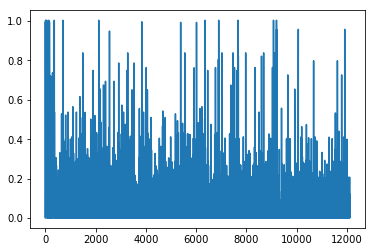

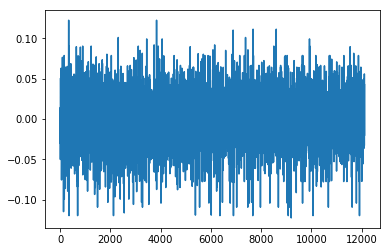

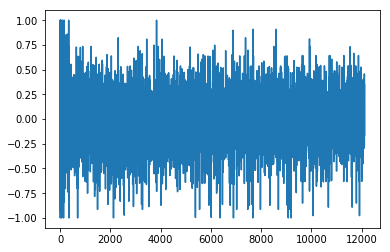

606
0.932603449773
[ 0.11111111  0.33333333  0.22222222  0.11111111  0.33333333  0.55555556
  0.88888889  0.33333333  0.11111111  0.88888889  1.          0.77777778
  0.          0.          1.          0.          0.          0.
  0.88888889  0.          0.77777778  0.          0.          0.33333333
  0.11111111  0.          0.33333333  0.          0.          1.
  0.77777778  0.          0.          0.          0.          1.
  0.77777778  0.33333333  0.55555556  0.55555556  0.55555556  0.22222222
  0.11111111  0.33333333  0.22222222  0.55555556  0.22222222  0.66666667
  0.22222222  0.55555556  0.33333333  0.11111111  0.          1.
  0.55555556  0.          0.          0.33333333  0.88888889]
Writing away results
2005-07-01 00:00:00


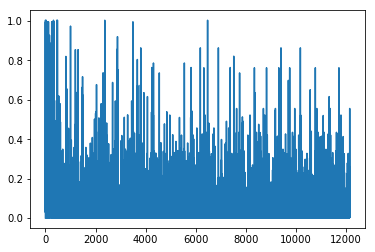

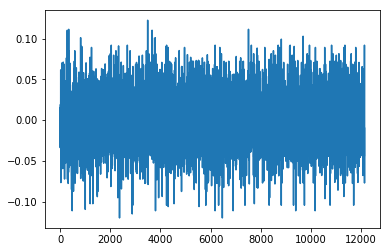

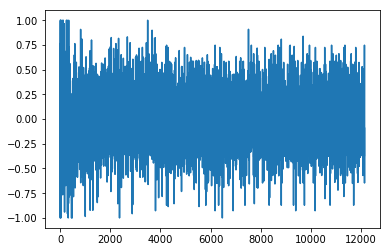

607
0.795463850699
[ 1.          0.22222222  0.          0.22222222  0.44444444  0.88888889
  0.11111111  0.66666667  0.88888889  0.55555556  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889
  0.11111111  0.66666667  0.22222222  1.          1.          0.22222222
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.55555556  0.44444444  0.33333333  0.33333333  0.33333333  1.
  0.77777778  0.          0.33333333  0.44444444  0.33333333  0.33333333
  0.88888889  0.          0.44444444  1.          1.          0.66666667
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2005-08-01 00:00:00


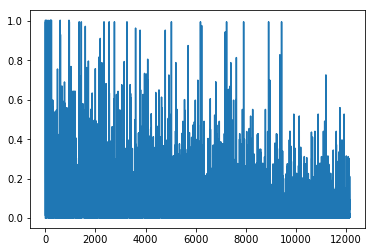

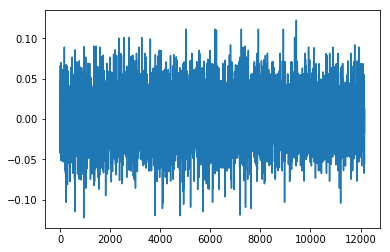

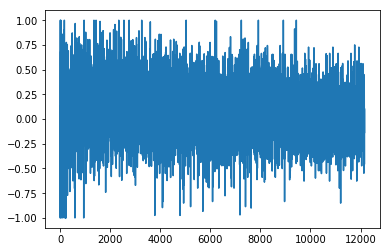

608
0.962260084447
[ 0.33333333  0.44444444  0.22222222  0.11111111  0.66666667  0.55555556
  0.66666667  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.88888889  0.          1.
  0.66666667  0.66666667  0.88888889  0.66666667  0.33333333  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889
  0.33333333  0.11111111  0.66666667  0.33333333  0.66666667  1.
  0.44444444  0.11111111  0.11111111  0.44444444  0.33333333  0.11111111
  0.44444444  0.44444444  0.88888889  0.66666667  0.55555556  0.66666667
  0.66666667  0.88888889  0.55555556  0.66666667  0.66666667]
Writing away results
2005-09-01 00:00:00


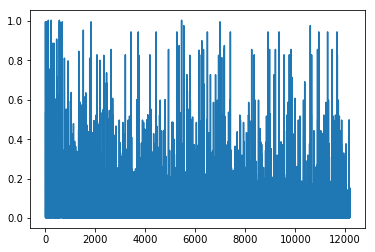

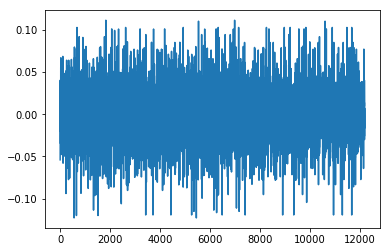

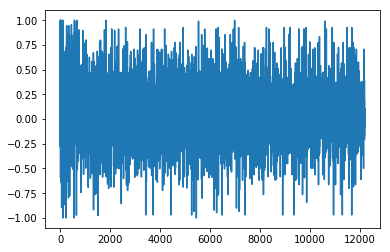

609
0.647055480144
[ 0.22222222  1.          0.22222222  1.          0.11111111  0.          1.
  0.          1.          0.          0.          0.          1.          0.
  0.          1.          0.          0.          1.          0.
  0.22222222  0.88888889  1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.11111111  0.11111111  0.33333333  0.22222222  1.
  0.55555556  0.22222222  0.33333333  0.33333333  0.33333333  0.88888889
  0.33333333  0.22222222  0.33333333  1.          0.          0.77777778
  1.          0.          0.          0.          0.          0.          0.        ]
Writing away results
2005-10-01 00:00:00


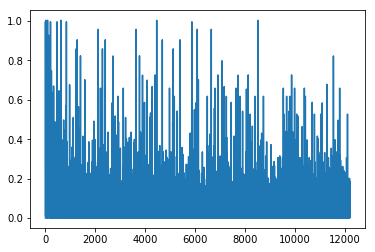

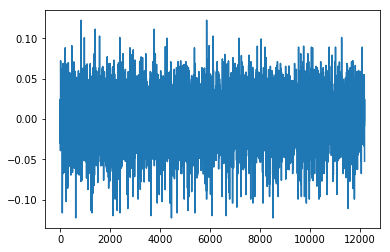

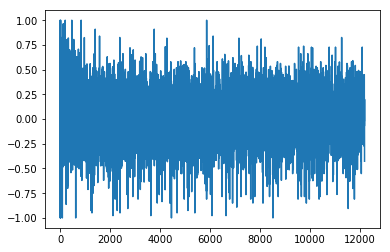

610
0.882604755235
[ 0.88888889  0.55555556  0.11111111  0.33333333  0.66666667  0.77777778
  0.33333333  0.33333333  0.66666667  0.33333333  0.66666667  0.77777778
  0.33333333  0.66666667  0.11111111  1.          1.          0.66666667
  0.          0.88888889  0.77777778  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.33333333  0.33333333  0.11111111  0.11111111
  0.88888889  0.11111111  0.11111111  0.44444444  0.55555556  0.55555556
  0.88888889  0.88888889  0.55555556  0.11111111  0.88888889  0.77777778
  0.33333333  0.88888889  0.55555556  0.33333333  0.33333333  0.33333333
  0.66666667  0.33333333  0.66666667  0.66666667  0.66666667]
Writing away results
2005-11-01 00:00:00


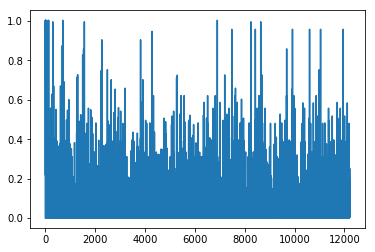

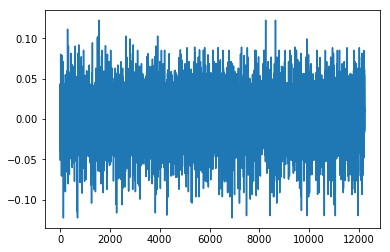

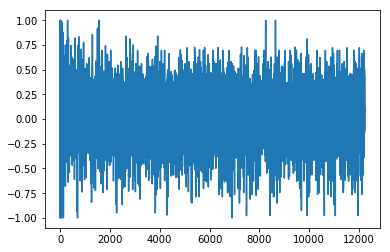

611
0.749088050676
[ 1.          0.11111111  0.          0.44444444  0.55555556  0.44444444
  0.66666667  0.66666667  0.44444444  0.66666667  0.44444444  0.66666667
  0.66666667  0.11111111  0.88888889  0.44444444  0.66666667  0.11111111
  0.33333333  0.55555556  0.          0.66666667  0.66666667  0.66666667
  0.44444444  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.44444444  0.44444444  1.          1.          0.77777778
  0.77777778  0.11111111  0.          1.          0.55555556  0.55555556
  1.          0.55555556  0.11111111  0.77777778  0.55555556  0.          0.
  0.44444444  0.88888889  0.66666667  0.66666667  0.77777778  0.66666667
  0.66666667  0.66666667  0.44444444  0.66666667]
Writing away results
2005-12-01 00:00:00


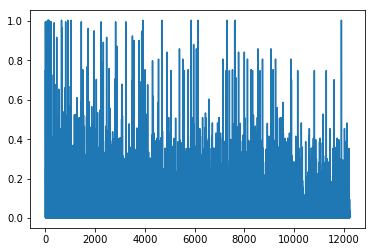

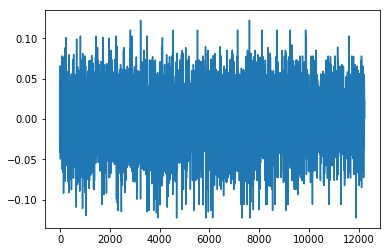

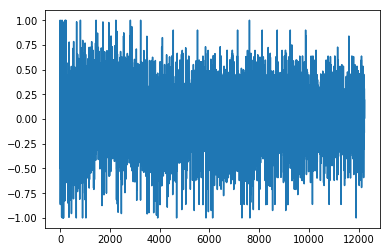

612
0.91491892924
[ 0.          0.55555556  0.66666667  0.55555556  0.          0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.          0.77777778
  0.11111111  0.          0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.          0.          0.88888889  0.11111111  0.55555556  0.66666667
  0.33333333  0.77777778  0.66666667  0.11111111  0.11111111  0.66666667
  0.66666667  1.          0.77777778  0.66666667  0.          0.
  0.66666667  0.55555556  0.55555556  0.          0.55555556  0.55555556
  0.55555556  0.55555556  0.          0.22222222  0.55555556]
Writing away results
2006-01-01 00:00:00


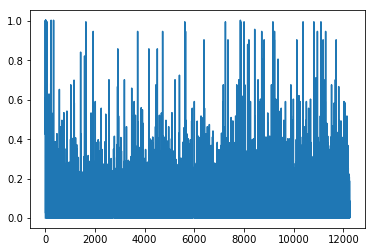

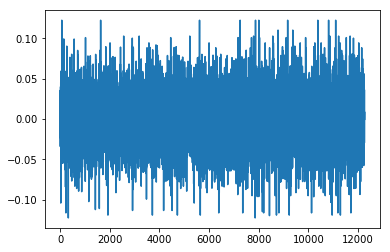

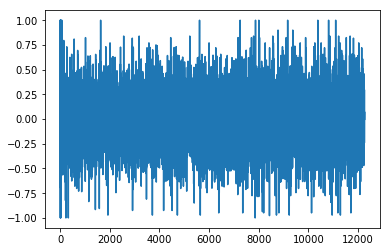

613
0.937851640551
[ 0.11111111  0.66666667  0.55555556  0.66666667  1.          0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.66666667  0.55555556  0.11111111  0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.
  0.77777778  0.          0.44444444  0.33333333  0.33333333  0.77777778
  0.44444444  0.77777778  0.77777778  0.44444444  0.33333333  0.55555556
  0.77777778  0.66666667  1.          0.55555556  1.          1.          1.
  0.          1.          1.          1.          1.          0.55555556
  0.66666667  1.        ]
Writing away results
2006-02-01 00:00:00


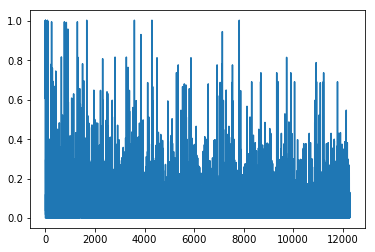

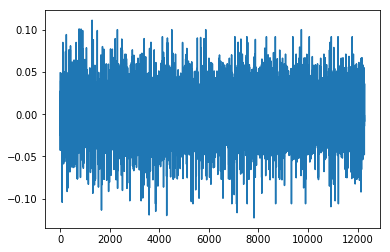

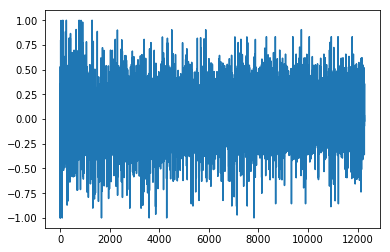

614
0.747959918353
[ 0.66666667  0.88888889  0.66666667  0.44444444  0.66666667  0.66666667
  0.66666667  0.44444444  0.66666667  0.66666667  0.44444444  0.22222222
  0.44444444  0.44444444  0.66666667  0.55555556  1.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.44444444  0.66666667  0.44444444  0.66666667
  0.33333333  0.33333333  0.22222222  0.55555556  0.44444444  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.55555556  0.33333333  0.44444444  0.66666667  0.55555556  0.22222222
  0.66666667  0.66666667  0.22222222  0.66666667  0.66666667  0.66666667
  0.44444444  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2006-03-01 00:00:00


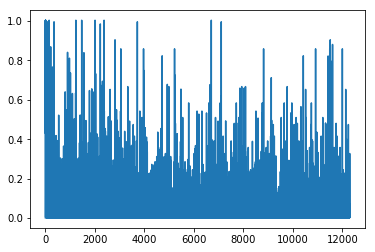

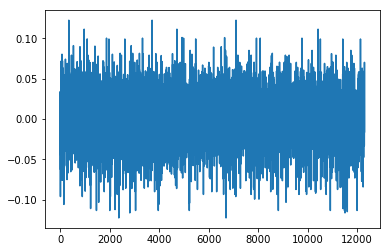

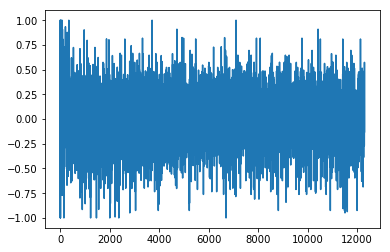

615
0.731308831984
[ 0.22222222  0.44444444  0.33333333  0.33333333  0.33333333  0.33333333
  0.88888889  0.22222222  0.33333333  0.33333333  1.          0.33333333
  0.22222222  1.          0.22222222  0.          0.88888889  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.11111111  0.77777778
  0.77777778  0.44444444  0.55555556  0.88888889  1.          0.          0.
  1.          0.55555556  0.          0.          0.55555556  0.
  0.77777778  0.22222222  0.55555556  0.11111111  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.22222222
  0.88888889  0.33333333  0.33333333  0.88888889]
Writing away results
2006-04-01 00:00:00


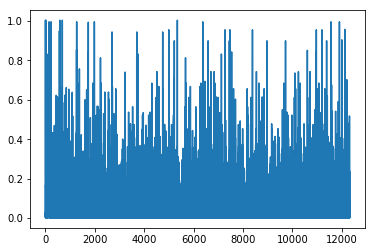

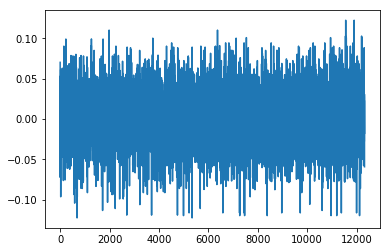

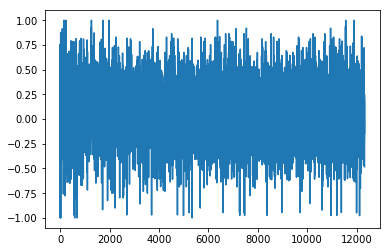

616
0.762994829166
[ 1.          1.          1.          1.          1.          0.11111111
  0.11111111  1.          0.11111111  0.44444444  0.11111111  0.22222222
  0.66666667  1.          0.22222222  0.11111111  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.11111111  0.22222222  0.44444444  0.44444444  0.33333333
  0.11111111  0.77777778  0.33333333  0.77777778  0.22222222  0.33333333
  0.22222222  0.44444444  0.77777778  0.22222222  0.11111111  1.          1.
  0.11111111  1.          1.          1.          1.          1.          1.
  1.          1.          0.11111111  1.          1.          1.          1.        ]
Writing away results
2006-05-01 00:00:00


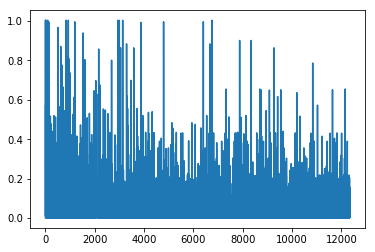

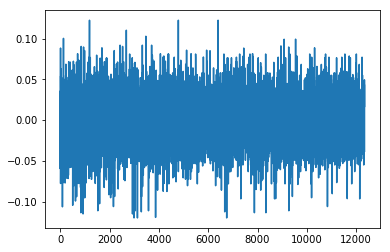

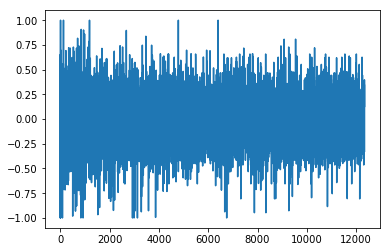

617
0.87241598422
[ 0.77777778  0.55555556  0.77777778  0.66666667  0.11111111  0.11111111
  0.66666667  0.77777778  0.11111111  0.55555556  0.44444444  0.11111111
  0.22222222  0.          0.11111111  0.66666667  0.77777778  0.77777778
  0.66666667  0.66666667  0.55555556  0.11111111  0.77777778  0.77777778
  0.66666667  0.11111111  0.66666667  0.55555556  0.55555556  0.          1.
  0.11111111  1.          0.          0.22222222  0.          0.22222222
  1.          0.          0.          0.          0.11111111  0.88888889
  0.66666667  0.77777778  0.11111111  0.66666667  0.77777778  0.11111111
  0.77777778  0.11111111  0.11111111  0.66666667  0.55555556  0.77777778
  0.66666667  0.77777778  0.55555556  0.11111111]
Writing away results
2006-06-01 00:00:00


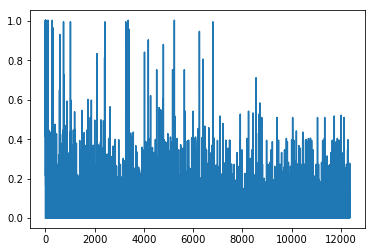

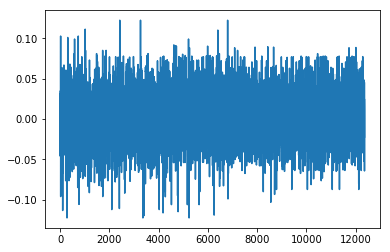

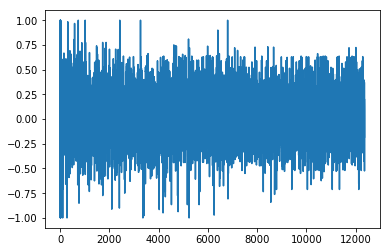

618
0.912072611282
[ 0.44444444  0.77777778  0.44444444  0.11111111  0.77777778  0.55555556
  0.77777778  0.          0.66666667  0.77777778  1.          0.66666667
  0.          0.77777778  0.44444444  0.55555556  0.77777778  0.44444444
  0.77777778  0.55555556  0.77777778  0.44444444  0.77777778  0.77777778
  0.77777778  0.66666667  0.11111111  0.11111111  0.88888889  0.88888889
  0.22222222  1.          1.          0.11111111  0.          0.22222222
  0.33333333  0.11111111  0.66666667  0.11111111  1.          1.
  0.88888889  0.77777778  0.77777778  0.44444444  0.55555556  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778
  1.          0.77777778  0.77777778  0.44444444  0.77777778]
Writing away results
2006-07-01 00:00:00


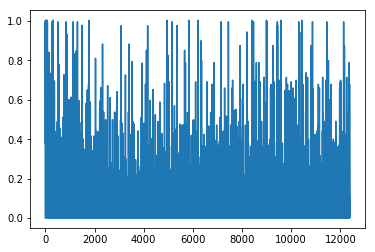

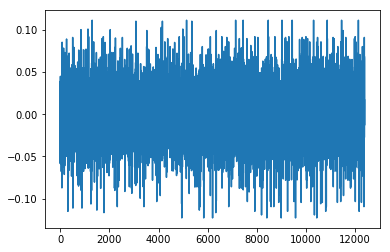

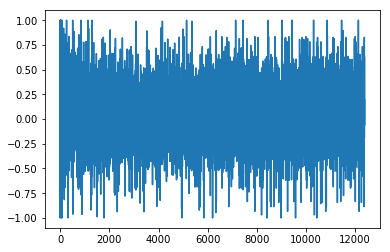

619
0.834488453595
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.22222222  0.77777778
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.33333333  0.22222222  0.55555556  0.22222222  0.11111111
  1.          0.22222222  0.33333333  1.          0.22222222  1.
  0.33333333  0.22222222  0.77777778  0.88888889  0.88888889  0.22222222
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
2006-08-01 00:00:00


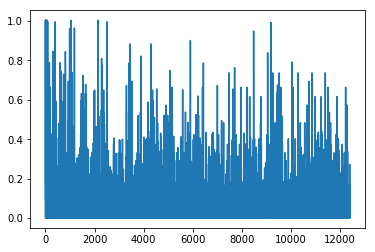

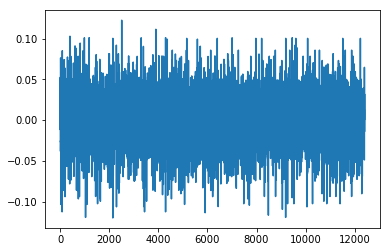

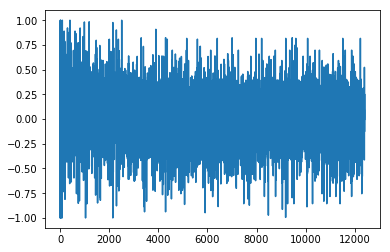

620
0.753112113353
[ 0.55555556  0.77777778  0.55555556  0.55555556  1.          0.77777778
  0.77777778  0.55555556  0.11111111  0.11111111  0.44444444  0.66666667
  0.55555556  0.66666667  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.66666667  0.44444444  0.55555556  0.55555556
  0.88888889  0.11111111  0.          0.88888889  0.77777778  0.11111111
  0.11111111  0.11111111  0.11111111  0.33333333  0.          0.33333333
  0.88888889  0.77777778  0.66666667  0.11111111  1.          0.44444444
  0.66666667  0.55555556  0.55555556  0.77777778  0.55555556  0.55555556
  0.77777778  0.11111111  0.66666667  0.55555556  0.11111111  0.
  0.55555556  0.55555556  0.55555556  0.          0.55555556]
Writing away results
2006-09-01 00:00:00


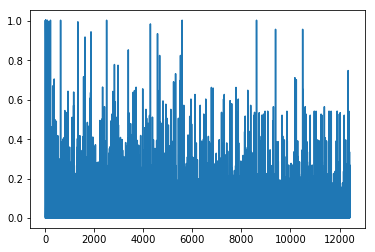

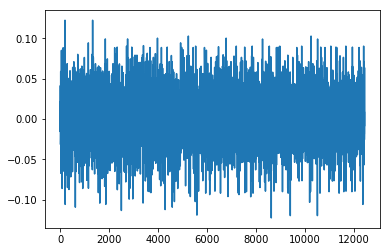

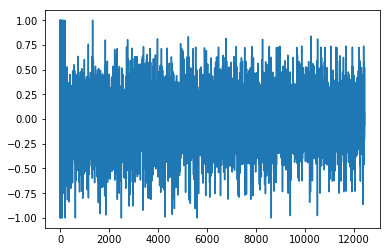

621
0.776764396011
[ 0.66666667  0.77777778  0.66666667  0.          0.66666667  0.66666667
  0.          0.77777778  0.22222222  0.44444444  0.77777778  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.77777778  0.44444444
  0.22222222  0.22222222  0.55555556  1.          0.22222222  0.22222222
  0.22222222  0.11111111  0.22222222  0.11111111  0.44444444  0.22222222
  0.22222222  0.77777778  0.88888889  0.66666667  0.77777778  0.77777778
  0.66666667  1.          0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778
  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778]
Writing away results
2006-10-01 00:00:00


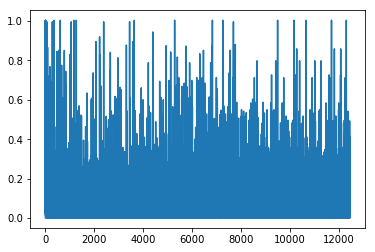

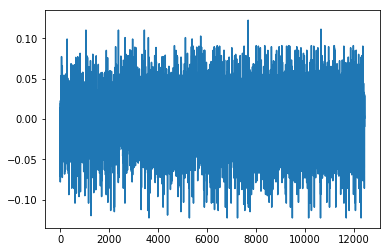

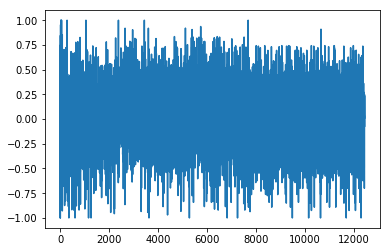

622
0.83446080258
[ 0.88888889  0.88888889  0.22222222  0.66666667  0.88888889  0.88888889
  0.88888889  0.33333333  1.          0.88888889  0.88888889  0.88888889
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.66666667  0.77777778  0.22222222
  0.22222222  0.77777778  0.11111111  0.33333333  0.77777778  1.
  0.55555556  1.          0.          0.22222222  1.          0.44444444
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.22222222  0.88888889  0.88888889  0.88888889  0.88888889  0.33333333
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889]
Writing away results
2006-11-01 00:00:00


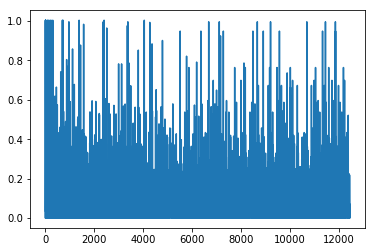

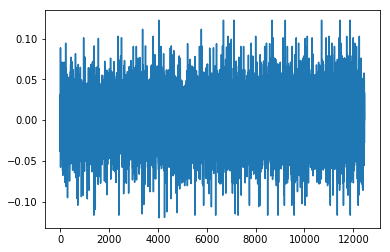

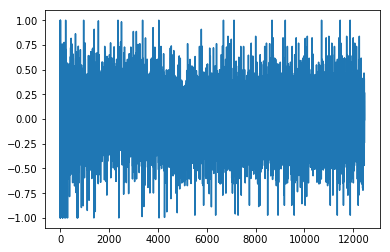

623
0.828232392111
[ 1.          0.88888889  1.          1.          0.88888889  0.11111111
  0.88888889  0.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.77777778  0.77777778  0.66666667  0.55555556  0.88888889
  0.55555556  0.          0.55555556  0.          0.44444444  0.
  0.44444444  0.22222222  0.55555556  0.66666667  0.66666667  1.          1.
  1.          1.          0.33333333  1.          1.          1.          1.
  0.11111111  0.88888889  1.          1.          0.88888889  1.          1.
  1.          1.          1.          1.          1.          0.22222222]
Writing away results
2006-12-01 00:00:00


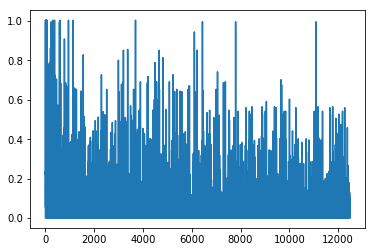

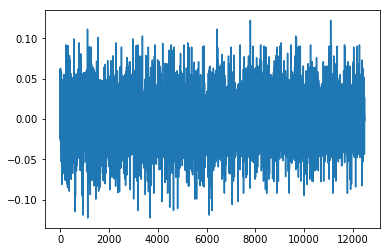

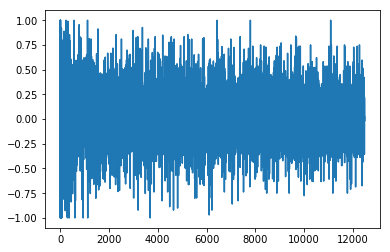

624
0.726993065199
[ 0.66666667  0.          0.66666667  0.66666667  1.          0.66666667
  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.11111111  0.11111111  0.22222222  0.22222222
  0.66666667  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.          0.66666667  1.
  0.55555556  0.66666667  0.66666667  0.66666667  0.33333333  0.66666667
  0.66666667  0.66666667  0.66666667  0.44444444  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.33333333]
Writing away results
2007-01-01 00:00:00


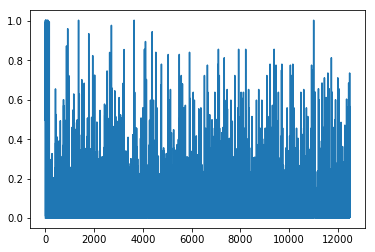

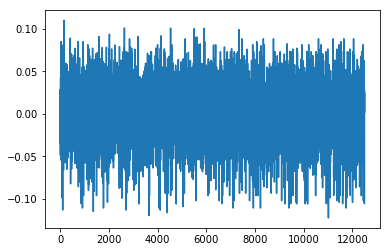

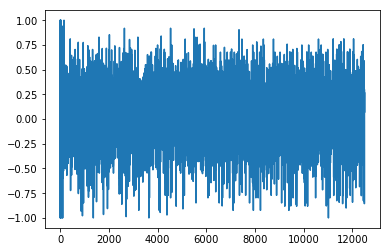

625
0.742984852365
[ 0.55555556  0.33333333  0.          0.22222222  0.33333333  0.88888889
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.22222222  0.88888889  0.33333333  0.44444444  0.          0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.77777778
  0.33333333  0.88888889  0.          0.88888889  1.          0.          0.
  0.          0.55555556  0.          0.          0.          0.
  0.33333333  0.          0.          0.88888889  0.55555556  0.          0.
  0.          0.          0.          0.          0.          0.
  0.55555556  0.        ]
Writing away results
2007-02-01 00:00:00


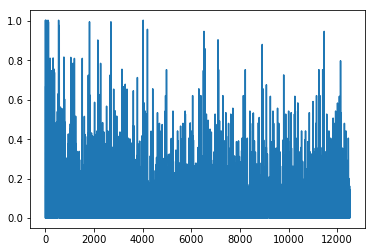

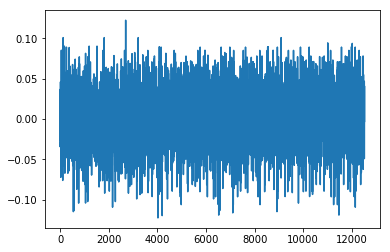

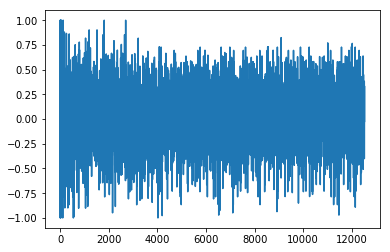

626
0.639064110814
[ 0.55555556  0.88888889  0.22222222  0.77777778  1.          0.77777778
  0.77777778  0.88888889  0.77777778  0.66666667  0.77777778  0.77777778
  0.77777778  0.88888889  0.88888889  0.77777778  0.77777778  0.77777778
  0.          0.          1.          0.44444444  1.          0.44444444
  0.          0.          0.          0.          0.          0.
  0.33333333  1.          0.77777778  0.44444444  1.          0.88888889
  0.77777778  0.77777778  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.77777778  0.88888889  0.77777778  0.77777778  0.66666667
  0.77777778  0.77777778  0.77777778  0.77777778  0.66666667  0.66666667
  0.77777778  0.77777778  0.33333333  0.88888889  0.88888889]
Writing away results
2007-03-01 00:00:00


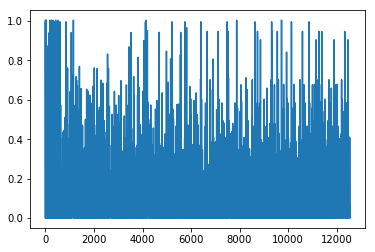

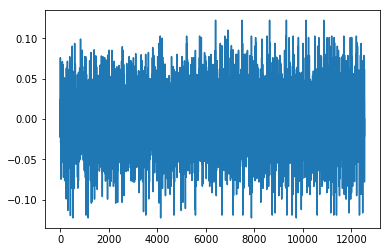

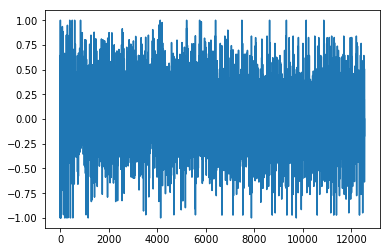

627
0.646272466914
[ 0.66666667  0.44444444  0.66666667  0.77777778  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.77777778  0.66666667  0.66666667
  0.66666667  0.          0.22222222  0.55555556  0.55555556  0.11111111
  0.66666667  0.77777778  0.55555556  0.33333333  0.77777778  1.
  0.88888889  0.66666667  1.          1.          1.          0.77777778
  1.          1.          1.          1.          0.88888889  1.          1.
  0.66666667  0.66666667  1.          1.          1.          1.          1.
  1.          1.          1.          0.66666667  1.          1.          1.        ]
Writing away results
2007-04-01 00:00:00


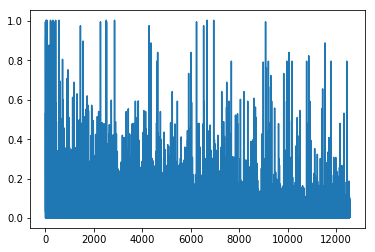

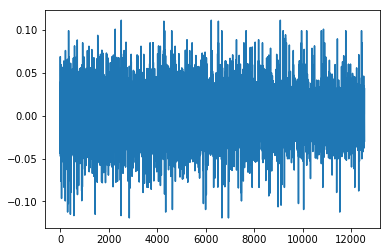

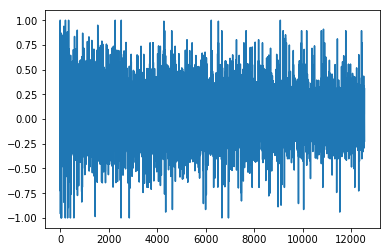

628
0.744849426697
[ 0.44444444  1.          0.          0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.          0.11111111
  0.44444444  0.          1.          0.44444444  0.          0.
  0.11111111  0.          0.          0.          0.          0.
  0.33333333  0.44444444  0.11111111  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  1.          0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.44444444  0.33333333  0.33333333  0.33333333  0.33333333]
Writing away results
2007-05-01 00:00:00


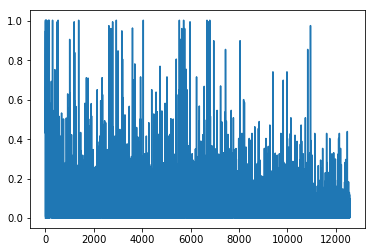

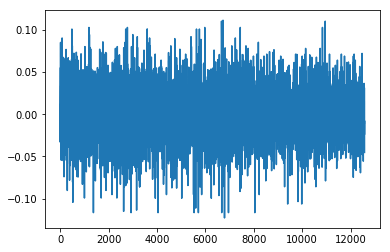

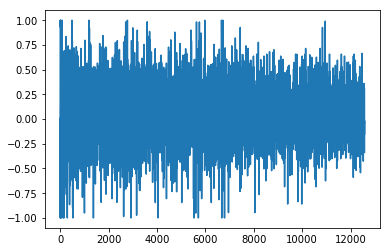

629
0.830686168023
[ 0.44444444  0.          0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.11111111  0.11111111  0.66666667
  0.88888889  0.66666667  0.77777778  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.          0.22222222
  0.22222222  0.88888889  0.22222222  0.22222222  0.22222222  0.88888889
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  1.          0.33333333  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222]
Writing away results
2007-06-01 00:00:00


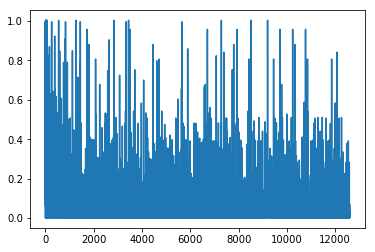

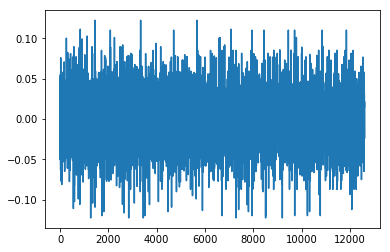

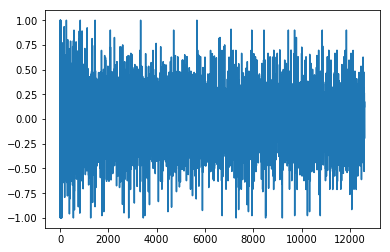

630
0.879298133806
[ 0.44444444  0.22222222  0.22222222  0.33333333  0.          0.22222222
  0.          0.22222222  0.22222222  0.22222222  0.77777778  0.77777778
  0.77777778  0.          1.          0.44444444  0.22222222  0.44444444
  0.11111111  0.66666667  1.          1.          0.44444444  0.88888889
  0.44444444  1.          1.          0.44444444  0.          0.22222222
  0.88888889  0.33333333  0.          0.22222222  0.11111111  0.22222222
  0.22222222  0.33333333  0.22222222  0.22222222  0.22222222  0.22222222
  0.33333333  0.77777778  0.22222222  0.22222222  0.          0.77777778
  0.77777778  0.          0.22222222  0.22222222  0.11111111  0.22222222
  0.22222222  0.22222222  0.          0.22222222  0.33333333]
Writing away results
2007-07-01 00:00:00


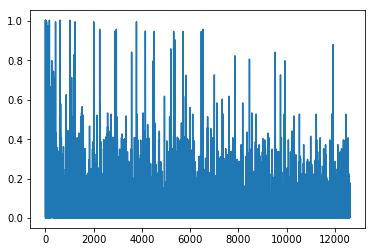

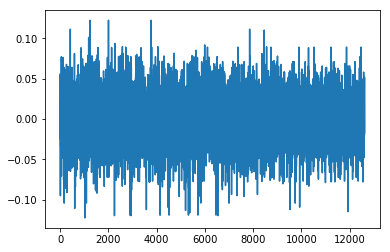

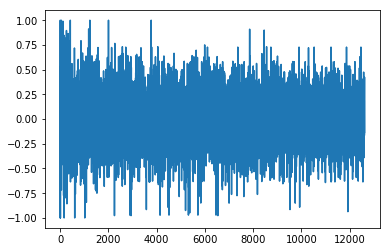

631
0.691683082032
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.44444444
  0.44444444  0.55555556  0.55555556  0.55555556  0.55555556  1.
  0.88888889  0.22222222  0.22222222  0.55555556  0.55555556  0.22222222
  0.11111111  0.55555556  0.77777778  0.66666667  0.66666667  0.
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.44444444  0.44444444  0.66666667  0.66666667
  0.66666667  1.          0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2007-08-01 00:00:00


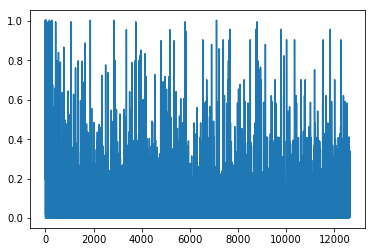

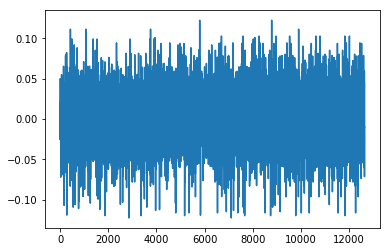

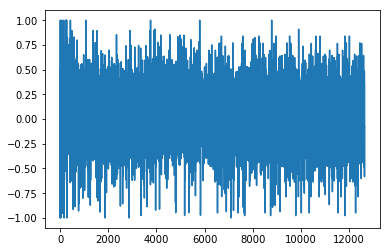

632
0.763814477617
[ 1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.55555556
  0.22222222  0.88888889  0.          0.88888889  0.          0.22222222
  0.22222222  0.22222222  0.66666667  0.          0.          0.88888889
  0.66666667  0.55555556  0.88888889  0.88888889  1.          1.
  0.55555556  0.44444444  0.77777778  1.          1.          1.          0.
  0.88888889  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.77777778  0.11111111
  1.          1.          1.          1.          1.          1.          1.
  1.        ]
Writing away results
2007-09-01 00:00:00


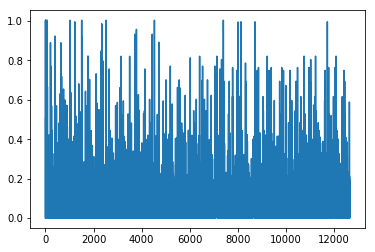

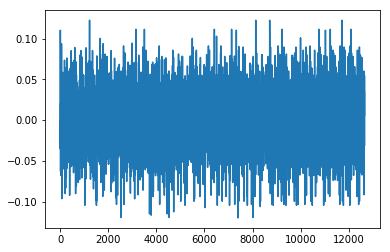

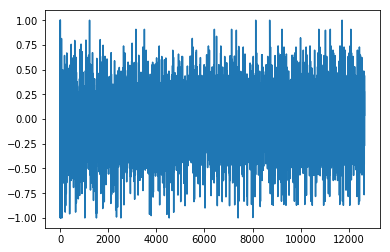

633
0.687015696767
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.33333333
  0.33333333  0.33333333  0.33333333  0.55555556  0.77777778  0.77777778
  0.77777778  0.44444444  0.44444444  0.77777778  1.          0.77777778
  0.11111111  0.88888889  1.          0.66666667  0.88888889  0.88888889
  0.88888889  1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  1.          0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
2007-10-01 00:00:00


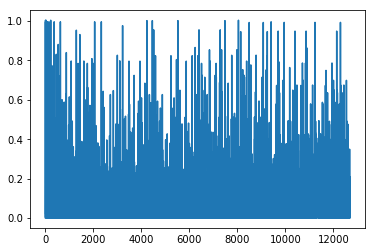

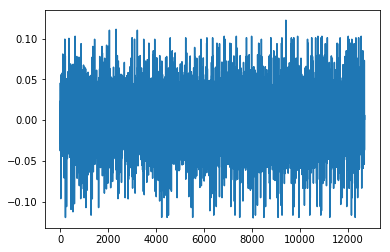

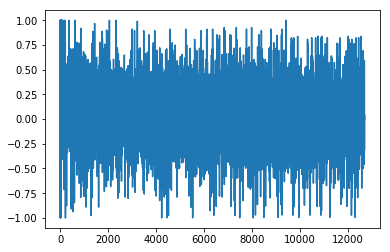

634
0.674377216274
[ 1.          0.55555556  1.          1.          1.          1.
  0.55555556  0.55555556  0.55555556  0.22222222  0.33333333  0.33333333
  1.          0.66666667  0.22222222  0.66666667  0.66666667  0.33333333
  0.66666667  0.66666667  0.77777778  0.11111111  0.88888889  0.66666667
  1.          1.          0.          0.55555556  1.          0.55555556
  1.          1.          0.55555556  1.          1.          0.55555556
  1.          1.          0.55555556  1.          1.          0.55555556
  1.          1.          0.55555556  1.          1.          1.          1.
  1.          0.55555556  0.55555556  1.          0.55555556  0.55555556
  1.          1.          1.          1.        ]
Writing away results
2007-11-01 00:00:00


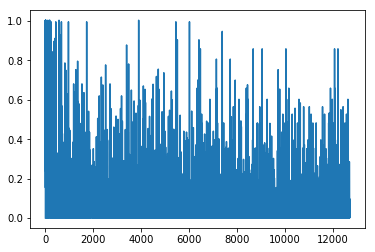

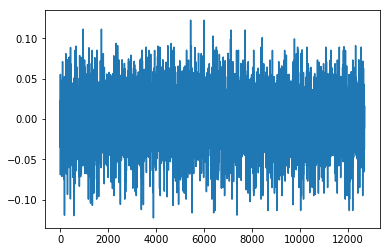

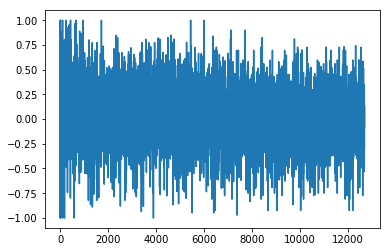

635
0.760382075276
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.77777778  0.55555556  1.          0.
  0.66666667  0.22222222  0.22222222  0.77777778  0.55555556  0.55555556
  0.77777778  0.          1.          1.          0.66666667  0.88888889
  1.          0.66666667  0.66666667  0.66666667  0.77777778  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2007-12-01 00:00:00


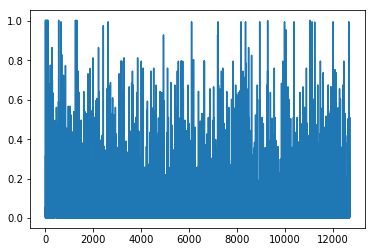

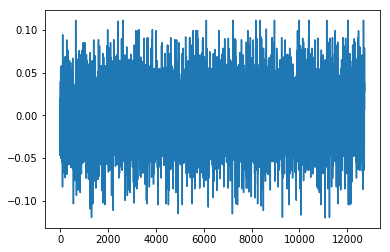

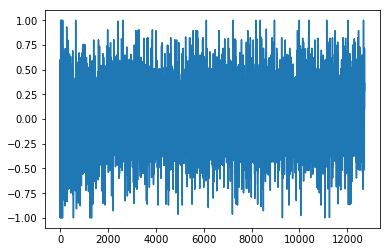

636
0.699555403179
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.55555556  0.22222222  0.33333333  0.11111111
  0.88888889  0.55555556  0.11111111  0.11111111  0.11111111  0.22222222
  0.11111111  0.11111111  0.22222222  0.11111111  0.88888889  0.88888889
  0.11111111  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.          0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
2008-01-01 00:00:00


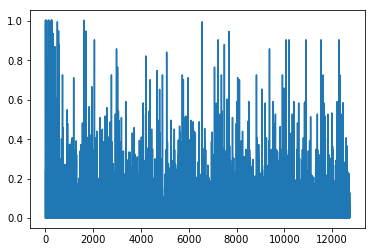

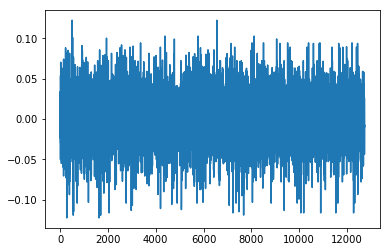

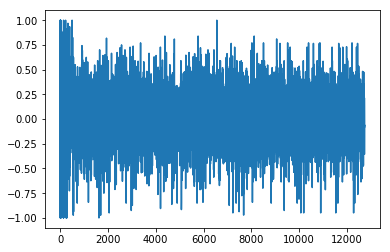

637
0.612235973285
[ 0.88888889  0.88888889  0.88888889  1.          1.          0.66666667
  0.66666667  0.33333333  0.          0.88888889  0.44444444  0.33333333
  0.55555556  0.22222222  0.55555556  0.55555556  0.77777778  0.44444444
  0.11111111  0.88888889  0.55555556  0.66666667  0.11111111  0.11111111
  1.          0.66666667  0.66666667  0.          1.          1.          1.
  1.          0.88888889  1.          0.88888889  0.44444444  0.11111111
  0.88888889  0.88888889  1.          0.11111111  0.66666667  1.
  0.66666667  0.          0.44444444  1.          1.          1.
  0.66666667  1.          0.66666667  0.66666667  0.88888889  0.88888889
  1.          0.66666667  1.          1.        ]
Writing away results
2008-02-01 00:00:00


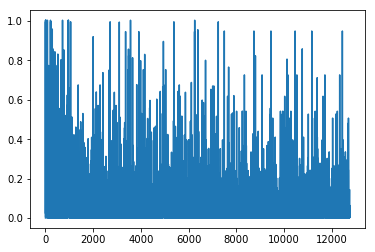

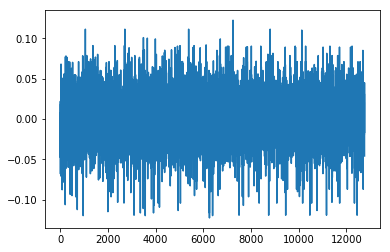

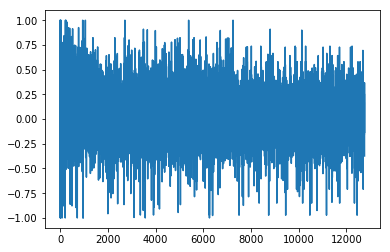

638
0.583351629851
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.          0.33333333  0.33333333  1.          0.88888889  0.44444444
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444
  1.          0.44444444  0.88888889  0.22222222  0.          0.66666667
  0.66666667  0.66666667  0.33333333  0.66666667  0.66666667  0.66666667
  0.66666667  0.11111111  0.66666667  0.66666667  0.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.88888889  0.88888889  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2008-03-01 00:00:00


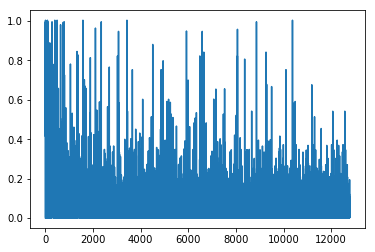

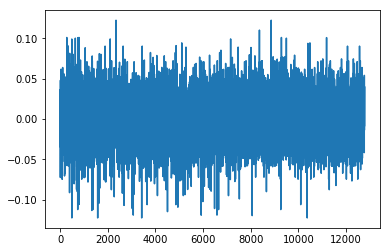

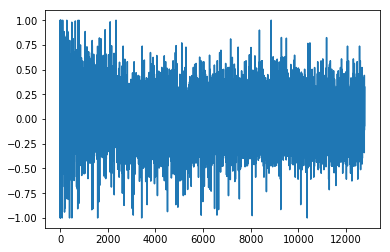

639
0.743923682202
[ 0.66666667  0.66666667  0.66666667  0.33333333  0.33333333  0.11111111
  0.22222222  0.77777778  0.77777778  0.          0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.55555556  0.77777778
  0.11111111  0.66666667  0.22222222  1.          0.33333333  0.33333333
  0.22222222  0.33333333  0.66666667  0.66666667  0.66666667  0.66666667
  0.          0.33333333  0.66666667  0.22222222  0.33333333  0.33333333
  0.66666667  0.66666667  1.          1.          0.33333333  0.66666667
  0.77777778  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  1.          0.33333333  0.33333333  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2008-04-01 00:00:00


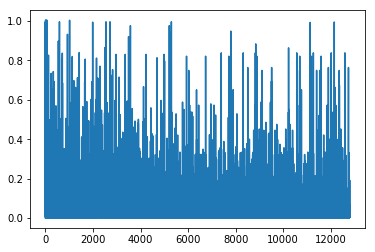

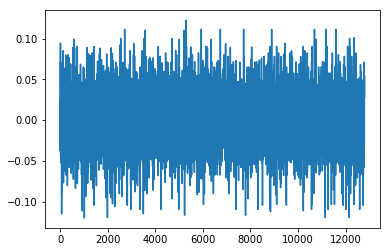

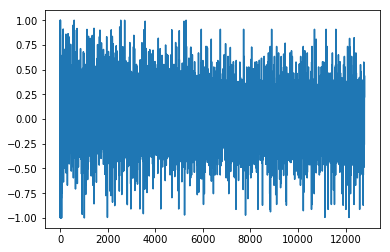

640
0.591428621979
[ 0.88888889  0.88888889  0.88888889  0.22222222  0.33333333  0.33333333
  0.77777778  0.11111111  1.          0.11111111  0.33333333  0.33333333
  0.33333333  0.22222222  0.33333333  0.44444444  0.77777778  1.
  0.88888889  0.88888889  0.77777778  0.55555556  0.88888889  0.66666667
  0.22222222  0.88888889  0.88888889  0.88888889  0.11111111  0.11111111
  0.88888889  0.88888889  0.88888889  0.77777778  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.55555556  0.88888889  0.22222222
  0.22222222  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
2008-05-01 00:00:00


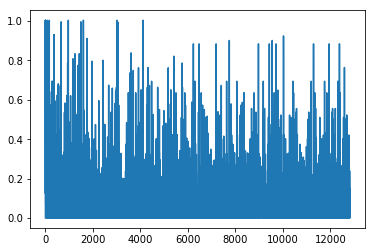

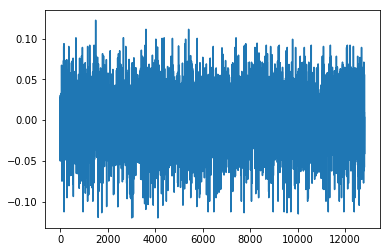

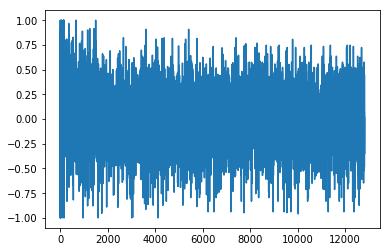

641
0.631964343639
[ 0.66666667  0.66666667  0.66666667  0.          0.22222222  0.
  0.77777778  0.11111111  0.11111111  1.          0.11111111  0.88888889
  0.          0.77777778  0.88888889  0.11111111  0.77777778  0.
  0.44444444  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.33333333  0.33333333  0.66666667
  0.66666667  0.55555556  0.33333333  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2008-06-01 00:00:00


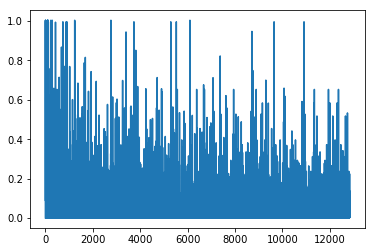

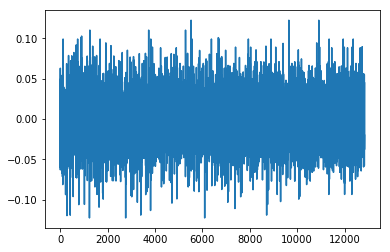

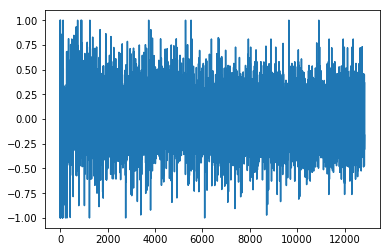

642
0.535200411167
[ 0.66666667  0.22222222  0.77777778  0.77777778  0.          0.55555556
  0.66666667  0.33333333  0.55555556  0.77777778  0.44444444  0.33333333
  0.          0.77777778  0.44444444  0.44444444  0.66666667  0.66666667
  1.          0.66666667  0.66666667  0.66666667  0.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2008-07-01 00:00:00


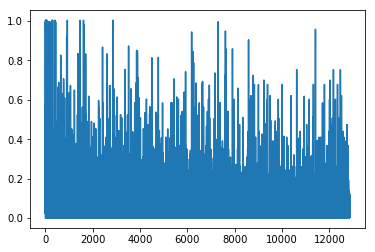

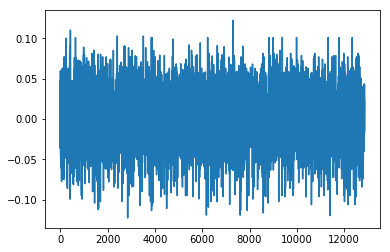

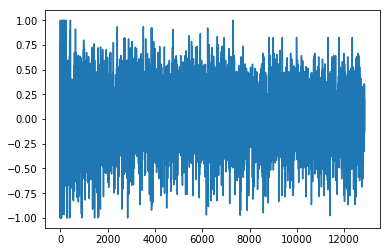

643
0.753513680661
[ 0.11111111  0.66666667  0.88888889  0.88888889  0.88888889  0.55555556
  0.          0.66666667  0.          0.22222222  1.          0.88888889
  0.33333333  0.66666667  0.88888889  0.11111111  1.          1.
  0.77777778  0.11111111  0.11111111  0.33333333  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.77777778  0.77777778  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.33333333  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111]
Writing away results
2008-08-01 00:00:00


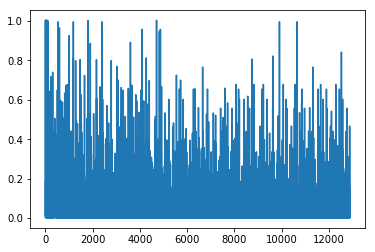

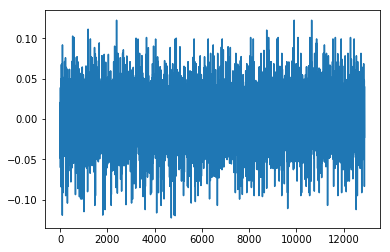

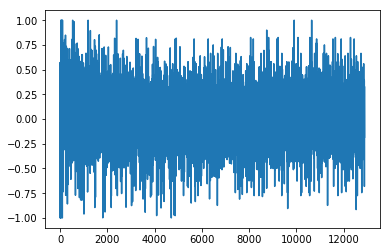

644
0.536619328545
[ 0.          0.11111111  0.11111111  0.77777778  0.22222222  0.66666667
  0.22222222  0.88888889  0.22222222  0.          0.77777778  0.88888889
  0.          0.22222222  0.66666667  0.55555556  0.77777778  0.66666667
  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.33333333  0.11111111
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.77777778  0.55555556  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2008-09-01 00:00:00


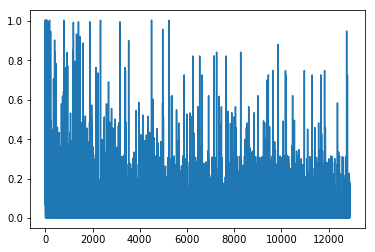

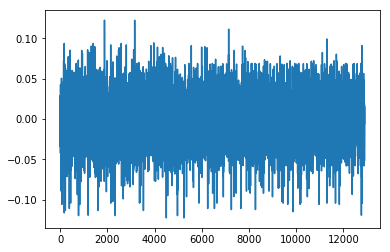

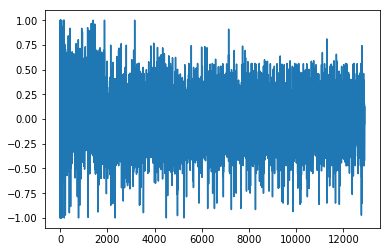

645
0.613491136436
[ 0.44444444  0.55555556  0.11111111  0.55555556  0.33333333  0.33333333
  0.44444444  0.44444444  0.44444444  0.44444444  0.77777778  0.33333333
  0.66666667  0.11111111  0.33333333  0.77777778  0.88888889  0.22222222
  0.22222222  0.66666667  0.22222222  0.11111111  0.11111111  0.22222222
  0.88888889  0.11111111  0.11111111  0.22222222  0.88888889  0.88888889
  0.11111111  0.11111111  0.88888889  0.88888889  0.22222222  0.22222222
  0.          0.22222222  0.11111111  0.11111111  0.11111111  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.11111111
  0.22222222  0.88888889  0.11111111  0.11111111  0.88888889  0.88888889
  0.88888889  0.22222222  0.22222222  0.88888889  0.88888889]
Writing away results
2008-10-01 00:00:00


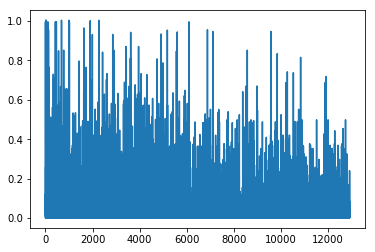

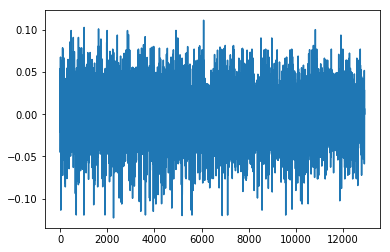

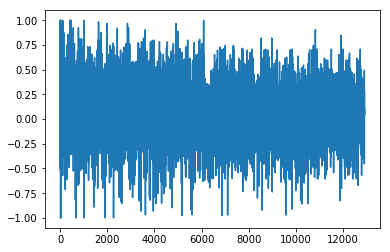

646
0.803128715939
[ 0.33333333  0.55555556  0.11111111  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.11111111
  0.          0.66666667  0.77777778  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.77777778  0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.        ]
Writing away results
2008-11-01 00:00:00


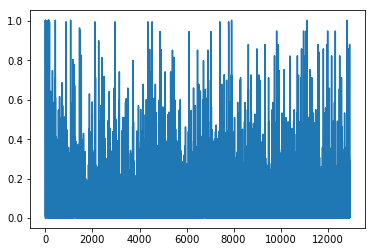

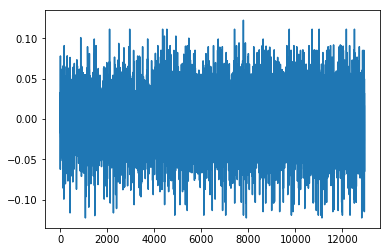

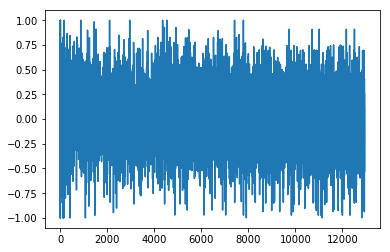

647
0.474024777192
[ 0.44444444  0.88888889  0.66666667  0.44444444  1.          0.          1.
  1.          0.77777778  0.          1.          0.88888889  0.77777778
  0.88888889  0.88888889  0.88888889  0.22222222  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.22222222  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
2008-12-01 00:00:00


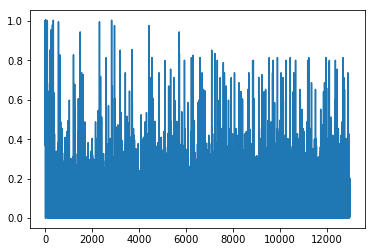

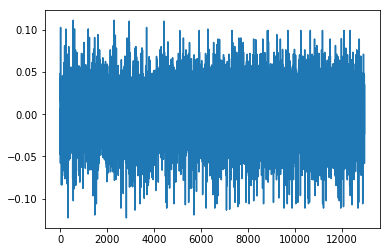

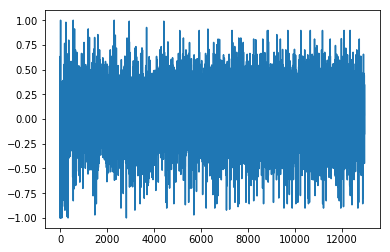

648
0.521663713297
[ 0.66666667  1.          0.88888889  0.88888889  0.88888889  0.33333333
  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667
  0.22222222  0.66666667  0.66666667  0.66666667  0.44444444  0.66666667
  0.66666667  0.66666667  0.66666667  1.          0.66666667  0.66666667
  0.66666667  0.44444444  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2009-01-01 00:00:00


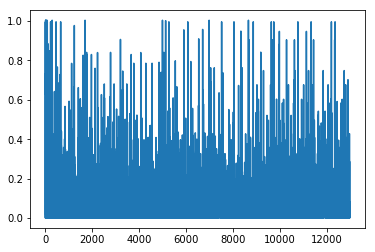

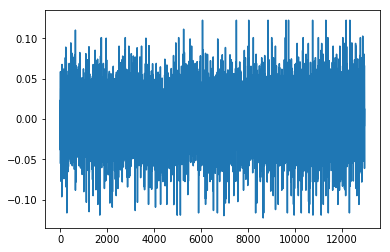

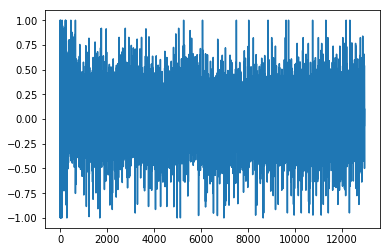

649
0.451650130141
[ 0.77777778  0.77777778  0.88888889  0.33333333  0.33333333  0.77777778
  0.33333333  0.11111111  0.77777778  1.          1.          0.77777778
  0.44444444  1.          0.11111111  0.88888889  1.          1.          1.
  1.          1.          0.66666667  1.          1.          0.55555556
  0.66666667  1.          1.          1.          1.          0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.        ]
Writing away results
2009-02-01 00:00:00


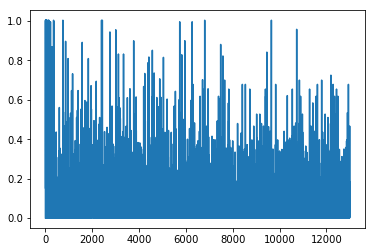

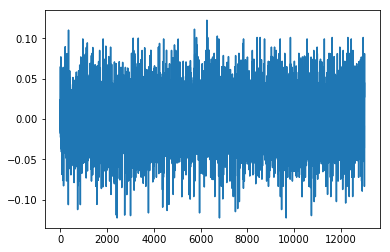

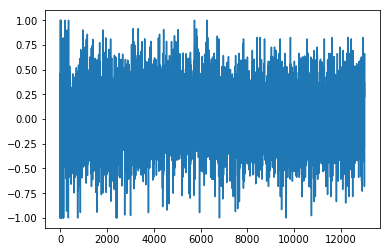

650
0.50745712308
[ 0.33333333  0.88888889  0.33333333  0.88888889  0.88888889  0.33333333
  0.88888889  0.55555556  0.66666667  1.          0.55555556  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2009-03-01 00:00:00


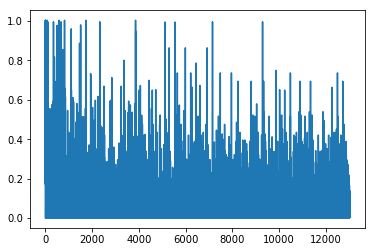

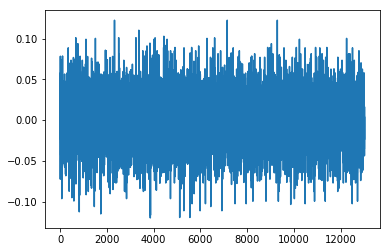

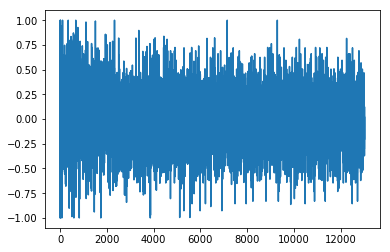

651
0.454134024882
[ 0.88888889  0.44444444  0.22222222  0.88888889  0.11111111  0.55555556
  0.11111111  1.          0.66666667  0.22222222  0.          0.66666667
  0.66666667  0.44444444  0.66666667  0.66666667  0.77777778  0.66666667
  0.33333333  0.66666667  0.66666667  0.66666667  1.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.77777778  0.66666667  0.33333333  0.33333333  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2009-04-01 00:00:00


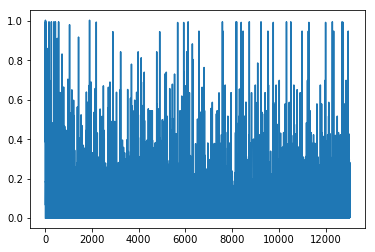

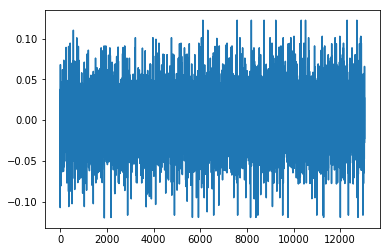

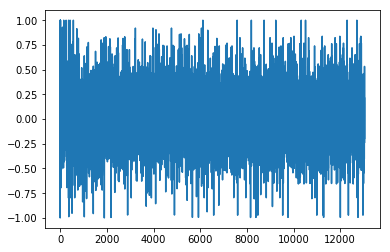

652
0.452859483978
[ 0.11111111  0.55555556  0.44444444  0.44444444  0.77777778  0.44444444
  1.          0.55555556  0.66666667  1.          1.          1.
  0.44444444  1.          0.66666667  0.88888889  1.          1.          1.
  1.          1.          0.33333333  1.          1.          1.          1.
  0.66666667  0.88888889  1.          0.22222222  0.          0.66666667
  0.88888889  1.          1.          1.          1.          1.
  0.66666667  0.66666667  1.          1.          1.          1.          1.
  1.          0.66666667  1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.66666667  1.          1.        ]
Writing away results
2009-05-01 00:00:00


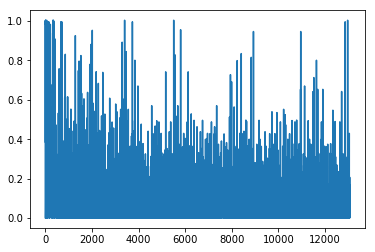

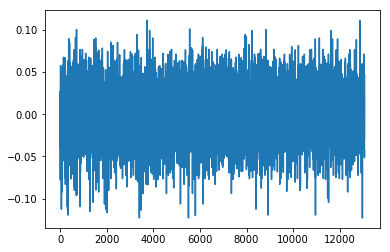

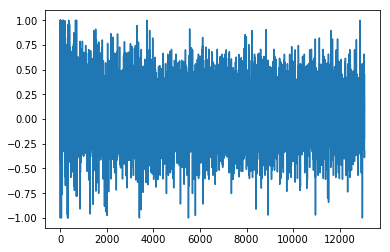

653
0.536967778701
[ 0.55555556  0.          0.55555556  0.          0.55555556  0.66666667
  0.66666667  0.88888889  0.66666667  0.66666667  0.66666667  1.
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.11111111  0.11111111
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
2009-06-01 00:00:00


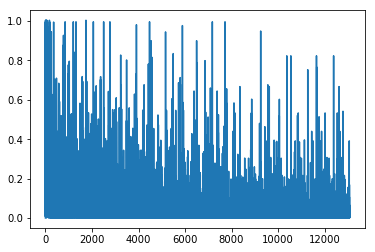

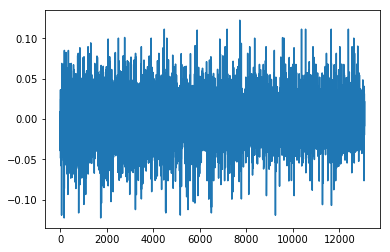

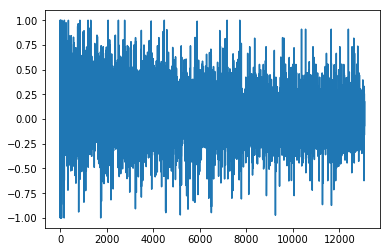

654
0.692877671097
[ 0.22222222  0.22222222  0.22222222  0.22222222  0.          0.
  0.22222222  0.88888889  0.          0.          0.88888889  0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.88888889  0.          0.
  0.          0.88888889  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.        ]
Writing away results
2009-07-01 00:00:00


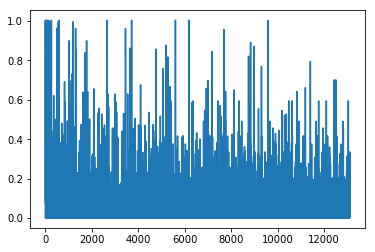

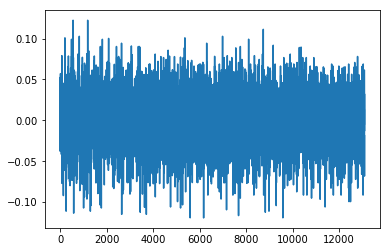

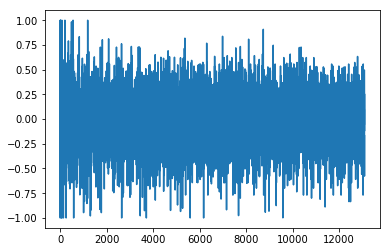

655
0.545364135469
[ 0.55555556  0.77777778  0.66666667  0.11111111  0.11111111  0.33333333
  0.33333333  0.          0.88888889  0.44444444  0.33333333  0.
  0.33333333  0.          0.88888889  0.66666667  0.11111111  0.11111111
  0.44444444  0.44444444  0.          0.44444444  0.11111111  0.88888889
  0.          0.88888889  0.44444444  0.66666667  0.          0.
  0.33333333  0.33333333  0.44444444  0.44444444  0.44444444  0.44444444
  0.88888889  0.33333333  0.          0.          0.          0.33333333
  0.33333333  0.88888889  0.          0.          0.33333333  0.44444444
  0.          0.33333333  0.88888889  0.88888889  0.44444444  0.11111111
  0.33333333  0.          0.          0.22222222  0.44444444]
Writing away results
2009-08-01 00:00:00


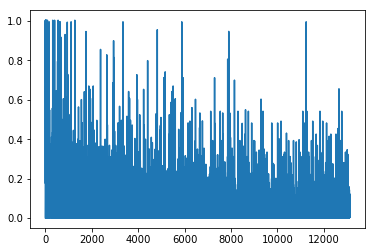

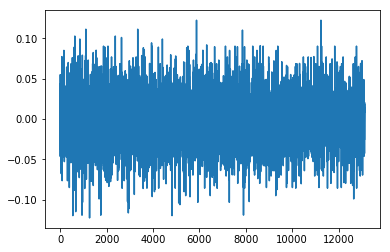

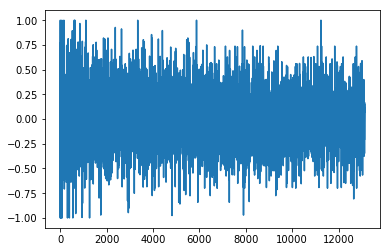

656
0.604413014141
[ 0.33333333  0.33333333  0.44444444  0.88888889  0.          0.11111111
  0.          0.11111111  0.55555556  0.88888889  0.11111111  0.          0.
  0.          0.          0.44444444  0.11111111  0.55555556  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.          0.
  0.11111111  0.88888889  0.88888889  0.11111111  0.11111111  0.11111111
  0.11111111  0.          0.11111111  0.66666667  0.11111111  0.11111111
  0.          0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.          0.11111111  0.88888889  0.11111111  0.11111111
  0.          0.11111111  0.11111111  0.11111111]
Writing away results
2009-09-01 00:00:00


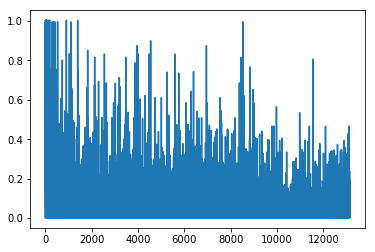

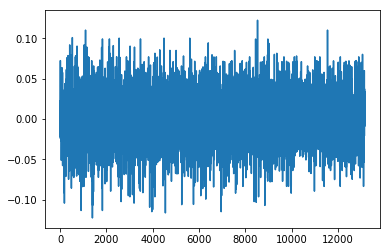

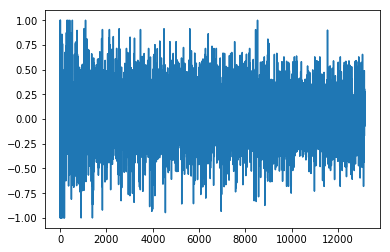

657
0.531822075878
[ 0.33333333  0.44444444  0.55555556  0.22222222  0.55555556  0.55555556
  0.55555556  0.22222222  0.55555556  0.55555556  0.44444444  0.55555556
  0.55555556  0.55555556  0.55555556  0.44444444  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.66666667  0.66666667  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.44444444]
Writing away results
2009-10-01 00:00:00


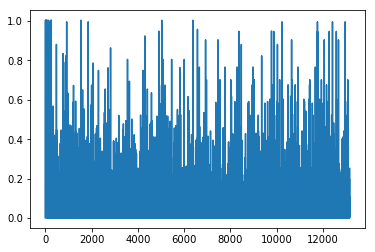

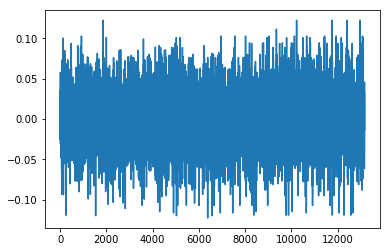

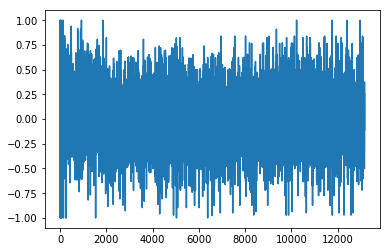

658
0.401004510168
[ 1.          0.44444444  0.33333333  1.          1.          1.
  0.88888889  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.44444444  0.22222222  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.          1.        ]
Writing away results
2009-11-01 00:00:00


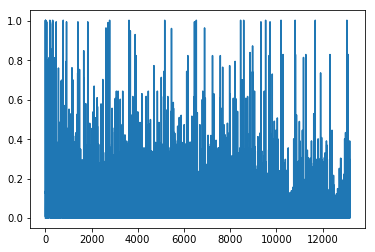

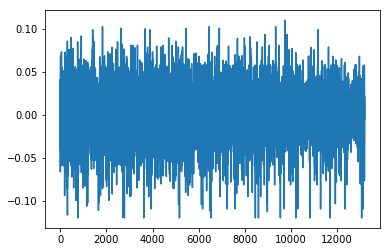

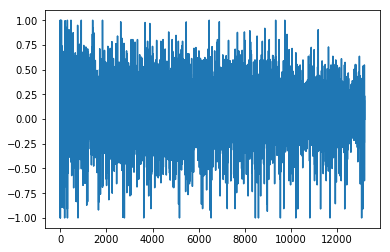

659
0.668130749724
[ 0.22222222  1.          0.22222222  0.22222222  0.22222222  0.77777778
  0.22222222  0.22222222  0.22222222  0.22222222  0.          0.22222222
  0.22222222  0.22222222  0.          0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.77777778
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222]
Writing away results
2009-12-01 00:00:00


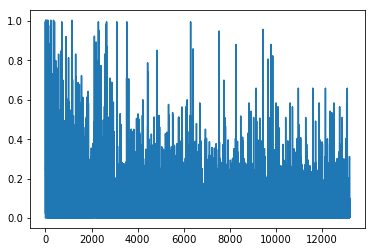

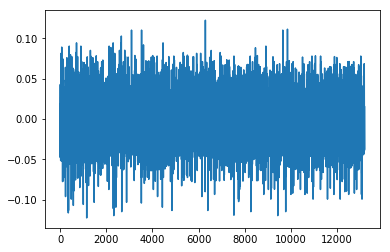

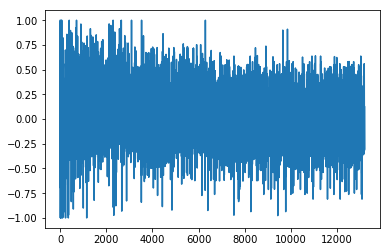

660
0.554306601044
[ 0.11111111  0.55555556  0.          0.22222222  0.33333333  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.          0.66666667
  0.33333333  0.55555556  0.          0.66666667  0.55555556  0.55555556
  0.66666667  0.55555556  0.          0.22222222  0.66666667  0.55555556
  0.66666667  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.55555556  0.66666667  0.66666667  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.          0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.55555556
  0.66666667  0.66666667  0.55555556  0.          0.66666667]
Writing away results
2010-01-01 00:00:00


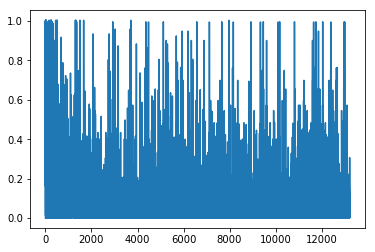

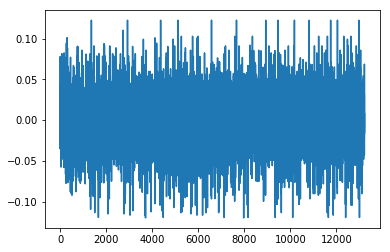

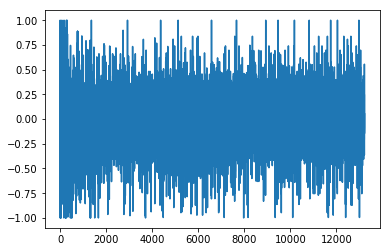

661
0.481819093323
[ 1.          1.          0.88888889  1.          0.66666667  0.88888889
  1.          0.88888889  0.55555556  0.88888889  0.88888889  0.88888889
  0.          0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  1.          0.88888889  0.88888889
  0.88888889  1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  1.          0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667
  1.          1.          0.88888889  1.          0.77777778]
Writing away results
2010-02-01 00:00:00


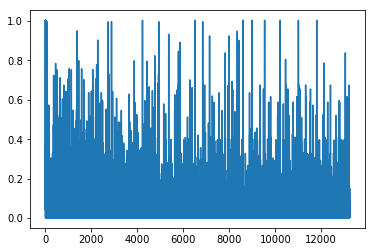

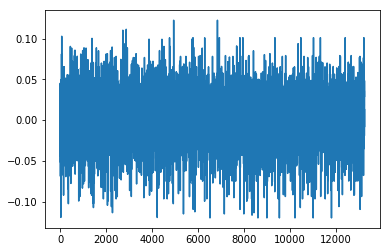

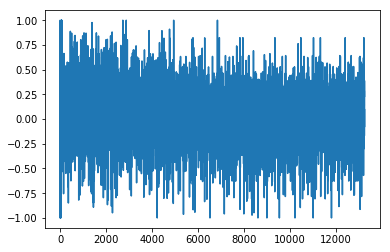

662
0.555617674714
[ 0.55555556  0.55555556  1.          0.22222222  0.55555556  0.22222222
  0.66666667  0.33333333  0.22222222  0.55555556  0.          1.
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.22222222
  0.55555556  0.66666667  0.22222222  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.66666667  0.55555556
  0.66666667  0.66666667  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.66666667  0.66666667  0.55555556  0.66666667  0.55555556
  0.55555556  0.55555556  0.66666667  1.          0.66666667  0.22222222
  0.66666667  0.55555556  0.22222222  0.77777778  1.        ]
Writing away results
2010-03-01 00:00:00


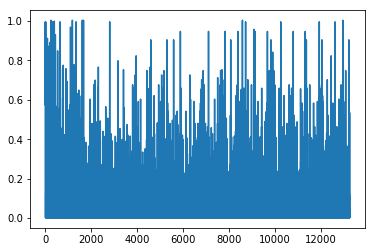

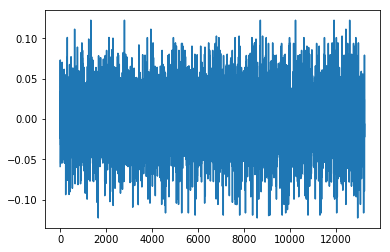

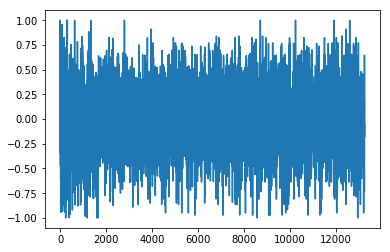

663
0.489751922229
[ 1.          0.33333333  1.          1.          1.          1.          1.
  1.          1.          1.          0.          1.          1.          1.
  1.          1.          1.          1.          1.          0.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.44444444  1.          0.33333333]
Writing away results
2010-04-01 00:00:00


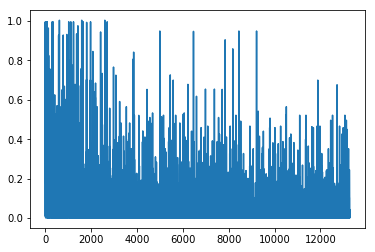

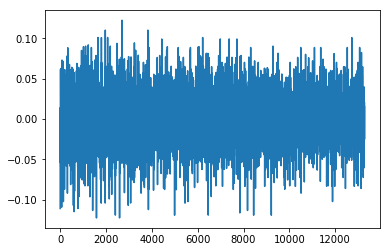

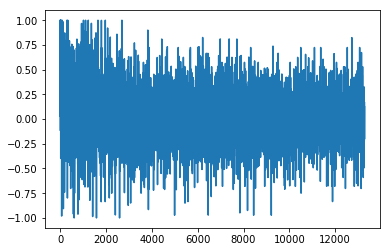

664
0.659343510765
[ 0.33333333  0.33333333  0.44444444  0.33333333  0.33333333  0.44444444
  0.44444444  0.44444444  0.66666667  0.33333333  0.44444444  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.44444444  0.44444444  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.44444444  0.33333333  0.33333333
  0.33333333  0.44444444  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333
  0.33333333  0.33333333  0.33333333  0.33333333  0.44444444  0.33333333
  0.33333333  0.33333333  0.44444444  0.44444444  0.33333333  0.44444444
  0.55555556  0.33333333  0.44444444  0.66666667  1.        ]
Writing away results
2010-05-01 00:00:00


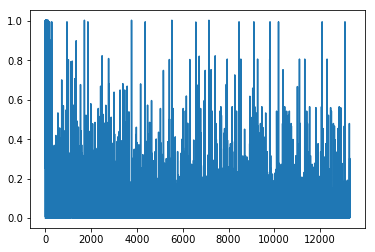

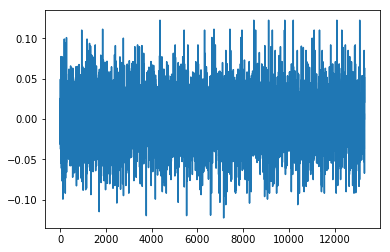

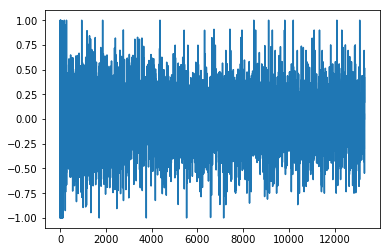

665
0.683347499633
[ 0.11111111  0.11111111  0.11111111  0.11111111  0.55555556  0.22222222
  0.11111111  1.          0.          0.22222222  0.11111111  0.11111111
  0.11111111  0.11111111  0.22222222  0.11111111  0.11111111  1.
  0.11111111  0.11111111  0.11111111  0.11111111  0.22222222  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.22222222  0.11111111
  0.22222222  0.11111111  1.          0.11111111  0.11111111  0.11111111
  0.11111111  0.66666667  0.33333333  0.          0.22222222]
Writing away results
2010-06-01 00:00:00


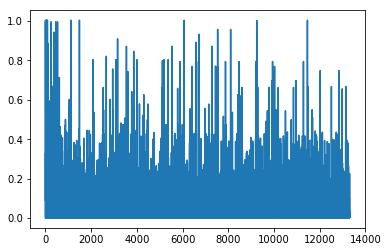

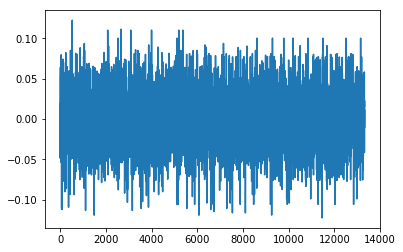

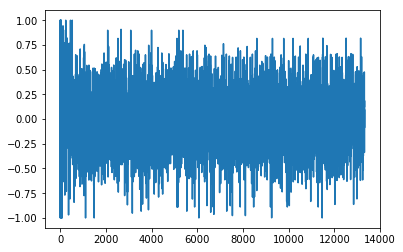

666
0.573107647164
[ 0.22222222  0.77777778  0.22222222  0.22222222  0.77777778  0.77777778
  0.77777778  0.77777778  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.77777778  0.77777778  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.77777778  0.22222222
  0.22222222  0.22222222  0.77777778  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.77777778  0.22222222
  0.77777778  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.77777778  0.77777778  0.77777778  0.22222222  0.33333333  1.
  0.55555556  0.66666667  1.          0.22222222  0.66666667]
Writing away results
2010-07-01 00:00:00


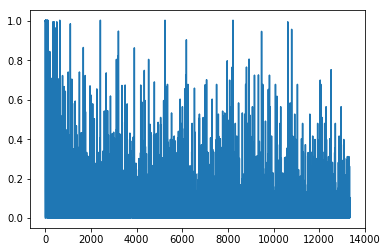

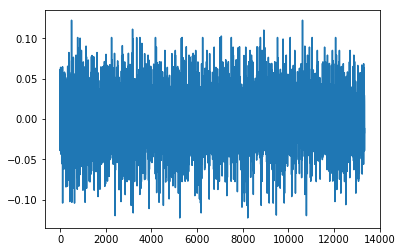

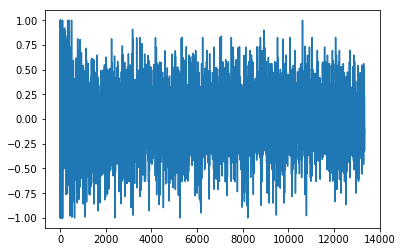

667
0.590320514461
[ 0.66666667  0.66666667  0.44444444  0.44444444  0.44444444  0.33333333
  0.66666667  0.44444444  0.44444444  0.66666667  0.66666667  0.66666667
  0.44444444  0.44444444  1.          0.55555556  0.66666667  0.66666667
  0.66666667  0.44444444  0.44444444  0.44444444  0.44444444  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.44444444  0.66666667  0.44444444  0.66666667  0.66666667
  0.66666667  0.66666667  0.44444444  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.44444444  0.44444444  1.
  0.33333333  0.66666667  0.66666667  0.33333333  1.          0.44444444
  0.22222222  0.77777778  0.44444444  1.          0.        ]
Writing away results
2010-08-01 00:00:00


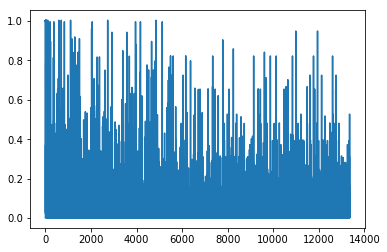

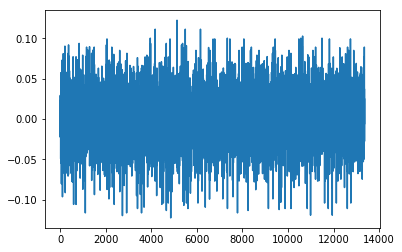

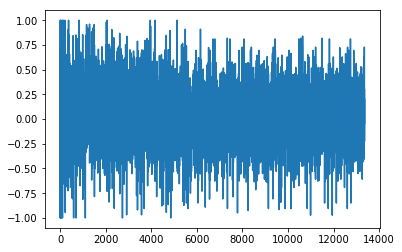

668
0.513239040269
[ 0.66666667  0.          0.66666667  0.66666667  0.66666667  0.33333333
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.          0.66666667  0.55555556  0.22222222
  0.44444444  0.33333333  0.88888889  0.11111111  0.77777778]
Writing away results
2010-09-01 00:00:00


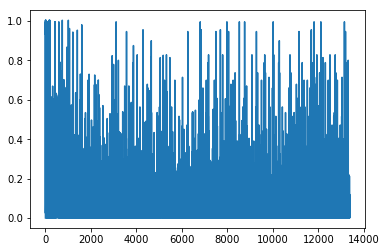

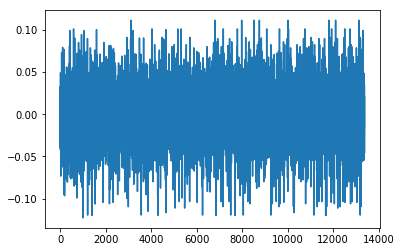

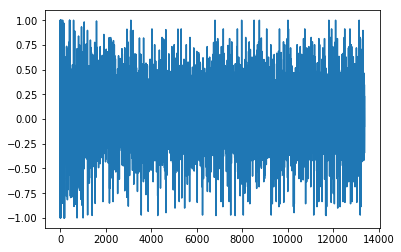

669
0.450629463225
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.11111111  0.66666667  0.22222222  0.33333333
  0.66666667  0.22222222  0.55555556  0.55555556  0.33333333]
Writing away results
2010-10-01 00:00:00


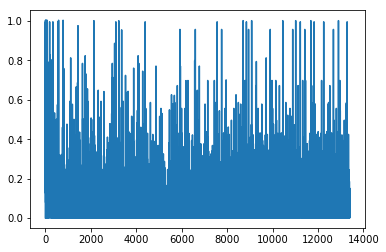

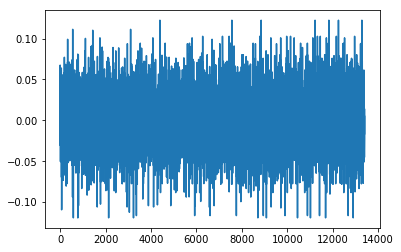

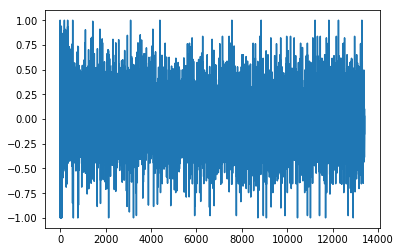

670
0.453445451835
[ 1.          1.          1.          0.88888889  1.          1.          1.
  1.          1.          1.          1.          1.          0.22222222
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.22222222  1.          0.44444444  0.55555556  0.11111111  1.
  0.55555556  0.33333333  0.44444444  0.88888889  0.33333333]
Writing away results
2010-11-01 00:00:00


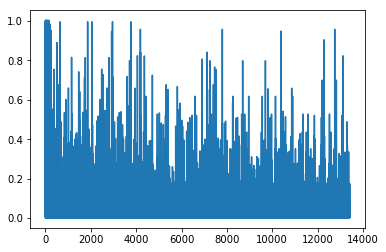

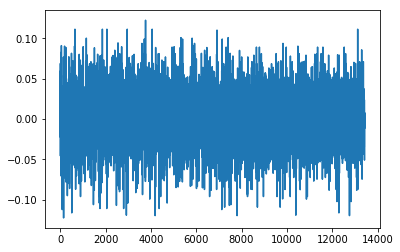

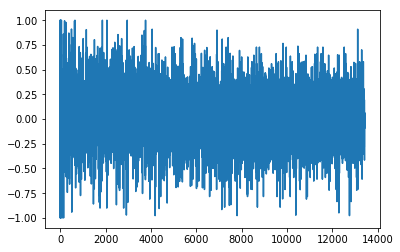

671
0.54596030195
[ 0.66666667  0.33333333  0.66666667  0.11111111  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.44444444
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667  0.33333333
  0.66666667  1.          0.33333333  0.          0.          0.33333333
  0.44444444  0.88888889  0.33333333  0.55555556  0.22222222]
Writing away results
2010-12-01 00:00:00


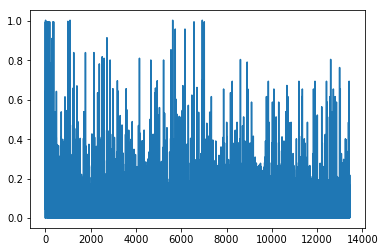

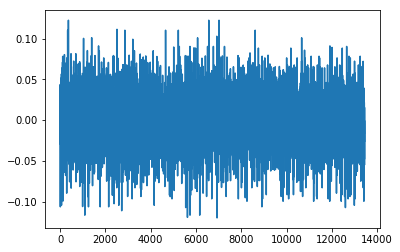

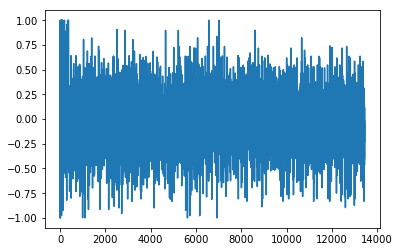

672
0.781204152489
[ 0.11111111  0.          0.66666667  0.11111111  0.11111111  0.
  0.66666667  0.66666667  0.33333333  0.55555556  0.33333333  0.33333333
  0.66666667  0.66666667  0.          0.          0.11111111  0.          0.
  0.33333333  0.33333333  0.33333333  0.66666667  0.66666667  0.11111111
  0.          0.66666667  0.66666667  0.33333333  0.          0.66666667
  0.66666667  0.11111111  0.33333333  0.33333333  0.66666667  0.33333333
  0.66666667  0.66666667  0.66666667  0.11111111  0.          0.55555556
  0.66666667  0.22222222  0.66666667  0.66666667  0.55555556  0.
  0.44444444  0.11111111  0.          0.44444444  0.77777778  0.44444444
  0.44444444  0.77777778  1.          0.77777778]
Writing away results
2011-01-01 00:00:00


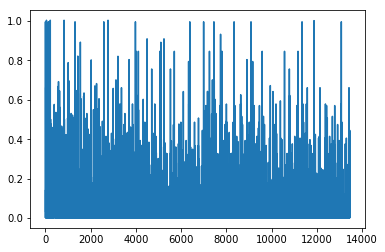

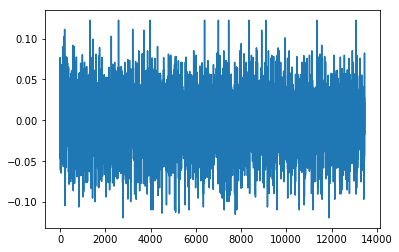

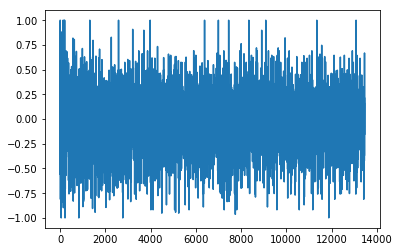

673
0.665473048899
[ 0.77777778  0.11111111  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.55555556  0.55555556  0.22222222  0.22222222
  0.22222222  0.11111111  0.22222222  0.22222222  1.          0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.11111111  0.22222222  0.11111111  0.11111111  0.22222222
  0.55555556  1.          0.11111111  0.22222222  0.77777778  0.11111111
  0.44444444  0.88888889  0.44444444  0.44444444  0.88888889  0.
  0.77777778  0.          0.22222222  0.88888889  0.33333333]
Writing away results
2011-02-01 00:00:00


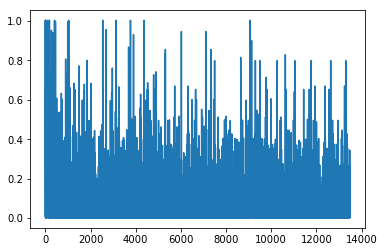

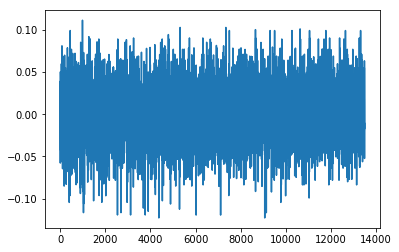

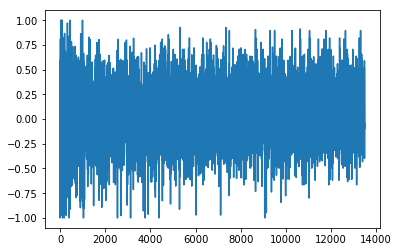

674
0.584244166584
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889  0.77777778
  0.11111111  0.55555556  0.22222222  0.11111111  0.44444444  1.
  0.11111111  0.66666667  0.22222222  0.11111111  0.22222222]
Writing away results
2011-03-01 00:00:00


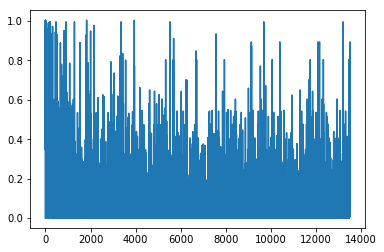

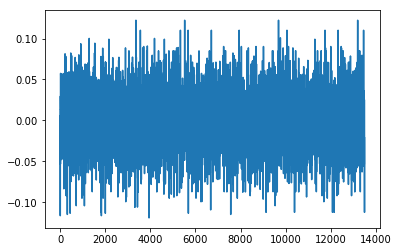

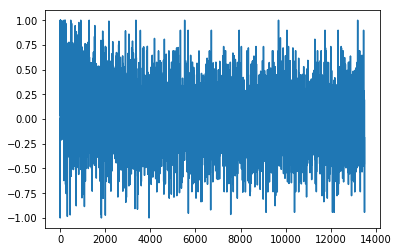

675
0.70587515801
[ 0.66666667  0.22222222  0.22222222  0.22222222  0.66666667  0.55555556
  0.22222222  0.22222222  0.22222222  0.55555556  0.55555556  0.55555556
  0.55555556  0.66666667  0.22222222  0.66666667  0.66666667  0.22222222
  0.55555556  0.55555556  0.22222222  0.22222222  0.55555556  0.22222222
  0.66666667  0.55555556  0.22222222  0.22222222  0.22222222  0.55555556
  0.55555556  0.66666667  0.66666667  0.22222222  0.22222222  0.55555556
  0.55555556  0.55555556  0.66666667  0.66666667  0.22222222  0.22222222
  0.55555556  0.22222222  0.44444444  0.44444444  1.          0.33333333
  0.77777778  1.          0.          0.55555556  0.44444444  0.88888889
  0.22222222  1.          0.          0.55555556  0.        ]
Writing away results
2011-04-01 00:00:00


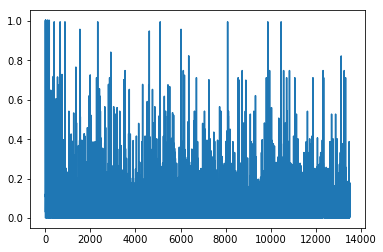

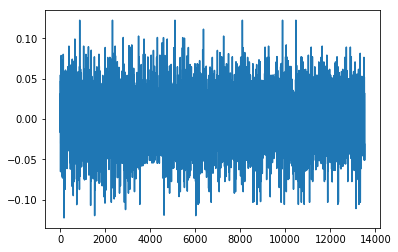

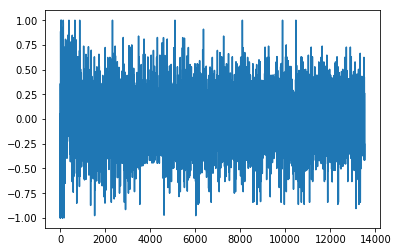

676
0.678595424389
[ 0.77777778  0.77777778  0.77777778  0.44444444  1.          1.
  0.44444444  0.77777778  0.77777778  0.77777778  0.          0.
  0.44444444  0.44444444  0.44444444  0.44444444  0.77777778  0.77777778
  0.77777778  0.44444444  0.77777778  0.77777778  0.77777778  0.44444444
  0.44444444  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778
  0.44444444  0.44444444  0.77777778  0.77777778  0.77777778  0.77777778
  0.44444444  0.88888889  0.44444444  0.77777778  0.66666667  0.77777778
  0.22222222  1.          0.          0.11111111  0.22222222  0.          0.
  0.44444444  0.11111111  0.88888889  0.11111111  0.          0.11111111
  0.33333333  0.44444444  0.11111111  0.11111111]
Writing away results
2011-05-01 00:00:00


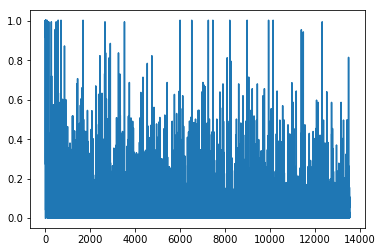

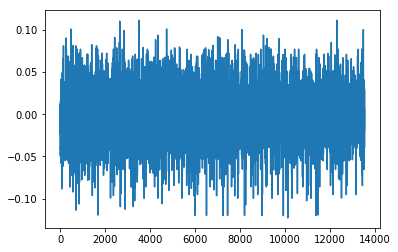

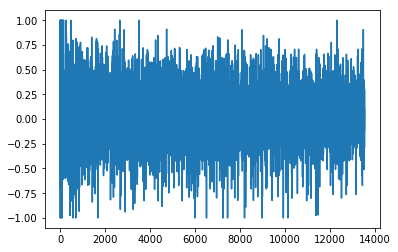

677
0.897106599758
[ 0.11111111  0.11111111  0.11111111  0.11111111  0.33333333  0.
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.33333333  0.11111111  0.88888889  0.55555556  0.11111111  0.88888889
  0.22222222  0.77777778  0.          0.22222222  1.          0.88888889
  0.22222222  0.88888889  0.22222222  0.22222222  0.        ]
Writing away results
2011-06-01 00:00:00


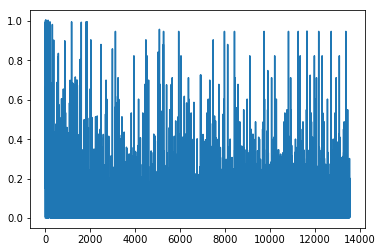

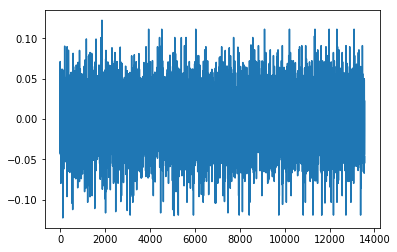

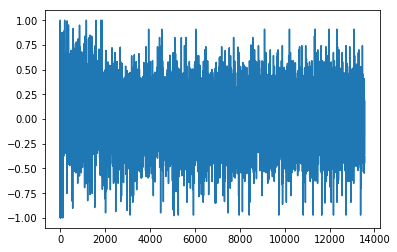

678
0.578195035577
[ 0.88888889  0.88888889  0.88888889  0.22222222  0.11111111  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.22222222  0.88888889  0.88888889  0.88888889  0.88888889
  0.77777778  0.33333333  0.55555556  0.88888889  0.22222222  0.
  0.66666667  0.22222222  0.11111111  0.33333333  0.11111111  0.
  0.55555556  0.11111111  0.11111111  0.11111111  0.11111111]
Writing away results
2011-07-01 00:00:00


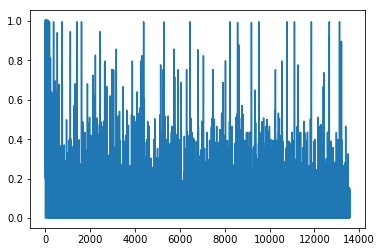

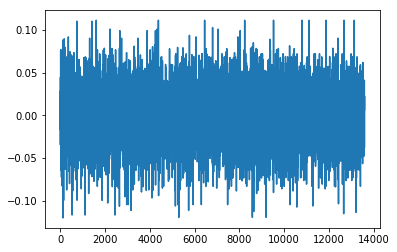

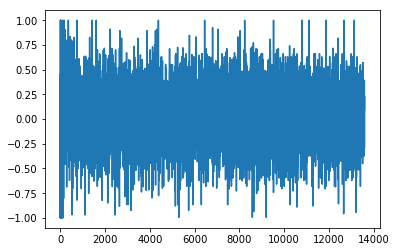

679
0.701468531223
[ 0.88888889  0.22222222  0.22222222  0.88888889  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222  0.22222222
  0.22222222  0.22222222  0.22222222  0.22222222  0.88888889  0.22222222
  0.88888889  0.88888889  0.22222222  0.22222222  0.33333333  0.77777778
  0.66666667  0.11111111  0.88888889  1.          0.66666667  0.66666667
  0.11111111  0.77777778  0.22222222  0.11111111  0.66666667  0.77777778
  0.66666667  0.11111111  0.66666667  0.66666667  0.66666667]
Writing away results
2011-08-01 00:00:00


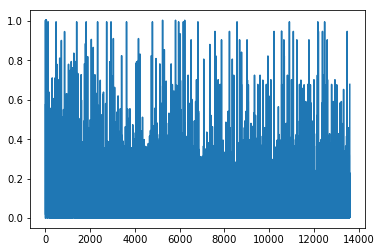

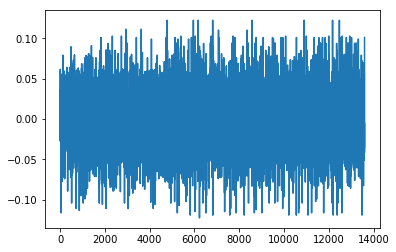

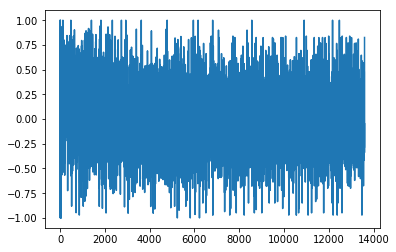

680
0.547421142418
[ 1.          0.33333333  1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.11111111  0.66666667  0.88888889
  0.11111111  0.66666667  1.          0.33333333  0.22222222  0.11111111
  0.33333333  0.22222222  0.77777778  0.11111111  0.22222222  0.11111111
  0.88888889  0.11111111  0.33333333  0.11111111  0.66666667  0.88888889]
Writing away results
2011-09-01 00:00:00


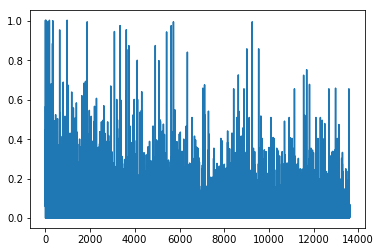

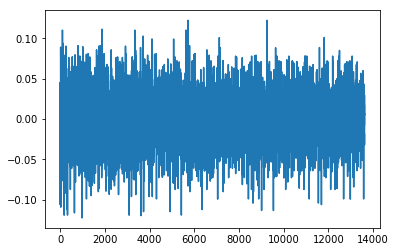

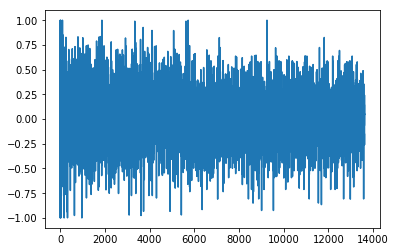

681
0.619304352234
[ 0.33333333  0.33333333  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.33333333  0.55555556
  0.55555556  0.55555556  0.66666667  0.66666667  0.11111111  0.77777778
  0.66666667  0.11111111  0.77777778  1.          0.11111111  0.11111111
  0.55555556  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.11111111  0.11111111  0.11111111  0.11111111]
Writing away results
2011-10-01 00:00:00


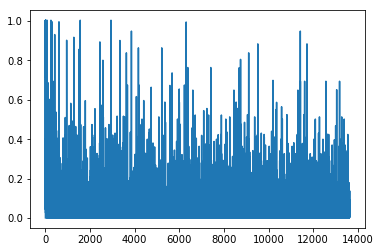

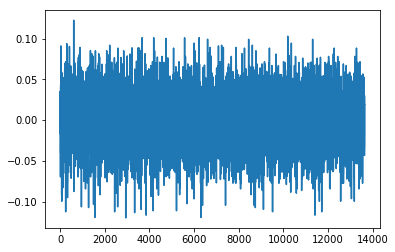

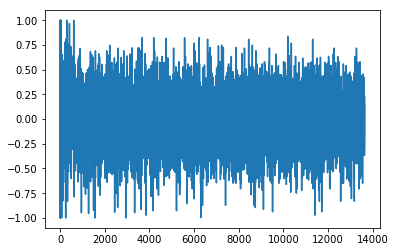

682
0.749667042513
[ 0.11111111  0.11111111  0.11111111  0.44444444  0.22222222  0.22222222
  0.44444444  0.44444444  0.11111111  0.11111111  0.44444444  0.44444444
  0.11111111  0.11111111  0.44444444  1.          0.44444444  0.44444444
  0.11111111  0.44444444  0.44444444  0.11111111  0.44444444  0.44444444
  0.44444444  0.11111111  0.11111111  0.11111111  0.44444444  0.44444444
  0.44444444  0.11111111  0.11111111  0.          0.44444444  0.11111111
  0.          0.77777778  0.11111111  0.66666667  0.55555556  1.
  0.77777778  0.77777778  0.11111111  0.77777778  0.55555556  0.33333333
  0.77777778  0.55555556  0.88888889  0.77777778  0.55555556  0.77777778
  0.          0.77777778  0.22222222  0.77777778  0.77777778]
Writing away results
2011-11-01 00:00:00


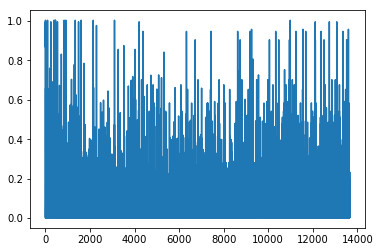

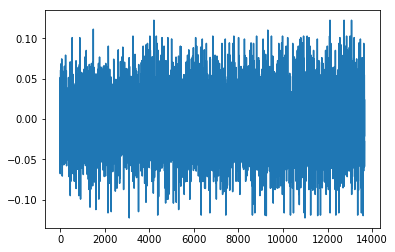

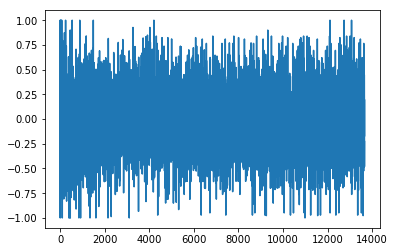

683
0.523440474286
[ 1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.55555556  1.          0.66666667  0.          0.          1.          0.
  0.          0.33333333  0.66666667  0.          0.55555556  0.
  0.77777778  0.          0.          0.          0.          0.          0.
  0.66666667  0.          0.          0.22222222]
Writing away results
2011-12-01 00:00:00


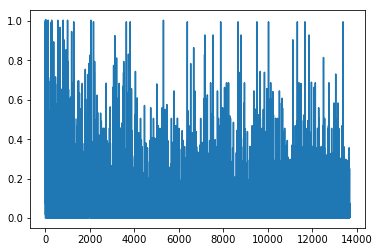

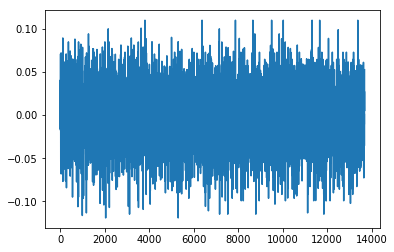

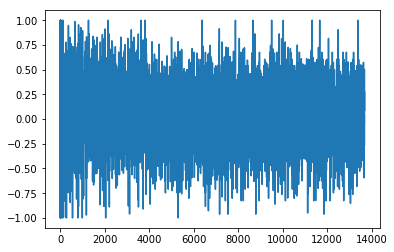

684
0.806727803778
[ 0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.22222222  0.44444444  1.          0.22222222  0.77777778
  1.          0.66666667  0.          0.66666667  0.22222222  0.77777778
  0.66666667  0.44444444  0.66666667  1.          0.66666667  0.77777778
  1.          0.66666667  0.66666667  1.          0.66666667  0.        ]
Writing away results
2012-01-01 00:00:00


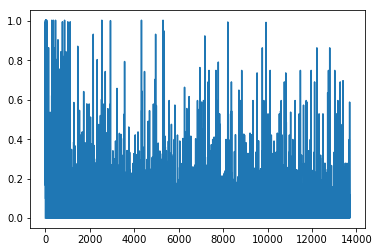

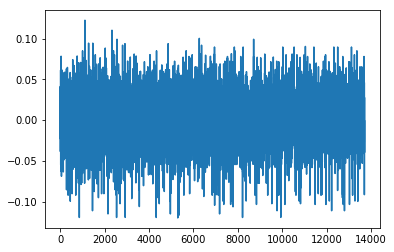

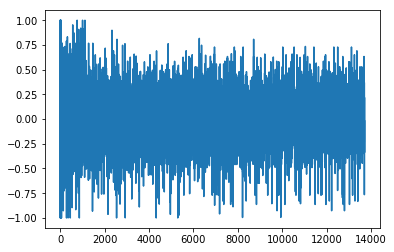

685
0.714623365953
[ 0.55555556  0.11111111  0.11111111  0.88888889  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.55555556  0.88888889  0.55555556
  0.55555556  0.11111111  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.88888889  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.11111111  0.22222222  0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.88888889  0.55555556  0.44444444
  0.77777778  0.22222222  0.44444444  0.77777778  0.22222222  0.          0.
  0.44444444  0.          0.77777778  0.33333333  0.77777778  0.77777778
  0.33333333  0.          0.66666667  0.66666667  0.          0.77777778
  0.22222222  0.          0.          0.22222222]
Writing away results
2012-02-01 00:00:00


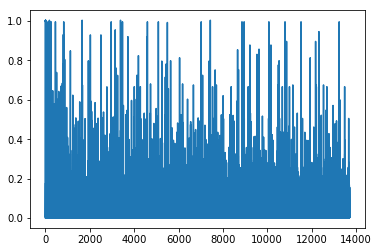

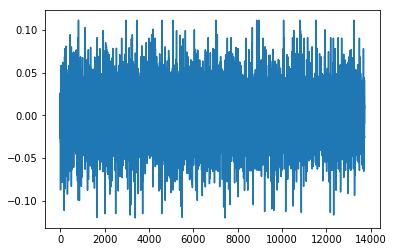

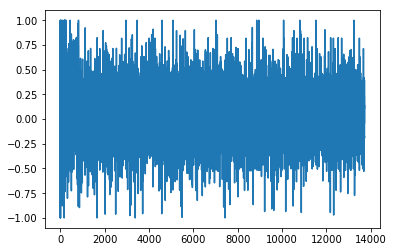

ValueError: operands could not be broadcast together with shapes (58,) (59,) 

In [11]:
# initialize
init = tf.global_variables_initializer()
startepsilon = 1
endepsilon = 0.1
startlr = 0.8
endlr = 0.01
startgamma = 0.01
endgamma = 0.8
TWlist = []
Index = []
MWeights = []
Turnover = []
chooserlist = []
RU = []
learningrateQ = 0.01
n = len(data)
periods = 60
epochs = 20     # preferred to have a low amount of epochs because otherwise the the same data is used multiple times (usually not the case in stock returns)

# data parsing
dates = data['Date']
mdata = data[['r','xs','xb']]
mdata.index = pd.DatetimeIndex(dates)

# include the lags
for i in range(1,num_lags+1):  # 1 till 11
    mdata['r_lag' + str(i)] = mdata['r'].shift(i)
    mdata['xs_lag' + str(i)] = mdata['xs'].shift(i)
    mdata['xb_lag' + str(i)] = mdata['xb'].shift(i)

mdata.drop(mdata.head(num_lags).index, inplace=True)
# have a look at the data (if not include NANs)
# print(mdata)

# Train the the Q-function DNN
with tf.Session() as sess:
    for i in range(466,int(n-periods-1)):
        lostlist = []
        sess.run(init) # initialize the Neural Network again
        OptimalWeights = np.zeros(periods-1)
        currentK = 0
        print(mdata.index[i])
        rmin = -1
        rmax = 1
        lr = 0.1
        gamma = 0.98
        currentEpoch = 0
        rlist = []  
        runitlist = []
        while currentEpoch < epochs:
            epsilon = startepsilon*(epochs - currentEpoch)/epochs + endepsilon*(1 - (epochs-currentEpoch)/epochs)
            #Training of the Q-Network for the data available (with Neural Nets) 
            indexes = np.asarray(range(i)) # because of range (automatically minus 1(start at 0))
            random.shuffle(indexes)
            for j in indexes:
                s = mdata.iloc[j,:].values.reshape(1,num_inputvar)
                #Choose an action by greedily (with e chance of random action) from the Q-network
                a_int,allQ = sess.run([A_Max,output],feed_dict={NN_input:s})
                a = A[a_int]  # -1 because index
                if np.random.rand(1) < epsilon:
                    a = random.choice(A)

                #Get new state and reward from environment
                s1 = mdata.iloc[j+1,:].values.reshape(1,num_inputvar)
                r = (a*s1[0][1] + (1-a)*s1[0][2]) #reward: this is now the wealth gained from this step, but could be other rewards like utility
                rlist.append(r)
                Q = sess.run(output,feed_dict={NN_input:s1})
                    
                #Obtain maxQ' and set our target value for chosen action.
                Q1 = np.max(Q)
                targetQ = allQ
                if(len(rlist)>1):
                    rmin = np.min(rlist)
                    rmax = np.max(rlist)
                runit = -1 + 2*((r -rmin)/(rmax-rmin))
                targetQ[0,int(a*(num_actions-1))] = runit + gamma*Q1
                runitlist.append(runit)
                #Train the neural network using target and predicted Q values
                opt,W1,loss_ = sess.run([optmzr,w1,loss],feed_dict={NN_input:s,Q_Next:targetQ,learning_rate:lr})
                lostlist.append(loss_)
            currentEpoch += 1
                
        while currentK < periods - 1:
            # After training now calculate the optimal weights for the K=60 periods to come
            s = mdata.iloc[i+currentK,:].values.reshape(1,num_inputvar)
            a_int,allQ = sess.run([A_Max,output],feed_dict={NN_input:s})
            aOpt = A[a_int]
            OptimalWeights[currentK] = aOpt
            currentK += 1
            
        # For insight purposes (Write away)
        plt.ion()
        plt.plot(lostlist)
        plt.show()
        plt.plot(rlist)
        plt.show()
        plt.plot(runitlist)
        plt.show()
        
        firstdiff = OptimalWeights[1:] - OptimalWeights[:-1]
        MWeights.append(np.mean(OptimalWeights))
        TerminalWealth = np.exp(sum(OptimalWeights*mdata[i+1:i+currentK+1]['xs'] + (1-OptimalWeights)*mdata[i+1:i+currentK+1]['xb']))
        TWlist.append(TerminalWealth)
        Index.append(mdata.index[i])
        print(i)
        Turnover.append(sum(abs(firstdiff*np.exp(mdata[i+1:i+currentK]['xs'])) + abs((1-firstdiff)*np.exp(mdata[i+1:i+currentK]['xb']))))
        RU.append((1/(1-5))*pow(TerminalWealth,(1-5)))
        print(TerminalWealth)
        print(OptimalWeights)
        print('Writing away results')
        df = pd.DataFrame({'index date':Index,'TW':TWlist, 'Mean Weights Xs':MWeights,'Turnover':Turnover, 'Realized Utility':RU})
        df.to_excel('DNN_epsilonlearn_currentK_w2_softmax_BVAR(3).xlsx', sheet_name='sheet1', index=False)
print('Done!')
        